In [2304]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pickle 
import json
import ast
from scipy.stats.mstats import winsorize
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

## Analisis de Datos

### Lectura de Datos

In [2305]:
df = pd.read_csv('datos/train_default.csv', sep = '|' )

In [2306]:
pd.set_option('display.max_columns',None)
df

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,6496,90000.0,2,1,2,26,0,0,0,0,0,0,17704.0,14478.0,17681.0,15240.0,19364.0,18828.0,5005.0,5145.0,1801.0,5024.0,8007.0,5046.0,0
1,15681,90000.0,2,1,2,27,2,2,0,0,0,0,28206.0,27459.0,28514.0,29733.0,30138.0,33248.0,0.0,1800.0,2000.0,1200.0,3600.0,0.0,1
2,17874,90000.0,2,2,1,29,0,0,0,0,0,0,13770.0,14024.0,9232.0,4173.0,4408.0,5846.0,1522.0,3010.0,1500.0,1500.0,1500.0,2000.0,0
3,7771,110000.0,1,2,2,47,0,0,0,0,0,0,72897.0,72755.0,71698.0,72418.0,72293.0,73954.0,3290.0,3200.0,2700.0,2800.0,3000.0,2650.0,0
4,2933,210000.0,1,2,1,37,0,0,0,0,0,0,85327.0,85263.0,48645.0,50826.0,52346.0,53819.0,2500.0,3000.0,3000.0,2500.0,2500.0,2000.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5620,27475,230000.0,2,3,1,37,0,0,0,0,0,0,228342.0,189966.0,142377.0,143828.0,143698.0,143342.0,6100.0,7000.0,5356.0,5400.0,5200.0,5500.0,0
5621,14027,50000.0,2,3,2,34,0,0,0,0,0,0,51037.0,47669.0,48940.0,50545.0,29523.0,28960.0,2100.0,2329.0,2943.0,990.0,1168.0,975.0,0
5622,23575,290000.0,2,2,1,34,0,0,0,0,-1,0,53437.0,44037.0,5441.0,7371.0,38832.0,41955.0,1274.0,1200.0,2033.0,38832.0,3900.0,188423.0,0
5623,21834,150000.0,2,2,2,26,0,0,0,0,0,0,83446.0,75067.0,64432.0,54848.0,46098.0,47352.0,3500.0,3000.0,2000.0,2000.0,2000.0,2000.0,0


In [2307]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5625 entries, 0 to 5624
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   CUSTOMER_ID                 5625 non-null   int64  
 1   LIMIT_BAL                   5625 non-null   float64
 2   SEX                         5625 non-null   int64  
 3   EDUCATION                   5625 non-null   int64  
 4   MARRIAGE                    5625 non-null   int64  
 5   AGE                         5625 non-null   int64  
 6   PAY_0                       5625 non-null   int64  
 7   PAY_2                       5625 non-null   int64  
 8   PAY_3                       5625 non-null   int64  
 9   PAY_4                       5625 non-null   int64  
 10  PAY_5                       5625 non-null   int64  
 11  PAY_6                       5625 non-null   int64  
 12  BILL_AMT1                   5625 non-null   float64
 13  BILL_AMT2                   5625 

In [2308]:
df.describe([0.01,0.05, 0.25, 0.5, 0.75, 0.95 ,0.99])

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000
mean,15238.895644,163935.587556,1.609956,1.838756,1.558044,35.380978,0.000711,-0.105244,-0.136889,-0.206756,-0.245867,-0.268800,49477.308622,47841.909511,4.609335e+04,41785.053867,39086.867378,37615.092622,5479.214400,6.446782e+03,5155.716622,4789.243200,4700.983644,5003.040178,0.220978
std,8559.798257,127902.220141,0.487803,0.786934,0.518728,9.144802,1.131000,1.211733,1.200299,1.158074,1.144049,1.162597,69292.868929,67238.808622,6.928598e+04,59771.019553,56487.673746,55559.215787,15342.151617,3.332234e+04,15494.010969,15631.744562,14347.984080,17544.870552,0.414942
min,2.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-11545.000000,-69777.000000,-2.032000e+04,-170000.000000,-61372.000000,-209051.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
1%,369.240000,10000.000000,1.000000,1.000000,1.000000,22.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-132.200000,-164.840000,-1.250000e+02,-156.080000,-135.200000,-250.200000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
5%,1727.400000,20000.000000,1.000000,1.000000,1.000000,23.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7920.000000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,3656.000000,3258.000000,2.904000e+03,2571.000000,1908.000000,1324.000000,1000.000000,7.880000e+02,500.000000,267.000000,216.000000,100.000000,0.000000
50%,15225.000000,130000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22872.000000,22453.000000,2.057100e+04,19561.000000,18874.000000,17934.000000,2130.000000,2.000000e+03,1831.000000,1500.000000,1500.000000,1500.000000,0.000000
75%,22623.000000,230000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,65802.000000,62147.000000,5.946500e+04,52330.000000,49366.000000,48833.000000,5000.000000,5.000000e+03,4400.000000,4000.000000,4000.000000,4000.000000,0.000000
95%,28545.000000,420000.000000,2.000000,3.000000,2.000000,53.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,192976.000000,186869.800000,1.789370e+05,165278.800000,159272.000000,153470.800000,17505.200000,1.829620e+04,17761.800000,15544.800000,16238.200000,16078.200000,1.000000


In [2309]:
df.isnull().sum()

CUSTOMER_ID                   0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

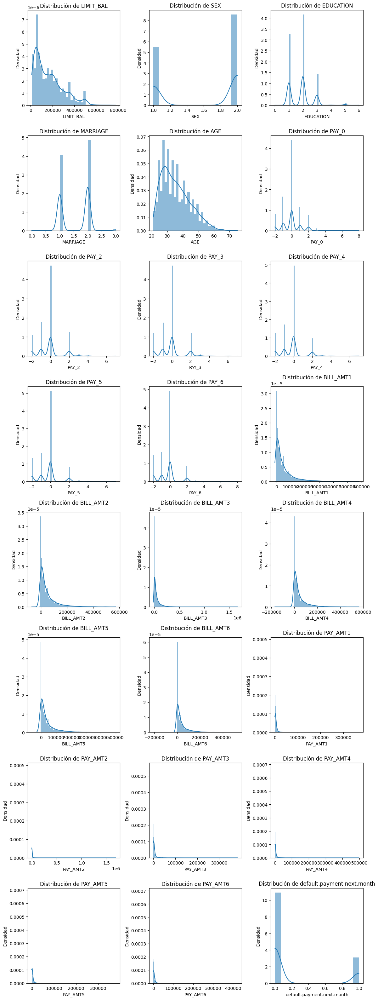

In [2310]:
aux = df.drop(columns = 'CUSTOMER_ID')
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.histplot(df[var], kde=True, stat="density", linewidth=0)
    plt.plot(linewidth=2)
    plt.title(f'Distribución de {var}')
    plt.xlabel(var)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

### Ingenieria de variables

In [2311]:
df

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,6496,90000.0,2,1,2,26,0,0,0,0,0,0,17704.0,14478.0,17681.0,15240.0,19364.0,18828.0,5005.0,5145.0,1801.0,5024.0,8007.0,5046.0,0
1,15681,90000.0,2,1,2,27,2,2,0,0,0,0,28206.0,27459.0,28514.0,29733.0,30138.0,33248.0,0.0,1800.0,2000.0,1200.0,3600.0,0.0,1
2,17874,90000.0,2,2,1,29,0,0,0,0,0,0,13770.0,14024.0,9232.0,4173.0,4408.0,5846.0,1522.0,3010.0,1500.0,1500.0,1500.0,2000.0,0
3,7771,110000.0,1,2,2,47,0,0,0,0,0,0,72897.0,72755.0,71698.0,72418.0,72293.0,73954.0,3290.0,3200.0,2700.0,2800.0,3000.0,2650.0,0
4,2933,210000.0,1,2,1,37,0,0,0,0,0,0,85327.0,85263.0,48645.0,50826.0,52346.0,53819.0,2500.0,3000.0,3000.0,2500.0,2500.0,2000.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5620,27475,230000.0,2,3,1,37,0,0,0,0,0,0,228342.0,189966.0,142377.0,143828.0,143698.0,143342.0,6100.0,7000.0,5356.0,5400.0,5200.0,5500.0,0
5621,14027,50000.0,2,3,2,34,0,0,0,0,0,0,51037.0,47669.0,48940.0,50545.0,29523.0,28960.0,2100.0,2329.0,2943.0,990.0,1168.0,975.0,0
5622,23575,290000.0,2,2,1,34,0,0,0,0,-1,0,53437.0,44037.0,5441.0,7371.0,38832.0,41955.0,1274.0,1200.0,2033.0,38832.0,3900.0,188423.0,0
5623,21834,150000.0,2,2,2,26,0,0,0,0,0,0,83446.0,75067.0,64432.0,54848.0,46098.0,47352.0,3500.0,3000.0,2000.0,2000.0,2000.0,2000.0,0


In [2312]:
# Ratio de deuda respecto al limite de credito
df['Ratio_Debt'] = df[['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']].sum(axis = 1)/df['LIMIT_BAL'] 

In [2313]:
df['Max_Estatus_Pay'] = df[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']].max(axis = 1) # Maximo valor Pay

In [2314]:
df['Promedio_Estatus_Pay'] = df[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']].mean(axis = 1) # Promedio valor Pay

In [2315]:
df['Pago_desviacion'] = df[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].std(axis = 1)

In [2316]:
df['Ratio_Payment'] = df[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].sum(axis = 1) / df['LIMIT_BAL'] # Cantidad pagada sobre limite de credito

In [2317]:
df['Count_Pay_Retrasados'] = (df[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']] > 0 ).sum(axis = 1) # Conrteo de registros de meses atrasados

In [2318]:
df['Count_Pay_A_Tiempo'] = (df[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']] == -1).sum(axis = 1) # Conteo de meses pagados a tiempo

In [2319]:
df['Total_Pay'] = df[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].sum(axis = 1) # Total pagado 

In [2320]:
df['Total_Bill'] = df[['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']].sum(axis = 1) # Deuda total

In [2321]:
df['Pay/Bill'] =np.where(df['Total_Bill'] == 0, 0, df['Total_Pay'] / df['Total_Bill']) # Ratio de pago sobre deuda

In [2322]:
df['Pay_amount_mean'] = df[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].mean(axis = 1) # Promedio de cantidad a pagar

In [2323]:
len(df[df['Pay/Bill'] == np.inf])

0

In [2324]:
df['Pay_tendencia'] = df['PAY_AMT1'] - df ['PAY_AMT6'] # Comparacion del ultimo mes y el primero respecto a lo que se paga

In [2325]:
df['Bill_tendencia'] = df['BILL_AMT1'] - df['BILL_AMT6'] # Comparacion del ultimo mes y el primero respecto a la deuda

In [2326]:
df['Bill_amount_mean'] = df[['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']].mean(axis = 1) # Promedio de cantidad de deuda

In [2327]:
df['Diff_Bill_Pay'] = df['Total_Bill'] - df ['Total_Pay'] # Diferencia de Deuda con lo que se paga

In [2328]:
df['Pay_tendencia_Amplia'] = df[['PAY_AMT1','PAY_AMT2','PAY_AMT3']].mean(axis = 1) - df[['PAY_AMT4','PAY_AMT5','PAY_AMT6']].mean(axis =1)
# Tendencia amplia de la cantidad pagada 

In [2329]:
df['Bill_tendencia_Amplia'] = df[['BILL_AMT1','BILL_AMT2','BILL_AMT3']].mean(axis = 1) - df[['BILL_AMT4','BILL_AMT5','BILL_AMT6']].mean(axis =1)
# Tendencia amplia de la deuda

In [2330]:
df['Diff_Bill_Pay_Tendencia'] = ((df['BILL_AMT1'] - df['PAY_AMT1']) - (df['BILL_AMT6'] - df['PAY_AMT6']))
# Tendencia de la diferencia entre la deuda y lo pagado 

In [2331]:
df['Diff_Bill_Pay_Tendencia_Amplia'] = (
    (df[['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3']].mean(axis=1)  - df[['PAY_AMT1','PAY_AMT2', 'PAY_AMT3']].mean(axis=1))
    - 
    ( df[['BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6']].mean(axis=1) - df[['PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']].mean(axis=1))
)
# Tendencia amplia de la diferencia entre la deuda y lo pagado 

In [2332]:
df['Meses_Pago_Completo'] = ((df['PAY_AMT1'] >= df['BILL_AMT1']).astype(int) + ( # Comparamos donde el pago fur mayor a la deuda
                            df['PAY_AMT2'] >= df['BILL_AMT2']).astype(int) + (
                            df['PAY_AMT3'] >= df['BILL_AMT3']).astype(int) + (
                            df['PAY_AMT4'] >= df['BILL_AMT4']).astype(int) + (
                            df['PAY_AMT5'] >= df['BILL_AMT5']).astype(int) +(
                            df['PAY_AMT6'] >= df['BILL_AMT6']).astype(int))

In [2333]:
df['Meses_Deuda'] = ((df['PAY_AMT1'] <= df['BILL_AMT1']).astype(int) +( # Comparamos donde la deuda es mayor a el pago
                    df['PAY_AMT2'] <= df['BILL_AMT2']).astype(int) + (
                    df['PAY_AMT3'] <= df['BILL_AMT3']).astype(int) + (
                    df['PAY_AMT4'] <= df['BILL_AMT4']).astype(int) + (
                    df['PAY_AMT5'] <= df['BILL_AMT5']).astype(int) + (
                    df['PAY_AMT6'] <= df['BILL_AMT6']).astype(int))

In [2334]:
df['Age_Quartile'] = pd.qcut(df['AGE'], q =4, labels = ['Joven', 'Adulto joven', 'Adulto', 'Mayor']) # Dividimos las edades en 4 bins 

In [2335]:
df['Pay_tendencia_ponderada'] = ((df['PAY_AMT1'] * 1) +( # Le damos un mayor peso a las variables mas cercanas inmediatamente 
                                df['PAY_AMT2'] * 0.75) + (
                                df['PAY_AMT3'] * 0.6) + (
                                df['PAY_AMT4'] * 0.45) + (
                                df['PAY_AMT5'] * 0.3 ) + (
                                df['PAY_AMT6'] * 0.15))

In [2336]:
df['Bill_tendencia_ponderada'] = ((df['BILL_AMT1'] * 1) + ( # Le damos un mayor peso a las variables mas cercanas inmediatamente 
                                df['BILL_AMT2'] * 0.75) + (
                                df['BILL_AMT3'] * 0.6) + (
                                df['BILL_AMT4'] * 0.45 ) + (
                                df['BILL_AMT5'] * 0.3) + (
                                df['BILL_AMT6'] * 0.15))

In [2337]:
df.isna().sum()

CUSTOMER_ID                       0
LIMIT_BAL                         0
SEX                               0
EDUCATION                         0
MARRIAGE                          0
AGE                               0
PAY_0                             0
PAY_2                             0
PAY_3                             0
PAY_4                             0
PAY_5                             0
PAY_6                             0
BILL_AMT1                         0
BILL_AMT2                         0
BILL_AMT3                         0
BILL_AMT4                         0
BILL_AMT5                         0
BILL_AMT6                         0
PAY_AMT1                          0
PAY_AMT2                          0
PAY_AMT3                          0
PAY_AMT4                          0
PAY_AMT5                          0
PAY_AMT6                          0
default.payment.next.month        0
Ratio_Debt                        0
Max_Estatus_Pay                   0
Promedio_Estatus_Pay        

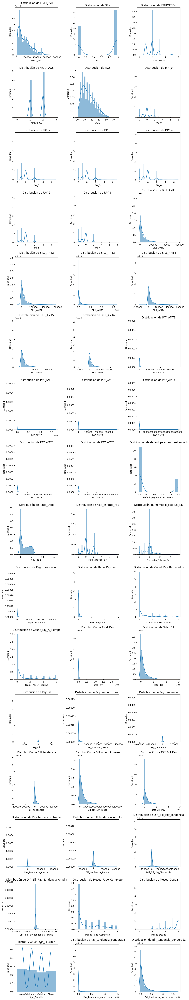

In [2338]:
aux = df.drop(columns = 'CUSTOMER_ID')
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.histplot(df[var], kde=True, stat="density", linewidth=0)
    plt.plot(linewidth=2)
    plt.title(f'Distribución de {var}')
    plt.xlabel(var)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

In [2339]:
lst_column_log = ['LIMIT_BAL','AGE','BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','PAY_AMT2',
                  'PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6','Ratio_Debt','Ratio_Payment','Total_Pay','Total_Bill',
                  'Pay_amount_mean','Bill_amount_mean','Diff_Bill_Pay','Pay_tendencia_ponderada','Bill_tendencia_ponderada','Pago_desviacion']

In [2340]:
df.columns

Index(['CUSTOMER_ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE',
       'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1',
       'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6',
       'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default.payment.next.month', 'Ratio_Debt', 'Max_Estatus_Pay',
       'Promedio_Estatus_Pay', 'Pago_desviacion', 'Ratio_Payment',
       'Count_Pay_Retrasados', 'Count_Pay_A_Tiempo', 'Total_Pay', 'Total_Bill',
       'Pay/Bill', 'Pay_amount_mean', 'Pay_tendencia', 'Bill_tendencia',
       'Bill_amount_mean', 'Diff_Bill_Pay', 'Pay_tendencia_Amplia',
       'Bill_tendencia_Amplia', 'Diff_Bill_Pay_Tendencia',
       'Diff_Bill_Pay_Tendencia_Amplia', 'Meses_Pago_Completo', 'Meses_Deuda',
       'Age_Quartile', 'Pay_tendencia_ponderada', 'Bill_tendencia_ponderada'],
      dtype='object')

In [2341]:
lst_column_log

['LIMIT_BAL',
 'AGE',
 'BILL_AMT1',
 'BILL_AMT2',
 'BILL_AMT3',
 'BILL_AMT4',
 'BILL_AMT5',
 'BILL_AMT6',
 'PAY_AMT1',
 'PAY_AMT2',
 'PAY_AMT3',
 'PAY_AMT4',
 'PAY_AMT5',
 'PAY_AMT6',
 'Ratio_Debt',
 'Ratio_Payment',
 'Total_Pay',
 'Total_Bill',
 'Pay_amount_mean',
 'Bill_amount_mean',
 'Diff_Bill_Pay',
 'Pay_tendencia_ponderada',
 'Bill_tendencia_ponderada',
 'Pago_desviacion']

In [2342]:
for col in lst_column_log:
    offset = abs(df[col].min()) + 1
    df[f'{col}_log'] = np.log1p(df[col] + offset)

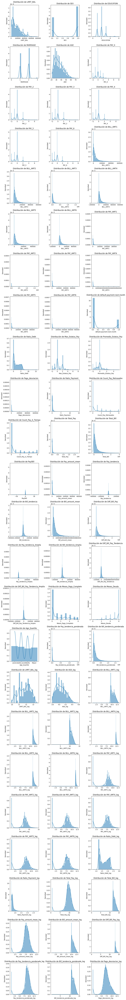

In [2343]:
aux = df.drop(columns = 'CUSTOMER_ID')
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.histplot(df[var], kde=True, stat="density", linewidth=0)
    plt.plot(linewidth=2)
    plt.title(f'Distribución de {var}')
    plt.xlabel(var)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

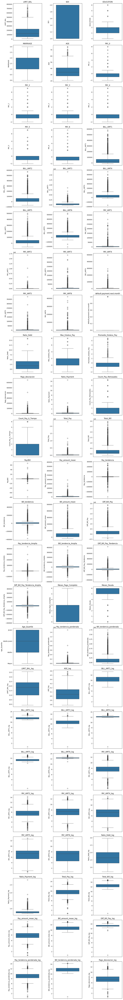

In [2344]:
aux = df.drop(columns = 'CUSTOMER_ID')
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i) 
    sns.boxplot(y=df[var])  
    plt.title(var)  
plt.tight_layout()  
plt.show()


In [2345]:
pd.set_option('display.max_rows', None)
df.isnull().sum()

CUSTOMER_ID                       0
LIMIT_BAL                         0
SEX                               0
EDUCATION                         0
MARRIAGE                          0
AGE                               0
PAY_0                             0
PAY_2                             0
PAY_3                             0
PAY_4                             0
PAY_5                             0
PAY_6                             0
BILL_AMT1                         0
BILL_AMT2                         0
BILL_AMT3                         0
BILL_AMT4                         0
BILL_AMT5                         0
BILL_AMT6                         0
PAY_AMT1                          0
PAY_AMT2                          0
PAY_AMT3                          0
PAY_AMT4                          0
PAY_AMT5                          0
PAY_AMT6                          0
default.payment.next.month        0
Ratio_Debt                        0
Max_Estatus_Pay                   0
Promedio_Estatus_Pay        

In [2346]:
pd.reset_option('display.max_rows')

In [2347]:
df.describe([0.01,0.05, 0.25, 0.5, 0.75, 0.95 ,0.99])

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Meses_Pago_Completo,Meses_Deuda,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
count,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000
mean,15238.895644,163935.587556,1.609956,1.838756,1.558044,35.380978,0.000711,-0.105244,-0.136889,-0.206756,-0.245867,-0.268800,49477.308622,47841.909511,4.609335e+04,41785.053867,39086.867378,37615.092622,5479.214400,6.446782e+03,5155.716622,4789.243200,4700.983644,5003.040178,0.220978,2.245973,0.455822,-0.160474,5975.619367,0.235346,0.863822,1.124978,3.157498e+04,2.618996e+05,0.368810,5262.496711,476.174222,11862.216000,43649.930637,2.303246e+05,862.815407,8308.518696,11386.041778,7445.703289,1.443200,5.154311,1.772364e+04,1.491864e+05,11.767648,4.055285,10.541851,11.564610,10.771337,12.231976,11.411146,12.394273,6.739499,6.651032,6.500870,6.195874,6.163331,6.090106,1.663700,0.796948,9.246429,12.584195,7.544404,10.792796,13.315172,8.703228,11.863444,7.182995
std,8559.798257,127902.220141,0.487803,0.786934,0.518728,9.144802,1.131000,1.211733,1.200299,1.158074,1.144049,1.162597,69292.868929,67238.808622,6.928598e+04,59771.019553,56487.673746,55559.215787,15342.151617,3.332234e+04,15494.010969,15631.744562,14347.984080,17544.870552,0.414942,2.077937,1.349706,0.989332,17323.292892,0.345712,1.593444,1.914195,6.325550e+04,3.542477e+05,2.066490,10542.583493,20284.526270,43493.263595,59041.287557,3.378154e+05,14283.995852,30537.620371,50453.561758,33431.897747,1.855852,1.273433,3.821051e+04,2.020230e+05,0.817936,0.151468,0.957986,0.453216,0.771784,0.274410,0.443325,0.243752,2.998225,3.047008,3.027835,3.139506,3.169887,3.241328,0.363248,0.113081,2.267177,0.720053,1.942801,0.715150,0.422747,2.159263,0.806599,2.104521
min,2.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-11545.000000,-69777.000000,-2.032000e+04,-170000.000000,-61372.000000,-209051.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,-1.395540,-2.000000,-2.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,-1.254800e+05,-78.333333,0.000000,-402466.000000,-377092.000000,-20913.333333,-4.331410e+05,-165343.333333,-267860.333333,-408587.000000,-372591.333333,0.000000,0.000000,0.000000e+00,-5.233275e+04,9.903588,3.784190,0.6931

### Outiliers

In [2348]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5625 entries, 0 to 5624
Data columns (total 73 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   CUSTOMER_ID                     5625 non-null   int64   
 1   LIMIT_BAL                       5625 non-null   float64 
 2   SEX                             5625 non-null   int64   
 3   EDUCATION                       5625 non-null   int64   
 4   MARRIAGE                        5625 non-null   int64   
 5   AGE                             5625 non-null   int64   
 6   PAY_0                           5625 non-null   int64   
 7   PAY_2                           5625 non-null   int64   
 8   PAY_3                           5625 non-null   int64   
 9   PAY_4                           5625 non-null   int64   
 10  PAY_5                           5625 non-null   int64   
 11  PAY_6                           5625 non-null   int64   
 12  BILL_AMT1           

In [2349]:
lst_out_upper = ['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','Pago_desviacion',
           'PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6','Promedio_Estatus_Pay','Ratio_Payment','Total_Pay', 'Total_Bill',
                 'Pay/Bill','Pay_amount_mean','Bill_amount_mean','Diff_Bill_Pay','Ratio_Payment_log','Pay_tendencia_ponderada','Bill_tendencia_ponderada']
lst_out_both = ['Pay/Bill','Pay_tendencia','Bill_tendencia','Pay_tendencia_Amplia','Bill_tendencia_Amplia','Diff_Bill_Pay_Tendencia',
                'Diff_Bill_Pay_Tendencia_Amplia','BILL_AMT1_log','BILL_AMT2_log','BILL_AMT3_log','BILL_AMT4_log','BILL_AMT5_log','Pago_desviacion_log',
                'BILL_AMT6_log','PAY_AMT2_log','PAY_AMT3_log','PAY_AMT4_log','PAY_AMT5_log','Total_Pay_log','Diff_Bill_Pay_log','Pay_tendencia_ponderada_log']
lst_out_lower = ['Total_Bill_log','Bill_amount_mean_log','Bill_tendencia_ponderada_log']

In [2350]:
for v in lst_out_upper: # Debido a la gran cantidad de outliers vistos en los boxplot, aplicamos winsorize parta no perder tantos datos
    df[v] = winsorize(df[v], limits = [0, 0.1])

for v in lst_out_both:
    df[v] = winsorize(df[v], limits = [0.05, 0.05])

for v in lst_out_lower:
    df[v] = winsorize(df[v], limits = [0.1, 0])


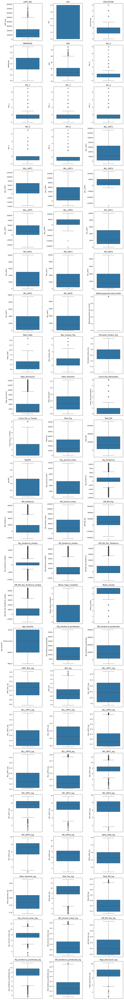

In [2351]:
aux = df.drop(columns = 'CUSTOMER_ID')
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.boxplot(y=df[var])  
    plt.title(var)  
plt.tight_layout()  
plt.show()

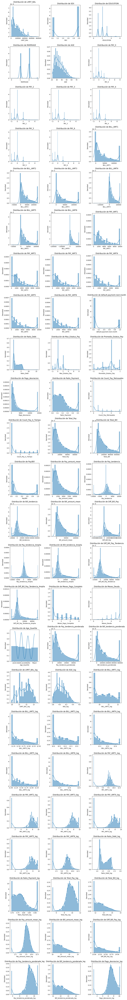

In [2352]:
aux = df.drop(columns = 'CUSTOMER_ID')
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.histplot(df[var], kde=True, stat="density", linewidth=0)
    plt.plot(linewidth=2)
    plt.title(f'Distribución de {var}')
    plt.xlabel(var)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

### Codificacion

In [2353]:
df

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
0,6496,90000.0,2,1,2,26,0,0,0,0,0,0,17704.0,14478.0,17681.0,15240.0,19364.0,18828.0,5005.0,5145.0,1801.0,5024.0,8007.0,5046.0,0,1.147722,0,0.000000,1964.650673,0.333644,0,0,30028.0,103295.0,0.290701,5004.666667,-41.0,-1124.0,17215.833333,73267.0,-2042.000000,-1189.666667,-1083.0,852.333333,0,6,Joven,15364.15,54662.50,11.512945,3.891820,10.283669,11.341627,10.545420,12.129418,11.298965,12.336579,8.518592,8.546169,7.497207,8.522380,8.988321,8.526747,1.513645,0.847431,10.309952,12.340503,8.518526,10.548787,13.135102,9.639922,11.580558,7.584087
1,15681,90000.0,2,1,2,27,2,2,0,0,0,0,28206.0,27459.0,28514.0,29733.0,30138.0,33248.0,0.0,1800.0,2000.0,1200.0,3600.0,0.0,1,1.969978,2,0.666667,1364.795467,0.095556,2,0,8600.0,177298.0,0.048506,1433.333333,0.0,-5042.0,29549.666667,168698.0,-333.333333,-2980.000000,-5042.0,-2646.666667,0,6,Joven,4170.00,93317.10,11.512945,3.912023,10.590441,11.484917,10.796223,12.204747,11.424225,12.397936,0.693147,7.496652,7.601902,7.091742,8.189245,0.693147,1.679993,0.739819,9.059750,12.620762,7.269152,10.829035,13.307749,8.336151,11.888974,7.220224
2,17874,90000.0,2,2,1,29,0,0,0,0,0,0,13770.0,14024.0,9232.0,4173.0,4408.0,5846.0,1522.0,3010.0,1500.0,1500.0,1500.0,2000.0,0,0.571700,0,0.000000,607.027731,0.122578,0,0,11032.0,51453.0,0.214409,1838.666667,-478.0,7924.0,8575.500000,40421.0,344.000000,7533.000000,8402.0,7189.000000,0,6,Adulto joven,6104.50,33904.35,11.512945,3.951244,10.139231,11.336224,10.293974,12.067816,11.094102,12.277923,7.329094,8.010360,7.314553,7.314553,7.314553,7.601902,1.378071,0.752631,9.308737,12.083538,7.517883,10.291835,13.068042,8.717109,11.364879,6.411864
3,7771,110000.0,1,2,2,47,0,0,0,0,0,0,72897.0,72755.0,71698.0,72418.0,72293.0,73954.0,3290.0,3200.0,2700.0,2800.0,3000.0,2650.0,0,3.963773,0,0.000000,266.458252,0.160364,0,0,17640.0,436015.0,0.040457,2940.000000,640.0,-1057.0,72669.166667,418375.0,246.666667,-438.333333,-1697.0,-685.000000,0,6,Mayor,9867.50,235851.15,11.695264,4.248495,11.343844,11.867336,11.429761,12.398427,11.803107,12.553227,8.099251,8.071531,7.901748,7.938089,8.007034,7.883069,1.995967,0.770277,9.778038,13.238362,7.986845,11.446620,13.654776,9.197204,12.571361,5.592695
4,2933,210000.0,1,2,1,37,0,0,0,0,0,0,85327.0,85263.0,48645.0,50826.0,52346.0,53819.0,2500.0,3000.0,3000.0,2500.0,2500.0,2000.0,0,1.791552,0,0.000000,376.386326,0.073810,0,0,15500.0,376226.0,0.041199,2583.333333,500.0,31508.0,62704.333333,360726.0,500.000000,20748.000000,31008.0,20248.000000,0,6,Adulto,8725.00,225109.60,12.301392,4.094345,11.481166,11.951451,11.141383,12.305139,11.641495,12.479423,7.824846,8.007034,8.007034,7.824846,7.824846,7.601902,1.646173,0.729387,9.648724,13.125774,7.857610,11.334034,13.584674,9.074177,12.533376,5.935916
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [2354]:
df['Age_Quartile'].unique()

['Joven', 'Adulto joven', 'Mayor', 'Adulto']
Categories (4, object): ['Joven' < 'Adulto joven' < 'Adulto' < 'Mayor']

In [2355]:
df = pd.get_dummies(df, columns = ['EDUCATION'],prefix='EDUCATION') # Codificamos las variables para el modelo
df = pd.get_dummies(df, columns = ['MARRIAGE'],prefix='MARRIAGE')
df = pd.get_dummies(df, columns = ['SEX'],prefix='SEX')
mapeo_Age = {'Joven':1, 'Adulto joven' :2, 'Adulto':3, 'Mayor':4}
df['Age_Quartile'] = df['Age_Quartile'].map(mapeo_Age)

In [2356]:
aux = df.drop(columns = ['default.payment.next.month'])
cod_columns = aux.columns

In [2357]:
df

,CUSTOMER_ID,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,6496,90000.0,26,0,0,0,0,0,0,17704.0,14478.0,17681.0,15240.0,19364.0,18828.0,5005.0,5145.0,1801.0,5024.0,8007.0,5046.0,0,1.147722,0,0.000000,1964.650673,0.333644,0,0,30028.0,103295.0,0.290701,5004.666667,-41.0,-1124.0,17215.833333,73267.0,-2042.000000,-1189.666667,-1083.0,852.333333,0,6,1,15364.15,54662.50,11.512945,3.891820,10.283669,11.341627,10.545420,12.129418,11.298965,12.336579,8.518592,8.546169,7.497207,8.522380,8.988321,8.526747,1.513645,0.847431,10.309952,12.340503,8.518526,10.548787,13.135102,9.639922,11.580558,7.584087,False,True,False,False,False,False,False,False,False,True,False,False,True
1,15681,90000.0,27,2,2,0,0,0,0,28206.0,27459.0,28514.0,29733.0,30138.0,33248.0,0.0,1800.0,2000.0,1200.0,3600.0,0.0,1,1.969978,2,0.666667,1364.795467,0.095556,2,0,8600.0,177298.0,0.048506,1433.333333,0.0,-5042.0,29549.666667,168698.0,-333.333333,-2980.000000,-5042.0,-2646.666667,0,6,1,4170.00,93317.10,11.512945,3.912023,10.590441,11.484917,10.796223,12.204747,11.424225,12.397936,0.693147,7.496652,7.601902,7.091742,8.189245,0.693147,1.679993,0.739819,9.059750,12.620762,7.269152,10.829035,13.307749,8.336151,11.888974,7.220224,False,True,False,False,False,False,False,False,False,True,False,False,True
2,17874,90000.0,29,0,0,0,0,0,0,13770.0,14024.0,9232.0,4173.0,4408.0,5846.0,1522.0,3010.0,1500.0,1500.0,1500.0,2000.0,0,0.571700,0,0.000000,607.027731,0.122578,0,0,11032.0,51453.0,0.214409,1838.666667,-478.0,7924.0,8575.500000,40421.0,344.000000,7533.000000,8402.0,7189.000000,0,6,2,6104.50,33904.35,11.512945,3.951244,10.139231,11.336224,10.293974,12.067816,11.094102,12.277923,7.329094,8.010360,7.314553,7.314553,7.314553,7.601902,1.378071,0.752631,9.308737,12.083538,7.517883,10.291835,13.068042,8.717109,11.364879,6.411864,False,False,True,False,False,False,False,False,True,False,False,False,True
3,7771,110000.0,47,0,0,0,0,0,0,72897.0,72755.0,71698.0,72418.0,72293.0,73954.0,3290.0,3200.0,2700.0,2800.0,3000.0,2650.0,0,3.963773,0,0.000000,266.458252,0.160364,0,0,17640.0,436015.0,0.040457,2940.000000,640.0,-1057.0,72669.166667,418375.0,246.666667,-438.333333,-1697.0,-685.000000,0,6,4,9867.50,235851.15,11.695264,4.248495,11.343844,11.867336,11.429761,12.398427,11.803107,12.553227,8.099251,8.071531,7.901748,7.938089,8.007034,7.883069,1.995967,0.770277,9.778038,13.238362,7.986845,11.446620,13.654776,9.197204,12.571361,5.592695,False,False,True,False,False,False,False,False,False,True,False,True,False
4,2933,210000.0,37,0,0,0,0,0,0,85327.0,85263.0,48645.0,50826.0,52346.0,53819.0,2500.0,3000.0,3000.0,2500.0,2500.0,2000.0,0,1.791552,0,0.000000,376.386326,0.073810,0,0,15500.0,376226.0,0.041199,2583.333333,500.0,31508.0,62704.333333,360726.0,500.000000,20748.000000,31008.0,20248.000000,0,6,3,8725.00,225109.60,12.301392,4.094345,11.481166,11.951451,11.141383,12.305139,11.641495,12.479423,7.824846,8.007034,8.007034,7.824846,7.8248

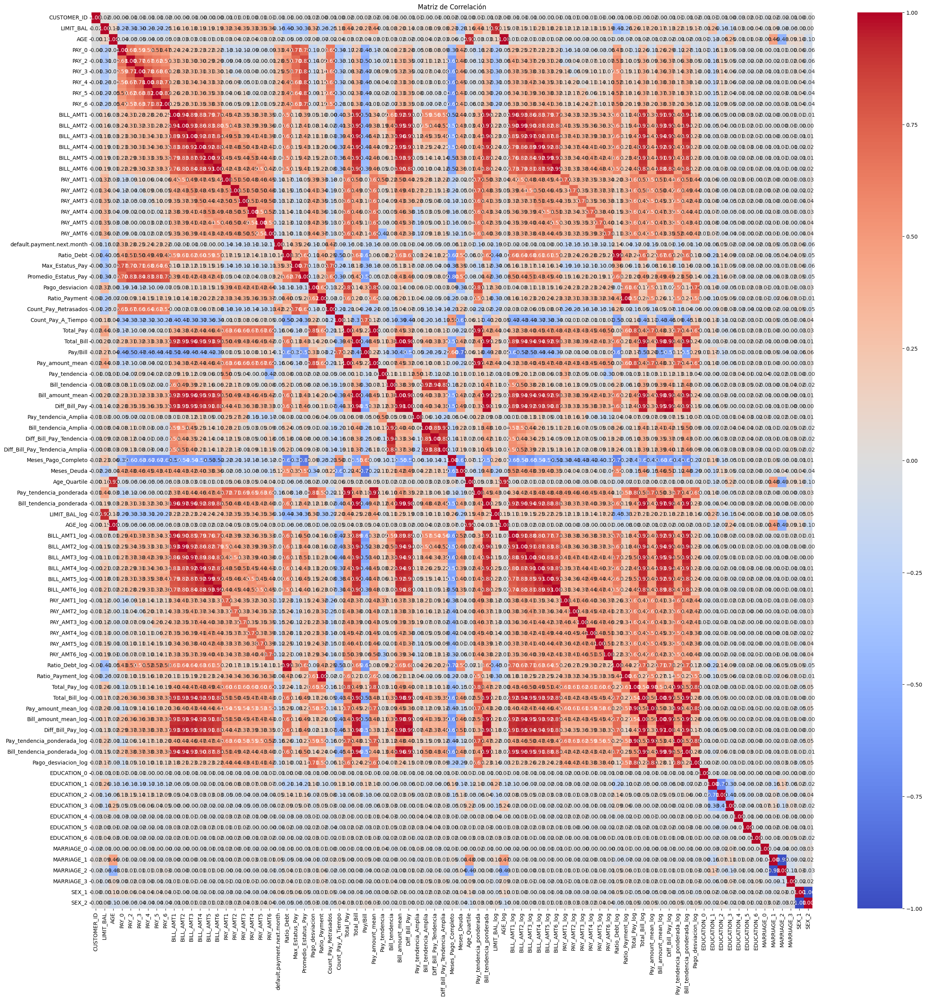

In [2358]:
correlation_matrix = df.corr()
target_correlation = correlation_matrix["default.payment.next.month"].sort_values(ascending=False)
plt.figure(figsize=(30, 30))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz de Correlación")
plt.show()

In [2359]:
df['default.payment.next.month'].value_counts()/len(df)

default.payment.next.month
0    0.779022
1    0.220978
Name: count, dtype: float64

In [2360]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5625 entries, 0 to 5624
Data columns (total 83 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   CUSTOMER_ID                     5625 non-null   int64   
 1   LIMIT_BAL                       5625 non-null   float64 
 2   AGE                             5625 non-null   int64   
 3   PAY_0                           5625 non-null   int64   
 4   PAY_2                           5625 non-null   int64   
 5   PAY_3                           5625 non-null   int64   
 6   PAY_4                           5625 non-null   int64   
 7   PAY_5                           5625 non-null   int64   
 8   PAY_6                           5625 non-null   int64   
 9   BILL_AMT1                       5625 non-null   float64 
 10  BILL_AMT2                       5625 non-null   float64 
 11  BILL_AMT3                       5625 non-null   float64 
 12  BILL_AMT4           

In [2361]:
numeric_columns = df.select_dtypes(include = ['float64']).columns

In [2362]:
numeric_columns

Index(['LIMIT_BAL', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'Ratio_Debt',
       'Promedio_Estatus_Pay', 'Pago_desviacion', 'Ratio_Payment', 'Total_Pay',
       'Total_Bill', 'Pay/Bill', 'Pay_amount_mean', 'Pay_tendencia',
       'Bill_tendencia', 'Bill_amount_mean', 'Diff_Bill_Pay',
       'Pay_tendencia_Amplia', 'Bill_tendencia_Amplia',
       'Diff_Bill_Pay_Tendencia', 'Diff_Bill_Pay_Tendencia_Amplia',
       'Pay_tendencia_ponderada', 'Bill_tendencia_ponderada', 'LIMIT_BAL_log',
       'AGE_log', 'BILL_AMT1_log', 'BILL_AMT2_log', 'BILL_AMT3_log',
       'BILL_AMT4_log', 'BILL_AMT5_log', 'BILL_AMT6_log', 'PAY_AMT1_log',
       'PAY_AMT2_log', 'PAY_AMT3_log', 'PAY_AMT4_log', 'PAY_AMT5_log',
       'PAY_AMT6_log', 'Ratio_Debt_log', 'Ratio_Payment_log', 'Total_Pay_log',
       'Total_Bill_log', 'Pay_amount_mean_log', 'Bill_amount_mean_log',
       'Diff_Bill_Pay_l

In [2363]:
len(numeric_columns)

55

In [2364]:
numeric_columns

Index(['LIMIT_BAL', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'Ratio_Debt',
       'Promedio_Estatus_Pay', 'Pago_desviacion', 'Ratio_Payment', 'Total_Pay',
       'Total_Bill', 'Pay/Bill', 'Pay_amount_mean', 'Pay_tendencia',
       'Bill_tendencia', 'Bill_amount_mean', 'Diff_Bill_Pay',
       'Pay_tendencia_Amplia', 'Bill_tendencia_Amplia',
       'Diff_Bill_Pay_Tendencia', 'Diff_Bill_Pay_Tendencia_Amplia',
       'Pay_tendencia_ponderada', 'Bill_tendencia_ponderada', 'LIMIT_BAL_log',
       'AGE_log', 'BILL_AMT1_log', 'BILL_AMT2_log', 'BILL_AMT3_log',
       'BILL_AMT4_log', 'BILL_AMT5_log', 'BILL_AMT6_log', 'PAY_AMT1_log',
       'PAY_AMT2_log', 'PAY_AMT3_log', 'PAY_AMT4_log', 'PAY_AMT5_log',
       'PAY_AMT6_log', 'Ratio_Debt_log', 'Ratio_Payment_log', 'Total_Pay_log',
       'Total_Bill_log', 'Pay_amount_mean_log', 'Bill_amount_mean_log',
       'Diff_Bill_Pay_l

In [2365]:
categorical_columns = df.select_dtypes(exclude = ['float64']).columns

In [2366]:
categorical_columns = [col for col in categorical_columns if col != 'default.payment.next.month']

In [2367]:
categorical_columns

['CUSTOMER_ID',
 'AGE',
 'PAY_0',
 'PAY_2',
 'PAY_3',
 'PAY_4',
 'PAY_5',
 'PAY_6',
 'Max_Estatus_Pay',
 'Count_Pay_Retrasados',
 'Count_Pay_A_Tiempo',
 'Meses_Pago_Completo',
 'Meses_Deuda',
 'Age_Quartile',
 'EDUCATION_0',
 'EDUCATION_1',
 'EDUCATION_2',
 'EDUCATION_3',
 'EDUCATION_4',
 'EDUCATION_5',
 'EDUCATION_6',
 'MARRIAGE_0',
 'MARRIAGE_1',
 'MARRIAGE_2',
 'MARRIAGE_3',
 'SEX_1',
 'SEX_2']

In [2368]:
sc = StandardScaler()
y = df['default.payment.next.month']
df_scaled = sc.fit_transform(df[numeric_columns])
df_scaled = pd.DataFrame(df_scaled, columns = numeric_columns)

In [2369]:
df_scaled.describe() # Comprobamos que se aplico standar_scaler correctamente

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
count,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03,5.625000e+03
mean,-1.080025e-16,-5.431704e-17,-8.210716e-17,2.526374e-18,-1.515825e-17,-5.305386e-17,-7.168587e-17,-4.547474e-17,5.558023e-17,4.042199e-17,3.915880e-17,4.042199e-17,-7.326485e-17,5.747501e-17,7.010688e-17,-3.536924e-17,-1.313715e-16,-7.326485e-17,2.526374e-17,-2.873751e-17,5.052748e-18,1.263187e-18,-1.263187e-17,3.789561e-17,1.136868e-17,6.315935e-18,-6.063298e-17,1.010550e-17,-2.779012e-17,-1.818989e-16,-8.968628e-17,7.092795e-16,4.366838e-15,9.196002e-16,-3.137757e-15,7.604386e-16,6.241407e-15,6.126457e-16,-1.483740e-14,-4.294836e-17,-1.338978e-16,-1.490561e-16,6.631732e-17,-5.987507e-16,4.547474e-16,1.169080e-15,-1.442560e-15,3.183231e-16,2.148681e-15,5.204331e-16,-7.958079e-16,-3.605136e-15,-6.088562e-16,-1.788673e-15,3.663243e-16
std,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00,1.000089e+00
min,-1.203648e+00,-1.187284e+00,-2.521768e+00,-1.383590e+00,-5.328291e+00,-2.559380e+00,-6.668912e+00,-1.037913e+00,-9.939945e-01,-9.331942e-01,-8.957068e-01,-8.771152e-01,-8.826448e-01,-1.752621e+00,-2.180064e+00,-7.817403e-01,-1.228311e+00,-1.046736e+00,-1.507130e+00,-8.377241e-01,-1.046736e+00,-2.459646e+00,-1.327574e+00,-1.507130e+00,-2.856901e+00,-2.496131e+00,-1.283783e+00,-1.461168e+00,-1.332662e+00,-1.083525e+00,-1.355412e+00,-2.279183e+00,-1.789948e+00,-1.284524e+00,-1.013596e+00,-1.161606e+00,-9.082175e-01,-9.734527e-01,-8.555909e-01,-2.016823e+00,-1.978703e+00,-1.938856e+00,-1.772704e+00,-1.743534e+00,-1.665194e+00,-2.672109e+00,-1.284508e+00,-2.960611e+00,-1.166385e+00,-3.526798e+00,-1.166372e+00,-9.616761e-01,-3.218213e+00,-1.216064e+00,-3.144295e+00
25%,-8.908815e-01,-8.438225e-01,-8.424410e-01,-8.346679e-01,-8.356855e-01,-8.329330e-01,-8.256379e-01,-7.284240e-01,-7.531230e-01,-7.762445e-01,-8.038292e-01,-8.057768e-01,-8.492130e-01,-9.842297e-01,-7.317027e-01,-6

In [2370]:
df_categorical = df[categorical_columns]

In [2371]:
df_categorical

,CUSTOMER_ID,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,6496,26,0,0,0,0,0,0,0,0,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True
1,15681,27,2,2,0,0,0,0,2,2,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True
2,17874,29,0,0,0,0,0,0,0,0,0,0,6,2,False,False,True,False,False,False,False,False,True,False,False,False,True
3,7771,47,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,True,False
4,2933,37,0,0,0,0,0,0,0,0,0,0,6,3,False,False,True,False,False,False,False,False,True,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5620,27475,37,0,0,0,0,0,0,0,0,0,0,6,3,False,False,False,True,False,False,False,False,True,False,False,False,True
5621,14027,34,0,0,0,0,0,0,0,0,0,0,6,2,False,False,False,True,False,False,False,False,False,True,False,False,True
5622,23575,34,0,0,0,0,-1,0,0,0,1,2,4,2,False,False,True,False,False,False,False,False,True,False,False,False,True
5623,21834,26,0,0,0,0,0,0,0,0,0,0,6,1,False,False,True,False,False,False,False,False,False,True,False,False,True


### Modelo sin PCA

In [2372]:
df_sin_PCA = pd.concat([df_scaled, df_categorical.reset_index(drop=True)], axis=1)

In [2373]:
pd.set_option('display.max_rows', None)
df_sin_PCA.isnull().sum()

LIMIT_BAL                         0
BILL_AMT1                         0
BILL_AMT2                         0
BILL_AMT3                         0
BILL_AMT4                         0
BILL_AMT5                         0
BILL_AMT6                         0
PAY_AMT1                          0
PAY_AMT2                          0
PAY_AMT3                          0
PAY_AMT4                          0
PAY_AMT5                          0
PAY_AMT6                          0
Ratio_Debt                        0
Promedio_Estatus_Pay              0
Pago_desviacion                   0
Ratio_Payment                     0
Total_Pay                         0
Total_Bill                        0
Pay/Bill                          0
Pay_amount_mean                   0
Pay_tendencia                     0
Bill_tendencia                    0
Bill_amount_mean                  0
Diff_Bill_Pay                     0
Pay_tendencia_Amplia              0
Bill_tendencia_Amplia             0
Diff_Bill_Pay_Tendencia     

In [2374]:
pd.reset_option('display.max_rows')

In [2375]:
df_sin_PCA

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,CUSTOMER_ID,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,-0.578115,-0.526412,-0.584454,-0.485399,-0.505869,-0.356687,-0.339455,0.511078,0.578701,-0.367861,0.833106,1.767359,0.804322,-0.528576,0.302841,-0.342143,0.890355,0.318392,-0.507977,-0.033469,0.318392,-0.180843,-0.471484,-0.507977,-0.535494,-0.604292,-0.499515,-0.424412,-0.358197,0.233136,-0.539279,-0.311424,-1.079302,-0.268543,-0.537483,-0.295290,-0.479018,-0.265606,-0.324149,0.593435,0.648611,0.348277,0.770203,0.920696,0.751808,-0.413128,0.921586,0.586554,-0.356055,0.501445,-0.356063,-0.496365,0.509800,-0.365719,0.209226,6496,26,0,0,0,0,0,0,0,0,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True
1,-0.578115,-0.289123,-0.285976,-0.229350,-0.128567,-0.062743,0.061068,-1.037913,-0.443780,-0.305395,-0.482774,0.311858,-0.882645,-0.132833,1.130476,-0.476362,-0.621526,-0.655764,-0.184775,-0.703528,-0.655764,-0.171097,-0.624810,-0.184775,-0.098032,-0.223368,-0.603154,-0.567881,-0.557806,-0.726168,-0.244431,-0.311424,-0.945910,0.066775,-0.175634,0.051815,-0.102433,0.057727,0.053974,-2.016823,0.297483,0.383470,0.305537,0.664050,-1.665194,0.044857,-0.617156,-0.252382,0.045166,-0.141690,0.045155,-0.003855,-0.303135,0.025553,0.032150,15681,27,2,2,0,0,0,0,2,2,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True
2,-0.578115,-0.615300,-0.594893,-0.685099,-0.793980,-0.764726,-0.700037,-0.566871,-0.073914,-0.462345,-0.379540,-0.381710,-0.214010,-0.805810,0.302841,-0.645916,-0.449933,-0.545201,-0.734392,-0.244539,-0.545201,-0.284728,-0.117401,-0.734392,-0.686062,-0.072365,0.005423,-0.080686,0.003294,-0.560388,-0.697617,-0.311424,-0.686950,-0.426421,-0.551126,-0.643286,-0.786984,-0.794415,-0.685623,0.196665,0.469350,0.286880,0.377905,0.383118,0.466454,-0.786390,-0.433950,-0.085302,-0.723928,-0.013652,-0.723929,-0.687665,-0.065598,-0.639340,-0.361244,17874,29,0,0,0,0,0,0,0,0,0,0,6,2,False,False,True,False,False,False,False,False,True,False,False,False,True
3,-0.421731,0.720657,0.755536,0.791346,0.982668,1.087357,1.191698,-0.019695,-0.015836,-0.085666,0.067804,0.113696,0.003297,0.826759,0.302841,-0.722119,-0.209990,-0.244789,0.945148,-0.725795,-0.244789,-0.018955,-0.468862,0.945148,1.046504,-0.094064,-0.456022,-0.446662,-0.445898,-0.237910,0.842785,-0.088504,1.275696,0.890285,0.790083,0.928618,0.865822,1.035726,1.010979,0.453559,0.489815,0.484261,0.580427,0.605528,0.553206,0.914790,-0.181642,0.229618,0.929326,0.227754,0.929321,0.986110,0.233754,0.891261,-0.759897,7771,47,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,True,False
4,0.360185,1.001509,1.043138,0.246466,0.420555,0.543150,0.632438,-0.264191,-0.076971,0.008504,-0.035430,-0.051439,-0.214010,-0.218708,0.302841,-0.697522,-0.759615,-0.342078,0.684025,-0.723744,-0.342078,-0.052236,0.805530,0.684025,0.782237,-0.037587,0.770415,0.738529,0.748277,-0.335819,0.760851,0.652608,0.257894,1.040386,1.00249

In [2376]:
X = df_sin_PCA.drop(columns = ['CUSTOMER_ID'])

In [2377]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

In [2378]:
model_logreg = LogisticRegression( max_iter = 2000)

In [2379]:
model_logreg.fit(X_train,y_train)

LogisticRegression(max_iter=2000)

In [2380]:
model_lda = LinearDiscriminantAnalysis()

In [2381]:
model_lda.fit(X_train, y_train)

LinearDiscriminantAnalysis()

In [2382]:
cv_scores = cross_val_score(model_logreg, X_train, y_train, cv=5, scoring='roc_auc')

In [2383]:
print(cv_scores)
print("roc_auc: %0.2f (+/- %0.2f)" % (cv_scores.mean(), cv_scores.std() * 2))

[0.769268   0.76385235 0.79956095 0.77075493 0.78023694]
roc_auc: 0.78 (+/- 0.03)


In [2384]:
y_pred = model_logreg.predict(X_test)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"Roc_AUC Regresion Logistica con conunto de prueba: {roc_auc}")

Roc_AUC Regresion Logistica con conunto de prueba: 0.5834985909612775


In [2385]:
cv_scores_LDA = cross_val_score(model_lda, X_train, y_train, cv=5, scoring='roc_auc')

In [2386]:
print(cv_scores_LDA)
print("roc_auc: %0.2f (+/- %0.2f)" % (cv_scores_LDA.mean(), cv_scores_LDA.std() * 2))

[0.77171672 0.76377262 0.79847189 0.77119968 0.77650148]
roc_auc: 0.78 (+/- 0.02)


In [2387]:
y_pred = model_lda.predict(X_test)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"Roc_AUC LDA con conunto de prueba: {roc_auc}")

Roc_AUC LDA con conunto de prueba: 0.5911961173155204


### Modelo con PCA

In [2388]:
df_scaled

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
0,-0.578115,-0.526412,-0.584454,-0.485399,-0.505869,-0.356687,-0.339455,0.511078,0.578701,-0.367861,0.833106,1.767359,0.804322,-0.528576,0.302841,-0.342143,0.890355,0.318392,-0.507977,-0.033469,0.318392,-0.180843,-0.471484,-0.507977,-0.535494,-0.604292,-0.499515,-0.424412,-0.358197,0.233136,-0.539279,-0.311424,-1.079302,-0.268543,-0.537483,-0.295290,-0.479018,-0.265606,-0.324149,0.593435,0.648611,0.348277,0.770203,0.920696,0.751808,-0.413128,0.921586,0.586554,-0.356055,0.501445,-0.356063,-0.496365,0.509800,-0.365719,0.209226
1,-0.578115,-0.289123,-0.285976,-0.229350,-0.128567,-0.062743,0.061068,-1.037913,-0.443780,-0.305395,-0.482774,0.311858,-0.882645,-0.132833,1.130476,-0.476362,-0.621526,-0.655764,-0.184775,-0.703528,-0.655764,-0.171097,-0.624810,-0.184775,-0.098032,-0.223368,-0.603154,-0.567881,-0.557806,-0.726168,-0.244431,-0.311424,-0.945910,0.066775,-0.175634,0.051815,-0.102433,0.057727,0.053974,-2.016823,0.297483,0.383470,0.305537,0.664050,-1.665194,0.044857,-0.617156,-0.252382,0.045166,-0.141690,0.045155,-0.003855,-0.303135,0.025553,0.032150
2,-0.578115,-0.615300,-0.594893,-0.685099,-0.793980,-0.764726,-0.700037,-0.566871,-0.073914,-0.462345,-0.379540,-0.381710,-0.214010,-0.805810,0.302841,-0.645916,-0.449933,-0.545201,-0.734392,-0.244539,-0.545201,-0.284728,-0.117401,-0.734392,-0.686062,-0.072365,0.005423,-0.080686,0.003294,-0.560388,-0.697617,-0.311424,-0.686950,-0.426421,-0.551126,-0.643286,-0.786984,-0.794415,-0.685623,0.196665,0.469350,0.286880,0.377905,0.383118,0.466454,-0.786390,-0.433950,-0.085302,-0.723928,-0.013652,-0.723929,-0.687665,-0.065598,-0.639340,-0.361244
3,-0.421731,0.720657,0.755536,0.791346,0.982668,1.087357,1.191698,-0.019695,-0.015836,-0.085666,0.067804,0.113696,0.003297,0.826759,0.302841,-0.722119,-0.209990,-0.244789,0.945148,-0.725795,-0.244789,-0.018955,-0.468862,0.945148,1.046504,-0.094064,-0.456022,-0.446662,-0.445898,-0.237910,0.842785,-0.088504,1.275696,0.890285,0.790083,0.928618,0.865822,1.035726,1.010979,0.453559,0.489815,0.484261,0.580427,0.605528,0.553206,0.914790,-0.181642,0.229618,0.929326,0.227754,0.929321,0.986110,0.233754,0.891261,-0.759897
4,0.360185,1.001509,1.043138,0.246466,0.420555,0.543150,0.632438,-0.264191,-0.076971,0.008504,-0.035430,-0.051439,-0.214010,-0.218708,0.302841,-0.697522,-0.759615,-0.342078,0.684025,-0.723744,-0.342078,-0.052236,0.805530,0.684025,0.782237,-0.037587,0.770415,0.738529,0.748277,-0.335819,0.760851,0.652608,0.257894,1.040386,1.002499,0.529509,0.399455,0.618559,0.556148,0.362029,0.468237,0.519652,0.543646,0.547013,0.466454,-0.048255,-0.766314,0.142843,0.768144,0.161228,0.768137,0.786129,0.157043,0.843071,-0.592867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5620,0.516569,2.077445,2.095526,2.129379,2.112048,2.144833,2.113873,0.849968,1.145727,0.748051,0.962492,0.840291,0.956102,0.993924,0.302841,-0.629088,-0.274254,0.524243,2.096676,-0.741307,0.524243,-0.028464,2.787812,2.096676,2.092170,0.026024,2.074306,2.673393,2.016955,0.577163,2.099903,0.758996,0.257894,1.857918

In [2389]:
pca = PCA(n_components = 48)
X_PCA = pca.fit_transform(df_scaled)

In [2390]:
X_PCA

array([[-4.85084235e-01,  2.73738309e+00, -1.29220787e+00, ...,
        -8.73519118e-03,  3.04306719e-02, -7.37660051e-03],
       [-1.39185987e+00, -1.52935374e+00, -1.48576953e+00, ...,
        -4.34316607e-02,  4.52046911e-03, -1.71035178e-02],
       [-3.08487623e+00,  3.27828320e-01, -1.53986369e-01, ...,
         1.08923942e-02, -1.88380581e-02,  2.52551757e-02],
       ...,
       [ 2.37729914e+00,  5.71986789e+00,  1.83325772e+00, ...,
        -4.71756523e-02,  8.02550540e-02,  1.65586062e-02],
       [ 2.83582070e+00, -2.42896824e+00,  1.00716675e+00, ...,
         5.63796881e-04,  3.46253518e-02, -2.42729457e-02],
       [ 9.33987397e+00,  2.74604151e-01,  2.33855266e-01, ...,
        -3.23907709e-02,  5.43703308e-02,  2.90531051e-02]])

In [2391]:
y

0       0
1       1
2       0
3       0
4       0
       ..
5620    0
5621    0
5622    0
5623    0
5624    0
Name: default.payment.next.month, Length: 5625, dtype: int64

In [2392]:
df_pca = pd.DataFrame(X_PCA, columns=[f'PCA_{i+1}' for i in range(X_PCA.shape[1])])

In [2393]:
df_pca

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14,PCA_15,PCA_16,PCA_17,PCA_18,PCA_19,PCA_20,PCA_21,PCA_22,PCA_23,PCA_24,PCA_25,PCA_26,PCA_27,PCA_28,PCA_29,PCA_30,PCA_31,PCA_32,PCA_33,PCA_34,PCA_35,PCA_36,PCA_37,PCA_38,PCA_39,PCA_40,PCA_41,PCA_42,PCA_43,PCA_44,PCA_45,PCA_46,PCA_47,PCA_48
0,-0.485084,2.737383,-1.292208,0.588955,-0.999090,-0.979246,-0.955792,-0.588340,0.534049,-1.360283,0.458623,0.666487,0.880801,-0.199863,0.541505,-0.389962,0.266742,0.070975,-0.025279,0.623929,-0.070304,0.005010,0.545944,-0.024914,-0.023784,-0.592423,0.033097,0.162418,-0.053258,-0.156155,-0.043187,0.174261,0.078487,-0.051204,-0.143564,0.086123,0.013443,0.010682,-0.026534,-0.017956,0.015578,-0.007192,-0.003370,0.016940,0.012762,-0.008735,0.030431,-0.007377
1,-1.391860,-1.529354,-1.485770,-0.956685,-0.361436,-0.533211,0.321459,-0.539016,1.488655,-0.146696,0.511947,-2.142985,0.723108,-0.061515,0.411685,-0.215298,-0.259847,0.080126,-0.420754,-0.099773,-0.253678,-0.380870,0.302261,0.839356,-0.426959,0.059429,-0.209125,0.210764,0.009254,0.043512,0.245018,0.075994,0.095702,0.016801,-0.044296,0.037599,-0.047433,0.006928,-0.037280,-0.006951,-0.007223,0.001263,-0.025287,-0.013038,0.010213,-0.043432,0.004520,-0.017104
2,-3.084876,0.327828,-0.153986,0.713250,-0.416664,-1.801913,0.219635,-0.429684,0.350373,-0.474434,-0.005008,0.245206,0.685332,0.248134,-0.029134,-0.749646,-0.022110,0.007056,-0.195551,0.125912,0.061703,0.129588,0.001201,-0.009637,0.015142,0.145486,0.114068,-0.004801,-0.182150,-0.003188,-0.140054,0.047304,0.009600,-0.058609,0.005403,0.015302,-0.042654,-0.084996,-0.008274,0.027975,-0.056189,-0.037145,0.055838,0.070781,-0.021438,0.010892,-0.018838,0.025255
3,3.698838,-1.975356,-1.361131,-1.586157,-0.106405,-0.924278,-0.204466,1.234773,-0.519816,0.047818,0.125657,0.223053,-0.383254,0.090141,-0.530978,-0.334705,0.086267,-0.168491,-0.119794,-0.109485,-0.024661,0.007456,-0.043984,-0.039444,-0.056380,-0.121903,-0.191067,0.171889,-0.201910,-0.012211,0.007579,0.087808,0.064200,0.035288,0.117552,0.024373,-0.063766,0.108399,-0.023669,-0.012077,-0.007674,0.032313,-0.013221,-0.016371,-0.000834,-0.009819,-0.015262,-0.001271
4,2.824625,-2.167106,1.421959,-0.268717,-0.298690,-1.462574,-0.021144,0.056284,-0.083684,0.028505,0.024095,-0.316814,0.205336,0.287776,-0.502597,-0.616531,0.045463,-0.264525,-0.060224,0.293520,0.230254,-0.020596,-0.360366,0.071292,-0.103491,-0.017091,0.193923,0.193828,-0.314380,-0.049872,0.196584,0.068836,0.095740,-0.028275,0.070589,-0.018402,-0.050504,0.057049,0.003494,-0.001430,0.048274,0.045419,-0.105672,-0.043332,-0.048359,0.037118,0.069298,0.008873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5620,10.090868,-3.290018,2.737222,0.398282,-0.730302,-0.325883,0.224185,0.011202,-0.366950,-0.710942,0.010770,-0.117736,-0.784419,0.043496,0.323698,-0.336537,0.437842,0.132229,1.034315,-0.009668,0.536638,0.503279,0.368791,0.300426,-0.075608,0.140605,0.100014,-0.032692,-0.247603,-0.018977,-0.152869,-0.073192,0.499382,-0.339541,0.040639,-0.339950,0.084723,0.031826,0.074905,0.155380,-0.164466,-0.126589,0.042412,-0.022725,-0.012216,-0.044954,-0.105268,-0.136008
5621,1.024494,-2.143716,-1.398455,1.357932,0.115155,-0.823259,0.435639,0.123680,-0.348274,-0.308768,0.247576,-0.108477,-0.245434,0.206681,-0.514403,0.475089,0.058603,-0.120851,-0.058156,-0.415532,-0.111360,-0.104610,0.141841,-0.269988,0.115749,0.088295,-0.081523,-0.129746,-0.049882,0.127102,0.122394,0.026064,-0.012217,-0.014137,-0.055348,0.001608,0.008734,0.027431,0.044260,0.003707,-0.011338,-0.031979,-0.014701,-0.008608,-0.014162,0.023690,0.006443,-0.012748
5622,2.377299,5.719868,1.833258,2.633334,-5.278524,1.243154,-0.842962,-0.501260,-0.377438,0.973002,-1.408793,-0.461693,0.138252,0.251356,-0.867601,-0.529241,-0.243024,0.194169,1.009556,-0.080547,0.687795,0.327458,-1.119722,0.649495,-0.002030,-0.52099

In [2394]:
X_train, X_test, y_train, y_test = train_test_split(X_PCA, y, test_size=0.10, random_state=42)

In [2395]:
model_logreg_PCA = LogisticRegression(max_iter = 2000)

In [2396]:
model_logreg_PCA.fit(X_train,y_train)

LogisticRegression(max_iter=2000)

In [2397]:
model_lda_PCA = LinearDiscriminantAnalysis()

In [2398]:
model_lda_PCA.fit(X_train, y_train)

LinearDiscriminantAnalysis()

In [2399]:
cv_scores_PCA = cross_val_score(model_logreg_PCA, X_train, y_train, cv=5, scoring='roc_auc')

In [2400]:
print(cv_scores_PCA)
print("roc_auc: %0.2f (+/- %0.2f)" % (cv_scores_PCA.mean(), cv_scores_PCA.std() * 2))

[0.76920536 0.74306671 0.79123617 0.76383282 0.77194799]
roc_auc: 0.77 (+/- 0.03)


In [2401]:
y_pred = model_logreg_PCA.predict(X_test)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"Roc_AUC Regresion Logistica con conunto de prueba: {roc_auc}")

Roc_AUC Regresion Logistica con conunto de prueba: 0.5571443481891243


In [2402]:
cv_scores_LDA_PCA = cross_val_score(model_lda_PCA, X_train, y_train, cv=5, scoring='roc_auc')

In [2403]:
print(cv_scores_LDA_PCA)
print("roc_auc: %0.2f (+/- %0.2f)" % (cv_scores_LDA_PCA.mean(), cv_scores_LDA_PCA.std() * 2))

[0.76796961 0.74443343 0.78373247 0.76940358 0.77244567]
roc_auc: 0.77 (+/- 0.03)


In [2404]:
y_pred = model_lda_PCA.predict(X_test)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"Roc_AUC LDA con conjunto de prueba: {roc_auc}")

Roc_AUC LDA con conjunto de prueba: 0.5746355634415337


### Modelo Combinado

In [2405]:
df_Com = pd.concat([df_pca, df_categorical.reset_index(drop = True)], axis = 1)

In [2406]:
df_Com

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14,PCA_15,PCA_16,PCA_17,PCA_18,PCA_19,PCA_20,PCA_21,PCA_22,PCA_23,PCA_24,PCA_25,PCA_26,PCA_27,PCA_28,PCA_29,PCA_30,PCA_31,PCA_32,PCA_33,PCA_34,PCA_35,PCA_36,PCA_37,PCA_38,PCA_39,PCA_40,PCA_41,PCA_42,PCA_43,PCA_44,PCA_45,PCA_46,PCA_47,PCA_48,CUSTOMER_ID,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,-0.485084,2.737383,-1.292208,0.588955,-0.999090,-0.979246,-0.955792,-0.588340,0.534049,-1.360283,0.458623,0.666487,0.880801,-0.199863,0.541505,-0.389962,0.266742,0.070975,-0.025279,0.623929,-0.070304,0.005010,0.545944,-0.024914,-0.023784,-0.592423,0.033097,0.162418,-0.053258,-0.156155,-0.043187,0.174261,0.078487,-0.051204,-0.143564,0.086123,0.013443,0.010682,-0.026534,-0.017956,0.015578,-0.007192,-0.003370,0.016940,0.012762,-0.008735,0.030431,-0.007377,6496,26,0,0,0,0,0,0,0,0,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True
1,-1.391860,-1.529354,-1.485770,-0.956685,-0.361436,-0.533211,0.321459,-0.539016,1.488655,-0.146696,0.511947,-2.142985,0.723108,-0.061515,0.411685,-0.215298,-0.259847,0.080126,-0.420754,-0.099773,-0.253678,-0.380870,0.302261,0.839356,-0.426959,0.059429,-0.209125,0.210764,0.009254,0.043512,0.245018,0.075994,0.095702,0.016801,-0.044296,0.037599,-0.047433,0.006928,-0.037280,-0.006951,-0.007223,0.001263,-0.025287,-0.013038,0.010213,-0.043432,0.004520,-0.017104,15681,27,2,2,0,0,0,0,2,2,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True
2,-3.084876,0.327828,-0.153986,0.713250,-0.416664,-1.801913,0.219635,-0.429684,0.350373,-0.474434,-0.005008,0.245206,0.685332,0.248134,-0.029134,-0.749646,-0.022110,0.007056,-0.195551,0.125912,0.061703,0.129588,0.001201,-0.009637,0.015142,0.145486,0.114068,-0.004801,-0.182150,-0.003188,-0.140054,0.047304,0.009600,-0.058609,0.005403,0.015302,-0.042654,-0.084996,-0.008274,0.027975,-0.056189,-0.037145,0.055838,0.070781,-0.021438,0.010892,-0.018838,0.025255,17874,29,0,0,0,0,0,0,0,0,0,0,6,2,False,False,True,False,False,False,False,False,True,False,False,False,True
3,3.698838,-1.975356,-1.361131,-1.586157,-0.106405,-0.924278,-0.204466,1.234773,-0.519816,0.047818,0.125657,0.223053,-0.383254,0.090141,-0.530978,-0.334705,0.086267,-0.168491,-0.119794,-0.109485,-0.024661,0.007456,-0.043984,-0.039444,-0.056380,-0.121903,-0.191067,0.171889,-0.201910,-0.012211,0.007579,0.087808,0.064200,0.035288,0.117552,0.024373,-0.063766,0.108399,-0.023669,-0.012077,-0.007674,0.032313,-0.013221,-0.016371,-0.000834,-0.009819,-0.015262,-0.001271,7771,47,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,True,False
4,2.824625,-2.167106,1.421959,-0.268717,-0.298690,-1.462574,-0.021144,0.056284,-0.083684,0.028505,0.024095,-0.316814,0.205336,0.287776,-0.502597,-0.616531,0.045463,-0.264525,-0.060224,0.293520,0.230254,-0.020596,-0.360366,0.071292,-0.103491,-0.017091,0.193923,0.193828,-0.314380,-0.049872,0.196584,0.068836,0.095740,-0.028275,0.070589,-0.018402,-0.050504,0.057049,0.003494,-0.001430,0.048274,0.045419,-0.105672,-0.043332,-0.048359,0.037118,0.069298,0.008873,2933,37,0,0,0,0,0,0,0,0,0,0,6,3,False,False,True,False,False,False,False,False,True,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5620,10.090868,-3.290018,2.737222,0.398282,-0.730302,-0.325883,0.224185,0.011202,-0.366950,-0.710942,0.010770,-0.117736,-0.784419,0.043496,0.323698,-0.336537,0.437842,0.132229,1.034315,-0.009668,0.536638,0.503279,0.368791,0.300426,-0.075

In [2407]:
X_com = df_Com.drop(columns = ['CUSTOMER_ID'])

In [2408]:
X_com

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14,PCA_15,PCA_16,PCA_17,PCA_18,PCA_19,PCA_20,PCA_21,PCA_22,PCA_23,PCA_24,PCA_25,PCA_26,PCA_27,PCA_28,PCA_29,PCA_30,PCA_31,PCA_32,PCA_33,PCA_34,PCA_35,PCA_36,PCA_37,PCA_38,PCA_39,PCA_40,PCA_41,PCA_42,PCA_43,PCA_44,PCA_45,PCA_46,PCA_47,PCA_48,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,-0.485084,2.737383,-1.292208,0.588955,-0.999090,-0.979246,-0.955792,-0.588340,0.534049,-1.360283,0.458623,0.666487,0.880801,-0.199863,0.541505,-0.389962,0.266742,0.070975,-0.025279,0.623929,-0.070304,0.005010,0.545944,-0.024914,-0.023784,-0.592423,0.033097,0.162418,-0.053258,-0.156155,-0.043187,0.174261,0.078487,-0.051204,-0.143564,0.086123,0.013443,0.010682,-0.026534,-0.017956,0.015578,-0.007192,-0.003370,0.016940,0.012762,-0.008735,0.030431,-0.007377,26,0,0,0,0,0,0,0,0,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True
1,-1.391860,-1.529354,-1.485770,-0.956685,-0.361436,-0.533211,0.321459,-0.539016,1.488655,-0.146696,0.511947,-2.142985,0.723108,-0.061515,0.411685,-0.215298,-0.259847,0.080126,-0.420754,-0.099773,-0.253678,-0.380870,0.302261,0.839356,-0.426959,0.059429,-0.209125,0.210764,0.009254,0.043512,0.245018,0.075994,0.095702,0.016801,-0.044296,0.037599,-0.047433,0.006928,-0.037280,-0.006951,-0.007223,0.001263,-0.025287,-0.013038,0.010213,-0.043432,0.004520,-0.017104,27,2,2,0,0,0,0,2,2,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True
2,-3.084876,0.327828,-0.153986,0.713250,-0.416664,-1.801913,0.219635,-0.429684,0.350373,-0.474434,-0.005008,0.245206,0.685332,0.248134,-0.029134,-0.749646,-0.022110,0.007056,-0.195551,0.125912,0.061703,0.129588,0.001201,-0.009637,0.015142,0.145486,0.114068,-0.004801,-0.182150,-0.003188,-0.140054,0.047304,0.009600,-0.058609,0.005403,0.015302,-0.042654,-0.084996,-0.008274,0.027975,-0.056189,-0.037145,0.055838,0.070781,-0.021438,0.010892,-0.018838,0.025255,29,0,0,0,0,0,0,0,0,0,0,6,2,False,False,True,False,False,False,False,False,True,False,False,False,True
3,3.698838,-1.975356,-1.361131,-1.586157,-0.106405,-0.924278,-0.204466,1.234773,-0.519816,0.047818,0.125657,0.223053,-0.383254,0.090141,-0.530978,-0.334705,0.086267,-0.168491,-0.119794,-0.109485,-0.024661,0.007456,-0.043984,-0.039444,-0.056380,-0.121903,-0.191067,0.171889,-0.201910,-0.012211,0.007579,0.087808,0.064200,0.035288,0.117552,0.024373,-0.063766,0.108399,-0.023669,-0.012077,-0.007674,0.032313,-0.013221,-0.016371,-0.000834,-0.009819,-0.015262,-0.001271,47,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,True,False
4,2.824625,-2.167106,1.421959,-0.268717,-0.298690,-1.462574,-0.021144,0.056284,-0.083684,0.028505,0.024095,-0.316814,0.205336,0.287776,-0.502597,-0.616531,0.045463,-0.264525,-0.060224,0.293520,0.230254,-0.020596,-0.360366,0.071292,-0.103491,-0.017091,0.193923,0.193828,-0.314380,-0.049872,0.196584,0.068836,0.095740,-0.028275,0.070589,-0.018402,-0.050504,0.057049,0.003494,-0.001430,0.048274,0.045419,-0.105672,-0.043332,-0.048359,0.037118,0.069298,0.008873,37,0,0,0,0,0,0,0,0,0,0,6,3,False,False,True,False,False,False,False,False,True,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5620,10.090868,-3.290018,2.737222,0.398282,-0.730302,-0.325883,0.224185,0.011202,-0.366950,-0.710942,0.010770,-0.117736,-0.784419,0.043496,0.323698,-0.336537,0.437842,0.132229,1.034315,-0.009668,0.536638,0.503279,0.368791,0.300426,-0.075608,0.140605,0.100014,-0.032692,-0.247603,-

In [2409]:
y

0       0
1       1
2       0
3       0
4       0
       ..
5620    0
5621    0
5622    0
5623    0
5624    0
Name: default.payment.next.month, Length: 5625, dtype: int64

In [2410]:
X_train, X_test, y_train, y_test = train_test_split(X_com, y, test_size=0.15, random_state=55)

In [2411]:
model_logreg_com = LogisticRegression(max_iter=2000)

In [2412]:
model_logreg_com.fit(X_train,y_train)

LogisticRegression(max_iter=2000)

In [2413]:
model_LDA_com = LinearDiscriminantAnalysis()

In [2414]:
model_LDA_com.fit(X_train, y_train)

LinearDiscriminantAnalysis()

In [2415]:
cv_scores_com = cross_val_score(model_logreg_com, X_train, y_train, cv=5, scoring='roc_auc')

In [2416]:
print(cv_scores_com)
print("roc_AUC: %0.2f (+/- %0.2f)" % (cv_scores_com.mean(), cv_scores_com.std() * 2))

[0.74575155 0.76666159 0.79111508 0.76538091 0.79188269]
roc_AUC: 0.77 (+/- 0.03)


In [2417]:
y_pred = model_logreg_com.predict(X_test)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"R2 Regresion Lineal con conunto de prueba: {roc_auc}")

R2 Regresion Lineal con conunto de prueba: 0.6473978919631094


In [2418]:
cv_scores_LDA_com = cross_val_score(model_LDA_com, X_train, y_train, cv=5, scoring='roc_auc')

In [2419]:
print(cv_scores_LDA_com)
print("roc_AUC: %0.2f (+/- %0.2f)" % (cv_scores_LDA_com.mean(), cv_scores_LDA_com.std() * 2))

[0.74521337 0.7683734  0.79377156 0.76238208 0.79169821]
roc_AUC: 0.77 (+/- 0.04)


In [2420]:
y_pred = model_LDA_com.predict(X_test)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"R2 LDA con conjunto de prueba: {roc_auc}")

R2 LDA con conjunto de prueba: 0.6568840579710145


### Modelo con SelectKbest

In [2421]:
selector = SelectKBest(score_func = f_regression, k = 48)

X_train_selected = selector.fit_transform(X_train, y_train)
X_test_selected = selector.transform(X_test)

In [2422]:
model_k_best = LogisticRegression( max_iter=2000) # Marcaba error de que el modelo no convergia 

In [2423]:
model_k_best.fit(X_train_selected, y_train)

LogisticRegression(max_iter=2000)

In [2424]:
cv_scores_kbest = cross_val_score(model_k_best, X_train_selected, y_train, cv=5, scoring='roc_auc')

In [2425]:
print(cv_scores_kbest)
print("roc_AUC: %0.2f (+/- %0.2f)" % (cv_scores_kbest.mean(), cv_scores_kbest.std() * 2))

[0.75415981 0.76462011 0.79236407 0.76354864 0.79090938]
roc_AUC: 0.77 (+/- 0.03)


In [2426]:
y_pred = model_k_best.predict(X_test_selected)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"R2 SelectKbeast con conjunto de prueba: {roc_auc}")

R2 SelectKbeast con conjunto de prueba: 0.6424077733860343


In [2427]:
model_LDA_k_best = LinearDiscriminantAnalysis()

In [2428]:
model_LDA_k_best.fit(X_train_selected,y_train)

LinearDiscriminantAnalysis()

In [2429]:
cv_scores_LDA_k_best = cross_val_score(model_LDA_k_best, X_train_selected, y_train, cv=5, scoring = 'roc_auc')

In [2430]:
print(cv_scores_LDA_k_best)
print("roc_AUC: %0.2f (+/- %0.2f)" % (cv_scores_LDA_k_best.mean(), cv_scores_LDA_k_best.std() * 2))

[0.7524313  0.76771404 0.79419634 0.76124721 0.78926811]
roc_AUC: 0.77 (+/- 0.03)


In [2431]:
y_pred = model_LDA_k_best.predict(X_test_selected)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"R2 LDA SelectKbeast con conjunto de prueba: {roc_auc}")

R2 LDA SelectKbeast con conjunto de prueba: 0.6561264822134389


### Modelo con WOE

In [2432]:
df_WOE = df_sin_PCA.copy()

In [2433]:
df_WOE = pd.concat([df_WOE, y.reset_index(drop = True)], axis = 1)

In [2434]:
df_WOE

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,CUSTOMER_ID,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2,default.payment.next.month
0,-0.578115,-0.526412,-0.584454,-0.485399,-0.505869,-0.356687,-0.339455,0.511078,0.578701,-0.367861,0.833106,1.767359,0.804322,-0.528576,0.302841,-0.342143,0.890355,0.318392,-0.507977,-0.033469,0.318392,-0.180843,-0.471484,-0.507977,-0.535494,-0.604292,-0.499515,-0.424412,-0.358197,0.233136,-0.539279,-0.311424,-1.079302,-0.268543,-0.537483,-0.295290,-0.479018,-0.265606,-0.324149,0.593435,0.648611,0.348277,0.770203,0.920696,0.751808,-0.413128,0.921586,0.586554,-0.356055,0.501445,-0.356063,-0.496365,0.509800,-0.365719,0.209226,6496,26,0,0,0,0,0,0,0,0,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True,0
1,-0.578115,-0.289123,-0.285976,-0.229350,-0.128567,-0.062743,0.061068,-1.037913,-0.443780,-0.305395,-0.482774,0.311858,-0.882645,-0.132833,1.130476,-0.476362,-0.621526,-0.655764,-0.184775,-0.703528,-0.655764,-0.171097,-0.624810,-0.184775,-0.098032,-0.223368,-0.603154,-0.567881,-0.557806,-0.726168,-0.244431,-0.311424,-0.945910,0.066775,-0.175634,0.051815,-0.102433,0.057727,0.053974,-2.016823,0.297483,0.383470,0.305537,0.664050,-1.665194,0.044857,-0.617156,-0.252382,0.045166,-0.141690,0.045155,-0.003855,-0.303135,0.025553,0.032150,15681,27,2,2,0,0,0,0,2,2,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True,1
2,-0.578115,-0.615300,-0.594893,-0.685099,-0.793980,-0.764726,-0.700037,-0.566871,-0.073914,-0.462345,-0.379540,-0.381710,-0.214010,-0.805810,0.302841,-0.645916,-0.449933,-0.545201,-0.734392,-0.244539,-0.545201,-0.284728,-0.117401,-0.734392,-0.686062,-0.072365,0.005423,-0.080686,0.003294,-0.560388,-0.697617,-0.311424,-0.686950,-0.426421,-0.551126,-0.643286,-0.786984,-0.794415,-0.685623,0.196665,0.469350,0.286880,0.377905,0.383118,0.466454,-0.786390,-0.433950,-0.085302,-0.723928,-0.013652,-0.723929,-0.687665,-0.065598,-0.639340,-0.361244,17874,29,0,0,0,0,0,0,0,0,0,0,6,2,False,False,True,False,False,False,False,False,True,False,False,False,True,0
3,-0.421731,0.720657,0.755536,0.791346,0.982668,1.087357,1.191698,-0.019695,-0.015836,-0.085666,0.067804,0.113696,0.003297,0.826759,0.302841,-0.722119,-0.209990,-0.244789,0.945148,-0.725795,-0.244789,-0.018955,-0.468862,0.945148,1.046504,-0.094064,-0.456022,-0.446662,-0.445898,-0.237910,0.842785,-0.088504,1.275696,0.890285,0.790083,0.928618,0.865822,1.035726,1.010979,0.453559,0.489815,0.484261,0.580427,0.605528,0.553206,0.914790,-0.181642,0.229618,0.929326,0.227754,0.929321,0.986110,0.233754,0.891261,-0.759897,7771,47,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,True,False,0
4,0.360185,1.001509,1.043138,0.246466,0.420555,0.543150,0.632438,-0.264191,-0.076971,0.008504,-0.035430,-0.051439,-0.214010,-0.218708,0.302841,-0.697522,-0.759615,-0.342078,0.684025,-0.723744,-0.342078,-0.052236,0.805530,0.684025,0.782237,-0.037587,0.770415,0.738529,0.748277,-0.335819,0.760851

In [2435]:
df_WOE[categorical_columns]

,CUSTOMER_ID,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,6496,26,0,0,0,0,0,0,0,0,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True
1,15681,27,2,2,0,0,0,0,2,2,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True
2,17874,29,0,0,0,0,0,0,0,0,0,0,6,2,False,False,True,False,False,False,False,False,True,False,False,False,True
3,7771,47,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,True,False
4,2933,37,0,0,0,0,0,0,0,0,0,0,6,3,False,False,True,False,False,False,False,False,True,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5620,27475,37,0,0,0,0,0,0,0,0,0,0,6,3,False,False,False,True,False,False,False,False,True,False,False,False,True
5621,14027,34,0,0,0,0,0,0,0,0,0,0,6,2,False,False,False,True,False,False,False,False,False,True,False,False,True
5622,23575,34,0,0,0,0,-1,0,0,0,1,2,4,2,False,False,True,False,False,False,False,False,True,False,False,False,True
5623,21834,26,0,0,0,0,0,0,0,0,0,0,6,1,False,False,True,False,False,False,False,False,False,True,False,False,True


In [2436]:
df_WOE[numeric_columns]

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
0,-0.578115,-0.526412,-0.584454,-0.485399,-0.505869,-0.356687,-0.339455,0.511078,0.578701,-0.367861,0.833106,1.767359,0.804322,-0.528576,0.302841,-0.342143,0.890355,0.318392,-0.507977,-0.033469,0.318392,-0.180843,-0.471484,-0.507977,-0.535494,-0.604292,-0.499515,-0.424412,-0.358197,0.233136,-0.539279,-0.311424,-1.079302,-0.268543,-0.537483,-0.295290,-0.479018,-0.265606,-0.324149,0.593435,0.648611,0.348277,0.770203,0.920696,0.751808,-0.413128,0.921586,0.586554,-0.356055,0.501445,-0.356063,-0.496365,0.509800,-0.365719,0.209226
1,-0.578115,-0.289123,-0.285976,-0.229350,-0.128567,-0.062743,0.061068,-1.037913,-0.443780,-0.305395,-0.482774,0.311858,-0.882645,-0.132833,1.130476,-0.476362,-0.621526,-0.655764,-0.184775,-0.703528,-0.655764,-0.171097,-0.624810,-0.184775,-0.098032,-0.223368,-0.603154,-0.567881,-0.557806,-0.726168,-0.244431,-0.311424,-0.945910,0.066775,-0.175634,0.051815,-0.102433,0.057727,0.053974,-2.016823,0.297483,0.383470,0.305537,0.664050,-1.665194,0.044857,-0.617156,-0.252382,0.045166,-0.141690,0.045155,-0.003855,-0.303135,0.025553,0.032150
2,-0.578115,-0.615300,-0.594893,-0.685099,-0.793980,-0.764726,-0.700037,-0.566871,-0.073914,-0.462345,-0.379540,-0.381710,-0.214010,-0.805810,0.302841,-0.645916,-0.449933,-0.545201,-0.734392,-0.244539,-0.545201,-0.284728,-0.117401,-0.734392,-0.686062,-0.072365,0.005423,-0.080686,0.003294,-0.560388,-0.697617,-0.311424,-0.686950,-0.426421,-0.551126,-0.643286,-0.786984,-0.794415,-0.685623,0.196665,0.469350,0.286880,0.377905,0.383118,0.466454,-0.786390,-0.433950,-0.085302,-0.723928,-0.013652,-0.723929,-0.687665,-0.065598,-0.639340,-0.361244
3,-0.421731,0.720657,0.755536,0.791346,0.982668,1.087357,1.191698,-0.019695,-0.015836,-0.085666,0.067804,0.113696,0.003297,0.826759,0.302841,-0.722119,-0.209990,-0.244789,0.945148,-0.725795,-0.244789,-0.018955,-0.468862,0.945148,1.046504,-0.094064,-0.456022,-0.446662,-0.445898,-0.237910,0.842785,-0.088504,1.275696,0.890285,0.790083,0.928618,0.865822,1.035726,1.010979,0.453559,0.489815,0.484261,0.580427,0.605528,0.553206,0.914790,-0.181642,0.229618,0.929326,0.227754,0.929321,0.986110,0.233754,0.891261,-0.759897
4,0.360185,1.001509,1.043138,0.246466,0.420555,0.543150,0.632438,-0.264191,-0.076971,0.008504,-0.035430,-0.051439,-0.214010,-0.218708,0.302841,-0.697522,-0.759615,-0.342078,0.684025,-0.723744,-0.342078,-0.052236,0.805530,0.684025,0.782237,-0.037587,0.770415,0.738529,0.748277,-0.335819,0.760851,0.652608,0.257894,1.040386,1.002499,0.529509,0.399455,0.618559,0.556148,0.362029,0.468237,0.519652,0.543646,0.547013,0.466454,-0.048255,-0.766314,0.142843,0.768144,0.161228,0.768137,0.786129,0.157043,0.843071,-0.592867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5620,0.516569,2.077445,2.095526,2.129379,2.112048,2.144833,2.113873,0.849968,1.145727,0.748051,0.962492,0.840291,0.956102,0.993924,0.302841,-0.629088,-0.274254,0.524243,2.096676,-0.741307,0.524243,-0.028464,2.787812,2.096676,2.092170,0.026024,2.074306,2.673393,2.016955,0.577163,2.099903,0.758996,0.257894,1.857918

In [2437]:
lst_d = []


for v in categorical_columns:
    aux = df_WOE[[v, 'default.payment.next.month']].copy()
    aux['n'] = 1
    aux = aux.pivot_table(index = v, columns = 'default.payment.next.month',aggfunc = 'count', observed = False)
    aux.columns = aux.columns.droplevel()
    aux.reset_index(inplace = True)
    for i in range(2):
        aux[i] /= aux[i].sum()
        aux['woe'] = np.log(aux[0]/aux[1])
    print(v,(aux['woe']*(aux[0]-aux[1])).sum())
    if(aux['woe']*(aux[0]-aux[1])).sum() >= .02:
        lst_d.append(v)
    df_WOE = df_WOE.merge(aux[['woe',v]], how = 'inner', on = v )
    df_WOE.rename(columns={'woe' : 'W_%s'%v}, inplace = True)



CUSTOMER_ID 0.0
AGE 0.060504692689542075
PAY_0 0.8870933471166117
PAY_2 0.6321514126376789
PAY_3 0.44967972340401
PAY_4 0.4530523806564682
PAY_5 0.4147395518180254
PAY_6 0.366563083003389
Max_Estatus_Pay 0.832203598490767
Count_Pay_Retrasados 0.9459606634071085
Count_Pay_A_Tiempo 0.06675415767155894
Meses_Pago_Completo 0.10260518261414414
Meses_Deuda 0.12699572859985683
Age_Quartile 0.012369933121060469
EDUCATION_0 2.0836001137382971e-07
EDUCATION_1 0.019009844753950268
EDUCATION_2 0.01680967745617652
EDUCATION_3 0.0016925118691570964
EDUCATION_4 0.004314217440551092
EDUCATION_5 0.016255525900775784
EDUCATION_6 1.876096832854321e-06
MARRIAGE_0 0.0008378359223395558
MARRIAGE_1 0.014287070827910715
MARRIAGE_2 0.015809686738355127
MARRIAGE_3 0.0016768466547462863
SEX_1 0.020535928408335985
SEX_2 0.020535928408335985


In [2438]:
pd.set_option('display.max_rows', None)
df_WOE.isnull().sum()

LIMIT_BAL                            0
BILL_AMT1                            0
BILL_AMT2                            0
BILL_AMT3                            0
BILL_AMT4                            0
BILL_AMT5                            0
BILL_AMT6                            0
PAY_AMT1                             0
PAY_AMT2                             0
PAY_AMT3                             0
PAY_AMT4                             0
PAY_AMT5                             0
PAY_AMT6                             0
Ratio_Debt                           0
Promedio_Estatus_Pay                 0
Pago_desviacion                      0
Ratio_Payment                        0
Total_Pay                            0
Total_Bill                           0
Pay/Bill                             0
Pay_amount_mean                      0
Pay_tendencia                        0
Bill_tendencia                       0
Bill_amount_mean                     0
Diff_Bill_Pay                        0
Pay_tendencia_Amplia     

In [2439]:
pd.reset_option('display.max_rows')

In [2440]:
df_WOE = df_WOE.drop(columns = ['W_CUSTOMER_ID'])

In [2441]:
pd.set_option('display.max_rows', None)
df_WOE.dtypes

LIMIT_BAL                          float64
BILL_AMT1                          float64
BILL_AMT2                          float64
BILL_AMT3                          float64
BILL_AMT4                          float64
BILL_AMT5                          float64
BILL_AMT6                          float64
PAY_AMT1                           float64
PAY_AMT2                           float64
PAY_AMT3                           float64
PAY_AMT4                           float64
PAY_AMT5                           float64
PAY_AMT6                           float64
Ratio_Debt                         float64
Promedio_Estatus_Pay               float64
Pago_desviacion                    float64
Ratio_Payment                      float64
Total_Pay                          float64
Total_Bill                         float64
Pay/Bill                           float64
Pay_amount_mean                    float64
Pay_tendencia                      float64
Bill_tendencia                     float64
Bill_amount

In [2442]:
pd.reset_option('display.max_rows')

In [2443]:
df_WOE[df_WOE.select_dtypes(exclude=['category']).columns] = df_WOE.select_dtypes(exclude=['category']).fillna(0)


In [2444]:
pd.set_option('display.max_rows', None)
df_WOE.isnull().sum()

LIMIT_BAL                         0
BILL_AMT1                         0
BILL_AMT2                         0
BILL_AMT3                         0
BILL_AMT4                         0
BILL_AMT5                         0
BILL_AMT6                         0
PAY_AMT1                          0
PAY_AMT2                          0
PAY_AMT3                          0
PAY_AMT4                          0
PAY_AMT5                          0
PAY_AMT6                          0
Ratio_Debt                        0
Promedio_Estatus_Pay              0
Pago_desviacion                   0
Ratio_Payment                     0
Total_Pay                         0
Total_Bill                        0
Pay/Bill                          0
Pay_amount_mean                   0
Pay_tendencia                     0
Bill_tendencia                    0
Bill_amount_mean                  0
Diff_Bill_Pay                     0
Pay_tendencia_Amplia              0
Bill_tendencia_Amplia             0
Diff_Bill_Pay_Tendencia     

In [2445]:
pd.reset_option('display.max_rows')

In [2446]:
lst_c = []

for i,l in enumerate(numeric_columns):
    bestk = 0
    best_iv = 0
    for k in range (2,10):
        aux = df_WOE[[l,'default.payment.next.month']].copy()
        aux[l] = pd.cut(aux[l], bins = k, include_lowest = True).astype(str)
        aux['n'] = 1
        aux = aux.pivot_table(index = l, columns = 'default.payment.next.month', aggfunc = 'count')
        aux.columns = aux.columns.droplevel()
        aux.reset_index(inplace = True)
        #aux[0] = aux[0] + 1e-6  
        #aux[1] = aux[1] + 1e-6
        for i in range(2):
            aux[i] /= aux[i].sum()
        aux['WOE'] = np.log(aux[0]/aux[1])
        aux['IV'] = aux['WOE']*(aux[0]-aux[1])
        if(aux['IV'].sum() > best_iv) & (~np.isinf(aux['IV'].sum())):
            best_iv = aux['IV'].sum()
            bestk = k
    aux = df_WOE[[l,'default.payment.next.month']].copy()
    print("%s %.4f %d" % (l,best_iv,bestk))
    if best_iv >= 0.02:
        lst_c.append(l)
    aux[l] = pd.cut(aux[l], bins = bestk, include_lowest = True).astype(str)
    aux['n'] = 1
    aux = aux.pivot_table(index = l, columns = 'default.payment.next.month', aggfunc = 'count')
    aux.columns = aux.columns.droplevel()
    aux.reset_index(inplace = True)
    for i in range(2):
        aux[i] /= aux[i].sum()
    aux['WOE'] = np.log(aux[0]/aux[1])
    aux['WOE'] = aux['WOE'].fillna(0) # Se uso Fillna para evitar los Nan y perder columnas a la hora de entrenar
    df_WOE[l] = pd.cut(df_WOE[l], bins = bestk, include_lowest = True).astype(str)
    df_WOE = df_WOE.merge(aux[['WOE',l]], how = 'inner', on = l)
    df_WOE.rename(columns = {'WOE':'W_%s'%l}, inplace = True)


LIMIT_BAL 0.1801 6
BILL_AMT1 0.0104 6
BILL_AMT2 0.0072 5
BILL_AMT3 0.0111 9
BILL_AMT4 0.0112 8
BILL_AMT5 0.0125 9
BILL_AMT6 0.0051 7
PAY_AMT1 0.1523 9
PAY_AMT2 0.1399 9
PAY_AMT3 0.1166 9
PAY_AMT4 0.0934 9
PAY_AMT5 0.0956 9
PAY_AMT6 0.0792 9
Ratio_Debt 0.1355 9
Promedio_Estatus_Pay 0.8643 9
Pago_desviacion 0.0919 9
Ratio_Payment 0.0414 9
Total_Pay 0.1870 9
Total_Bill 0.0138 9
Pay/Bill 0.1379 7
Pay_amount_mean 0.1870 9
Pay_tendencia 0.0633 8
Bill_tendencia 0.1130 9
Bill_amount_mean 0.0138 9
Diff_Bill_Pay 0.0269 5
Pay_tendencia_Amplia 0.1098 9
Bill_tendencia_Amplia 0.1200 9
Diff_Bill_Pay_Tendencia 0.1052 9
Diff_Bill_Pay_Tendencia_Amplia 0.0972 8
Pay_tendencia_ponderada 0.1996 9
Bill_tendencia_ponderada 0.0246 8
LIMIT_BAL_log 0.2198 9
AGE_log 0.0173 9
BILL_AMT1_log 0.0121 8
BILL_AMT2_log 0.0097 9
BILL_AMT3_log 0.0120 9
BILL_AMT4_log 0.0205 8
BILL_AMT5_log 0.0126 6
BILL_AMT6_log 0.0109 7
PAY_AMT1_log 0.1721 8
PAY_AMT2_log 0.1462 7
PAY_AMT3_log 0.1355 6
PAY_AMT4_log 0.1031 7
PAY_AMT5_log 0.1

In [2447]:
df_WOE

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,CUSTOMER_ID,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2,default.payment.next.month,W_AGE,W_PAY_0,W_PAY_2,W_PAY_3,W_PAY_4,W_PAY_5,W_PAY_6,W_Max_Estatus_Pay,W_Count_Pay_Retrasados,W_Count_Pay_A_Tiempo,W_Meses_Pago_Completo,W_Meses_Deuda,W_Age_Quartile,W_EDUCATION_0,W_EDUCATION_1,W_EDUCATION_2,W_EDUCATION_3,W_EDUCATION_4,W_EDUCATION_5,W_EDUCATION_6,W_MARRIAGE_0,W_MARRIAGE_1,W_MARRIAGE_2,W_MARRIAGE_3,W_SEX_1,W_SEX_2,W_LIMIT_BAL,W_BILL_AMT1,W_BILL_AMT2,W_BILL_AMT3,W_BILL_AMT4,W_BILL_AMT5,W_BILL_AMT6,W_PAY_AMT1,W_PAY_AMT2,W_PAY_AMT3,W_PAY_AMT4,W_PAY_AMT5,W_PAY_AMT6,W_Ratio_Debt,W_Promedio_Estatus_Pay,W_Pago_desviacion,W_Ratio_Payment,W_Total_Pay,W_Total_Bill,W_Pay/Bill,W_Pay_amount_mean,W_Pay_tendencia,W_Bill_tendencia,W_Bill_amount_mean,W_Diff_Bill_Pay,W_Pay_tendencia_Amplia,W_Bill_tendencia_Amplia,W_Diff_Bill_Pay_Tendencia,W_Diff_Bill_Pay_Tendencia_Amplia,W_Pay_tendencia_ponderada,W_Bill_tendencia_ponderada,W_LIMIT_BAL_log,W_AGE_log,W_BILL_AMT1_log,W_BILL_AMT2_log,W_BILL_AMT3_log,W_BILL_AMT4_log,W_BILL_AMT5_log,W_BILL_AMT6_log,W_PAY_AMT1_log,W_PAY_AMT2_log,W_PAY_AMT3_log,W_PAY_AMT4_log,W_PAY_AMT5_log,W_PAY_AMT6_log,W_Ratio_Debt_log,W_Ratio_Payment_log,W_Total_Pay_log,W_Total_Bill_log,W_Pay_amount_mean_log,W_Bill_amount_mean_log,W_Diff_Bill_Pay_log,W_Pay_tendencia_ponderada_log,W_Bill_tendencia_ponderada_log,W_Pago_desviacion_log
0,"(-1.2109999999999999, -0.2]","(-0.643, -0.099]","(-0.675, 0.249]","(-0.603, -0.213]","(-0.678, 0.252]","(-0.469, 0.0541]","(-0.395, 0.859]","(0.338, 0.681]","(0.373, 0.715]","(-0.584, -0.236]","(0.491, 0.837]","(1.572, 1.922]","(0.506, 0.853]","(-0.82, 0.112]","(-0.111, 0.303]","(-0.427, -0.0714]","(0.613, 0.981]","(0.0277, 0.386]","(-0.706, -0.306]","(-0.0473, 0.348]","(0.0277, 0.386]","(-0.648, -0.0438]","(-0.87, -0.413]","(-0.706, -0.306]","(-0.877, 0.113]","(-0.787, -0.217]","(-0.833, -0.382]","(-0.522, -0.0528]","(-0.822, -0.312]","(-0.00517, 0.354]","(-0.923, -0.492]","(-0.781, -0.281]","(-1.202, -0.615]","(-0.499, -0.106]","(-0.648, -0.282]","(-0.459, -0.108]","(-0.484, -0.0592]","(-0.423, 0.128]","(-0.371, 0.114]","(0.511, 1.016]","(0.637, 1.073]","(0.0986, 0.608]","(0.722, 1.137]","(0.666, 1.148]","(0.436, 0.857]","(-1.107, -0.324]","(0.61, 1.084]","(0.389, 0.947]","(-0.412, 0.343]","(-0.0465, 0.65]","(-0.412, 0.343]","(-0.55, -0.139]","(0.366, 0.878]","(-0.478, 0.26]","(-0.239, 0.342]",6496,26,0,0,0,0,0,0,0,0,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True,0,0.030526,0.658679,0.447570,0.307412,0.254186,0.215354,0.208476,0.838945,0.791428,-0.158514,-0.221990,-0.239257,-0.074197,-0.000457,0.190734,0.124665,0.018305,-0.002853,-0.009983,-0.00137,-0.001022,0.111478,0.120161,0.004246,0.119409,0.119409,-0.371099,-0.143387,-0.080113,-0.127419,-0.141344,-0.201238,-0.102525,0.286660,0.329916,0.042472,0.678940,-0.248377,0.228596,0.416713,0.784067,0.003715,-0.077546,0.367714,0.026883,0.504909,0.367714,-0.227740,-0.371930,0.026883,-0

In [2448]:
varw = ['W_'+i for i in lst_d]+['W_'+j for j in lst_c]

In [2449]:
varw

['W_AGE',
 'W_PAY_0',
 'W_PAY_2',
 'W_PAY_3',
 'W_PAY_4',
 'W_PAY_5',
 'W_PAY_6',
 'W_Max_Estatus_Pay',
 'W_Count_Pay_Retrasados',
 'W_Count_Pay_A_Tiempo',
 'W_Meses_Pago_Completo',
 'W_Meses_Deuda',
 'W_SEX_1',
 'W_SEX_2',
 'W_LIMIT_BAL',
 'W_PAY_AMT1',
 'W_PAY_AMT2',
 'W_PAY_AMT3',
 'W_PAY_AMT4',
 'W_PAY_AMT5',
 'W_PAY_AMT6',
 'W_Ratio_Debt',
 'W_Promedio_Estatus_Pay',
 'W_Pago_desviacion',
 'W_Ratio_Payment',
 'W_Total_Pay',
 'W_Pay/Bill',
 'W_Pay_amount_mean',
 'W_Pay_tendencia',
 'W_Bill_tendencia',
 'W_Diff_Bill_Pay',
 'W_Pay_tendencia_Amplia',
 'W_Bill_tendencia_Amplia',
 'W_Diff_Bill_Pay_Tendencia',
 'W_Diff_Bill_Pay_Tendencia_Amplia',
 'W_Pay_tendencia_ponderada',
 'W_Bill_tendencia_ponderada',
 'W_LIMIT_BAL_log',
 'W_BILL_AMT4_log',
 'W_PAY_AMT1_log',
 'W_PAY_AMT2_log',
 'W_PAY_AMT3_log',
 'W_PAY_AMT4_log',
 'W_PAY_AMT5_log',
 'W_PAY_AMT6_log',
 'W_Ratio_Debt_log',
 'W_Ratio_Payment_log',
 'W_Total_Pay_log',
 'W_Pay_amount_mean_log',
 'W_Diff_Bill_Pay_log',
 'W_Pay_tendencia_

In [2450]:
df_WOE[varw]

,W_AGE,W_PAY_0,W_PAY_2,W_PAY_3,W_PAY_4,W_PAY_5,W_PAY_6,W_Max_Estatus_Pay,W_Count_Pay_Retrasados,W_Count_Pay_A_Tiempo,W_Meses_Pago_Completo,W_Meses_Deuda,W_SEX_1,W_SEX_2,W_LIMIT_BAL,W_PAY_AMT1,W_PAY_AMT2,W_PAY_AMT3,W_PAY_AMT4,W_PAY_AMT5,W_PAY_AMT6,W_Ratio_Debt,W_Promedio_Estatus_Pay,W_Pago_desviacion,W_Ratio_Payment,W_Total_Pay,W_Pay/Bill,W_Pay_amount_mean,W_Pay_tendencia,W_Bill_tendencia,W_Diff_Bill_Pay,W_Pay_tendencia_Amplia,W_Bill_tendencia_Amplia,W_Diff_Bill_Pay_Tendencia,W_Diff_Bill_Pay_Tendencia_Amplia,W_Pay_tendencia_ponderada,W_Bill_tendencia_ponderada,W_LIMIT_BAL_log,W_BILL_AMT4_log,W_PAY_AMT1_log,W_PAY_AMT2_log,W_PAY_AMT3_log,W_PAY_AMT4_log,W_PAY_AMT5_log,W_PAY_AMT6_log,W_Ratio_Debt_log,W_Ratio_Payment_log,W_Total_Pay_log,W_Pay_amount_mean_log,W_Diff_Bill_Pay_log,W_Pay_tendencia_ponderada_log,W_Pago_desviacion_log
0,0.030526,0.658679,0.447570,0.307412,0.254186,0.215354,0.208476,0.838945,0.791428,-0.158514,-0.221990,-0.239257,0.119409,0.119409,-0.371099,0.286660,0.329916,0.042472,0.678940,-0.248377,0.228596,0.416713,0.784067,0.003715,-0.077546,0.367714,0.504909,0.367714,-0.227740,-0.371930,-0.064535,-0.214688,-0.362803,-0.099053,-0.296667,0.313833,0.120792,-0.197359,-0.232570,0.357951,0.552199,-0.010479,0.481682,0.500578,0.180748,0.679927,-0.074023,0.287688,0.138254,-0.167704,0.378770,-0.191701
1,-0.002760,-1.999789,-1.539417,0.307412,0.254186,0.215354,0.208476,-1.001684,-0.854512,-0.158514,-0.221990,-0.239257,0.119409,0.119409,-0.371099,-0.494270,0.035305,0.042472,-0.032199,0.199007,-0.252120,0.416713,-1.066324,-0.194547,0.253775,-0.055034,-0.279568,-0.055034,-0.227740,-0.371930,-0.064535,-0.214688,-0.362803,-0.439385,-0.296667,-0.519873,-0.028253,-0.197359,-0.232570,-0.655123,0.056113,-0.010479,-0.051310,0.020359,-0.403878,0.161791,0.219099,-0.346540,-0.335823,-0.273757,-0.368783,-0.191701
2,0.052209,0.658679,0.447570,0.307412,0.254186,0.215354,0.208476,0.838945,0.791428,-0.158514,-0.221990,-0.239257,0.119409,0.119409,-0.371099,0.081252,0.038642,0.042472,-0.032199,-0.086016,0.023187,0.416713,0.784067,-0.194547,-0.093829,-0.055034,0.379152,-0.055034,-0.227740,0.252767,-0.064535,-0.180548,0.357082,-0.099053,0.368203,-0.112066,0.120792,-0.197359,0.085661,0.040529,0.056113,-0.010479,0.109319,0.020359,0.180748,0.679927,0.219099,0.092524,0.138254,0.147612,0.044872,-0.037496
3,-0.147572,0.658679,0.447570,0.307412,0.254186,0.215354,0.208476,0.838945,0.791428,-0.158514,-0.221990,-0.239257,-0.172274,-0.172274,-0.371099,0.036862,0.038642,-0.103141,0.254335,0.126317,0.080187,-0.114534,0.784067,-0.194547,-0.093829,0.133643,-0.279568,0.133643,-0.001430,-0.371930,-0.027631,-0.180548,-0.362803,-0.099053,-0.296667,0.123022,0.093982,-0.145980,0.122341,0.040529,0.056113,-0.010479,0.109319,0.020359,0.180748,-0.253396,-0.205515,0.092524,0.138254,0.025512,0.044872,-0.037496
4,-0.040221,0.658679,0.447570,0.307412,0.254186,0.215354,0.208476,0.838945,0.791428,-0.158514,-0.221990,-0.239257,-0.172274,-0.172274,0.380959,0.036862,0.038642,-0.103141,0.254335,0.126317,0.023187,0.416713,0.784067,-0.194547,0.253775,-0.055034,-0.279568,-0.055034,-0.227740,0.066645,-0.027631,-0.180548,0.130098,0.027506,0.158578,0.123022,-0.059858,0.396963,-0.096827,0.040529,0.056113,-0.010479,0.109319,0.020359,0.180748,0.161791,0.219099,0.092524,0.138254,0.025512,0.044872,-0.037496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5620,-0.040221,0.658679,0.447570,0.307412,0.254186,0.215354,0.208476,0.838945,0.791428,-0.158514,-0.221990,-0.239257,0.119409,0.119409,0.380959,0.217289,0.540081,0.467679,0.034750,0.604472,0.330532,-0.114534,0.784067,-0.194547,-0.093829,0.255529,-0.279568,0.255529,-0.001430,0.332653,0.043605,-0.180548,0.137128,0.434983,0.036166,0.482992,0.145908,0.563751,0.138438,0.357951,0.552199,0.524477,0.481682,0.500578,0.180748,-0.253396,-0.205515,0.287688,0.138254,0.106899,0.378770,-0.037496
5

In [2451]:
df_WOE['default.payment.next.month']

0       0
1       1
2       0
3       0
4       0
       ..
5620    0
5621    0
5622    0
5623    0
5624    0
Name: default.payment.next.month, Length: 5625, dtype: int64

In [2452]:
X_WOE = df_WOE[varw].copy()

In [2453]:
y = df_WOE['default.payment.next.month'].copy()

In [2454]:
X_train , X_test, y_train, y_test = train_test_split(X_WOE,y, test_size=0.3 ,random_state=55)

In [2455]:
model_log_reg_WOE = LogisticRegression()

In [2456]:
model_log_reg_WOE.fit(X_train,y_train)

LogisticRegression()

In [2457]:
cv_scores_logreg_WOE = cross_val_score(model_log_reg_WOE, X_train, y_train, cv=5, scoring = 'roc_auc')

In [2458]:
print(cv_scores_logreg_WOE)
print("roc_auc: %0.2f (+/- %0.2f)" % (cv_scores_logreg_WOE.mean(), cv_scores_logreg_WOE.std() * 2))

[0.76559989 0.80916396 0.78431651 0.78052562 0.80954812]
roc_auc: 0.79 (+/- 0.03)


In [2459]:
y_pred = model_log_reg_WOE.predict(X_test)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"R2 Regresion Logistica WOE con conjunto de prueba: {roc_auc}")

R2 Regresion Logistica WOE con conjunto de prueba: 0.6477085830988801


In [2460]:
model_LDA_WOE = LinearDiscriminantAnalysis()

In [2461]:
model_LDA_WOE.fit(X_train, y_train)

LinearDiscriminantAnalysis()

In [2462]:
cv_scores_LDA_WOE = cross_val_score(model_LDA_WOE, X_train, y_train, cv=5, scoring = 'roc_auc')

In [2463]:
print(cv_scores_LDA_WOE)
print("roc_auc: %0.2f (+/- %0.2f)" % (cv_scores_LDA_WOE.mean(), cv_scores_LDA_WOE.std() * 2))

[0.76318436 0.81220922 0.78618832 0.77903195 0.80954812]
roc_auc: 0.79 (+/- 0.04)


In [2464]:
y_pred = model_LDA_WOE.predict(X_test)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"R2 LDA WOE con conjunto de prueba: {roc_auc}")

R2 LDA WOE con conjunto de prueba: 0.6586480630242567


In [2465]:
PDO        = 30  #Puntos para duplicar las probabilidades
base_odds  = 10 #"varianza"
base_score = 300 #"media"

factor = PDO/np.log(2) #Logaritmo de dos porque son dos clases
offset = base_score-factor*np.log(base_odds)
n      = len(varw)

In [2466]:
betas = list(model_log_reg_WOE.coef_[0])
alpha = model_log_reg_WOE.intercept_[0]

In [2467]:
for k,v in enumerate(X_WOE.columns.tolist()):
    df_WOE['P_%s'%v[2:]] = ((df_WOE[v]*-betas[k]+alpha/n)*factor+offset/n).astype(int)

In [2468]:
df_WOE

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,CUSTOMER_ID,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2,default.payment.next.month,W_AGE,W_PAY_0,W_PAY_2,W_PAY_3,W_PAY_4,W_PAY_5,W_PAY_6,W_Max_Estatus_Pay,W_Count_Pay_Retrasados,W_Count_Pay_A_Tiempo,W_Meses_Pago_Completo,W_Meses_Deuda,W_Age_Quartile,W_EDUCATION_0,W_EDUCATION_1,W_EDUCATION_2,W_EDUCATION_3,W_EDUCATION_4,W_EDUCATION_5,W_EDUCATION_6,W_MARRIAGE_0,W_MARRIAGE_1,W_MARRIAGE_2,W_MARRIAGE_3,W_SEX_1,W_SEX_2,W_LIMIT_BAL,W_BILL_AMT1,W_BILL_AMT2,W_BILL_AMT3,W_BILL_AMT4,W_BILL_AMT5,W_BILL_AMT6,W_PAY_AMT1,W_PAY_AMT2,W_PAY_AMT3,W_PAY_AMT4,W_PAY_AMT5,W_PAY_AMT6,W_Ratio_Debt,W_Promedio_Estatus_Pay,W_Pago_desviacion,W_Ratio_Payment,W_Total_Pay,W_Total_Bill,W_Pay/Bill,W_Pay_amount_mean,W_Pay_tendencia,W_Bill_tendencia,W_Bill_amount_mean,W_Diff_Bill_Pay,W_Pay_tendencia_Amplia,W_Bill_tendencia_Amplia,W_Diff_Bill_Pay_Tendencia,W_Diff_Bill_Pay_Tendencia_Amplia,W_Pay_tendencia_ponderada,W_Bill_tendencia_ponderada,W_LIMIT_BAL_log,W_AGE_log,W_BILL_AMT1_log,W_BILL_AMT2_log,W_BILL_AMT3_log,W_BILL_AMT4_log,W_BILL_AMT5_log,W_BILL_AMT6_log,W_PAY_AMT1_log,W_PAY_AMT2_log,W_PAY_AMT3_log,W_PAY_AMT4_log,W_PAY_AMT5_log,W_PAY_AMT6_log,W_Ratio_Debt_log,W_Ratio_Payment_log,W_Total_Pay_log,W_Total_Bill_log,W_Pay_amount_mean_log,W_Bill_amount_mean_log,W_Diff_Bill_Pay_log,W_Pay_tendencia_ponderada_log,W_Bill_tendencia_ponderada_log,W_Pago_desviacion_log,P_AGE,P_PAY_0,P_PAY_2,P_PAY_3,P_PAY_4,P_PAY_5,P_PAY_6,P_Max_Estatus_Pay,P_Count_Pay_Retrasados,P_Count_Pay_A_Tiempo,P_Meses_Pago_Completo,P_Meses_Deuda,P_SEX_1,P_SEX_2,P_LIMIT_BAL,P_PAY_AMT1,P_PAY_AMT2,P_PAY_AMT3,P_PAY_AMT4,P_PAY_AMT5,P_PAY_AMT6,P_Ratio_Debt,P_Promedio_Estatus_Pay,P_Pago_desviacion,P_Ratio_Payment,P_Total_Pay,P_Pay/Bill,P_Pay_amount_mean,P_Pay_tendencia,P_Bill_tendencia,P_Diff_Bill_Pay,P_Pay_tendencia_Amplia,P_Bill_tendencia_Amplia,P_Diff_Bill_Pay_Tendencia,P_Diff_Bill_Pay_Tendencia_Amplia,P_Pay_tendencia_ponderada,P_Bill_tendencia_ponderada,P_LIMIT_BAL_log,P_BILL_AMT4_log,P_PAY_AMT1_log,P_PAY_AMT2_log,P_PAY_AMT3_log,P_PAY_AMT4_log,P_PAY_AMT5_log,P_PAY_AMT6_log,P_Ratio_Debt_log,P_Ratio_Payment_log,P_Total_Pay_log,P_Pay_amount_mean_log,P_Diff_Bill_Pay_log,P_Pay_tendencia_ponderada_log,P_Pago_desviacion_log
0,"(-1.2109999999999999, -0.2]","(-0.643, -0.099]","(-0.675, 0.249]","(-0.603, -0.213]","(-0.678, 0.252]","(-0.469, 0.0541]","(-0.395, 0.859]","(0.338, 0.681]","(0.373, 0.715]","(-0.584, -0.236]","(0.491, 0.837]","(1.572, 1.922]","(0.506, 0.853]","(-0.82, 0.112]","(-0.111, 0.303]","(-0.427, -0.0714]","(0.613, 0.981]","(0.0277, 0.386]","(-0.706, -0.306]","(-0.0473, 0.348]","(0.0277, 0.386]","(-0.648, -0.0438]","(-0.87, -0.413]","(-0.706, -0.306]","(-0.877, 0.113]","(-0.787, -0.217]","(-0.833, -0.382]","(-0.522, -0.0528]","(-0.822, -0.312]","(-0.00517, 0.354]","(-0.923, -0.492]","(-0.781, -0.281]","(-1.202, -0.615]","(-0.499, -0.106]","(-0.648, -0.282]","(-0.459, -0.108]","(-0.484, -0.0592]","(-0.423, 0.128]","(-0.371, 0.114]","(0.511, 1.016]","(0.637,

In [2469]:
varp = [v for v in df_WOE.columns if v[:2] == 'P_' ]

In [2470]:
df_WOE['score'] = df_WOE[varp].sum(axis =1)

<Axes: >

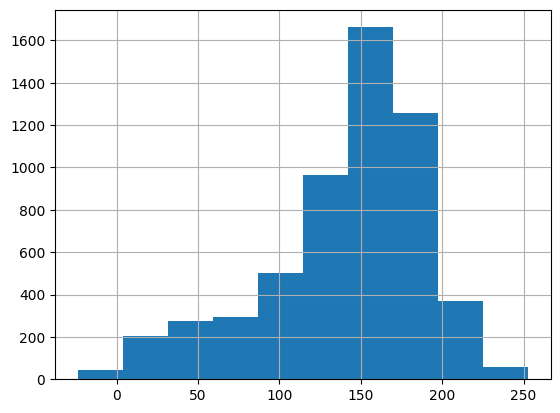

In [2471]:
df_WOE['score'].hist()

In [2472]:
for v in X_WOE.columns.tolist():    
    display(df_WOE[['P_'+v[2:],v[2:]]].groupby(v[2:]).max().reset_index())

,AGE,P_AGE
0,21,-7
1,22,-6
2,23,-2
3,24,-2
4,25,5
5,26,3
6,27,2
7,28,2
8,29,4
9,30,9


,PAY_0,P_PAY_0
0,-2,20
1,-1,11
2,0,17
3,1,-13
4,2,-43
5,3,-53
6,4,-39
7,5,-42
8,6,2
9,7,-42


,PAY_2,P_PAY_2
0,-2,3
1,-1,4
2,0,4
3,1,4
4,2,-3
5,3,-4
6,4,-6
7,5,-2
8,6,-5
9,7,0


,PAY_3,P_PAY_3
0,-2,1
1,-1,0
2,0,1
3,1,2
4,2,9
5,3,12
6,4,10
7,5,13
8,6,5
9,7,2


,PAY_4,P_PAY_4
0,-2,3
1,-1,4
2,0,3
3,2,-1
4,3,-2
5,4,-5
6,5,0
7,6,-1
8,7,-8


,PAY_5,P_PAY_5
0,-2,2
1,-1,2
2,0,2
3,2,2
4,3,2
5,4,2
6,5,2
7,7,2


,PAY_6,P_PAY_6
0,-2,3
1,-1,4
2,0,3
3,2,-3
4,3,-8
5,4,-4
6,5,2
7,6,-12
8,7,-12
9,8,2


,Max_Estatus_Pay,P_Max_Estatus_Pay
0,-2,2
1,-1,2
2,0,2
3,1,2
4,2,2
5,3,2
6,4,2
7,5,2
8,6,2
9,7,2


,Count_Pay_Retrasados,P_Count_Pay_Retrasados
0,0,10
1,1,0
2,2,-6
3,3,-11
4,4,-13
5,5,-15
6,6,-19


,Count_Pay_A_Tiempo,P_Count_Pay_A_Tiempo
0,0,3
1,1,1
2,2,0
3,3,2
4,4,1
5,5,0
6,6,0


,Meses_Pago_Completo,P_Meses_Pago_Completo
0,0,4
1,1,0
2,2,0
3,3,0
4,4,0
5,5,0
6,6,6


,Meses_Deuda,P_Meses_Deuda
0,0,-4
1,1,14
2,2,9
3,3,9
4,4,6
5,5,5
6,6,0


,SEX_1,P_SEX_1
0,False,5
1,True,0


,SEX_2,P_SEX_2
0,False,0
1,True,5


,LIMIT_BAL,P_LIMIT_BAL
0,"(-0.2, 0.803]",2
1,"(-1.2109999999999999, -0.2]",3
2,"(0.803, 1.807]",1
3,"(1.807, 2.81]",2
4,"(2.81, 3.814]",0
5,"(3.814, 4.817]",2


,PAY_AMT1,P_PAY_AMT1
0,"(-0.00628, 0.338]",4
1,"(-0.35, -0.00628]",3
2,"(-0.694, -0.35]",4
3,"(-1.0419999999999998, -0.694]",-7
4,"(0.338, 0.681]",8
5,"(0.681, 1.025]",7
6,"(1.025, 1.369]",8
7,"(1.369, 1.713]",21
8,"(1.713, 2.057]",17


,PAY_AMT2,P_PAY_AMT2
0,"(-0.31, 0.0314]",3
1,"(-0.652, -0.31]",3
2,"(-0.998, -0.652]",-3
3,"(0.0314, 0.373]",5
4,"(0.373, 0.715]",7
5,"(0.715, 1.057]",8
6,"(1.057, 1.399]",10
7,"(1.399, 1.741]",2
8,"(1.741, 2.082]",13


,PAY_AMT3,P_PAY_AMT3
0,"(-0.236, 0.113]",2
1,"(-0.584, -0.236]",2
2,"(-0.937, -0.584]",3
3,"(0.113, 0.462]",2
4,"(0.462, 0.811]",2
5,"(0.811, 1.159]",2
6,"(1.159, 1.508]",1
7,"(1.508, 1.857]",2
8,"(1.857, 2.206]",1


,PAY_AMT4,P_PAY_AMT4
0,"(-0.203, 0.144]",9
1,"(-0.549, -0.203]",1
2,"(-0.9, -0.549]",-4
3,"(0.144, 0.491]",6
4,"(0.491, 0.837]",21
5,"(0.837, 1.184]",3
6,"(1.184, 1.53]",21
7,"(1.53, 1.877]",5
8,"(1.877, 2.224]",16


,PAY_AMT5,P_PAY_AMT5
0,"(-0.177, 0.172]",4
1,"(-0.527, -0.177]",1
2,"(-0.881, -0.527]",0
3,"(0.172, 0.522]",5
4,"(0.522, 0.872]",12
5,"(0.872, 1.222]",6
6,"(1.222, 1.572]",14
7,"(1.572, 1.922]",-1
8,"(1.922, 2.271]",12


,PAY_AMT6,P_PAY_AMT6
0,"(-0.188, 0.159]",1
1,"(-0.536, -0.188]",2
2,"(-0.887, -0.536]",5
3,"(0.159, 0.506]",0
4,"(0.506, 0.853]",0
5,"(0.853, 1.2]",-1
6,"(1.2, 1.547]",-4
7,"(1.547, 1.894]",-1
8,"(1.894, 2.241]",-4


,Ratio_Debt,P_Ratio_Debt
0,"(-0.82, 0.112]",10
1,"(-1.7619999999999998, -0.82]",6
2,"(0.112, 1.045]",0
3,"(1.045, 1.978]",-6
4,"(1.978, 2.91]",-14
5,"(2.91, 3.843]",0
6,"(4.775, 5.708]",2
7,"(5.708, 6.64]",-19


,Promedio_Estatus_Pay,P_Promedio_Estatus_Pay
0,"(-0.111, 0.303]",10
1,"(-0.525, -0.111]",6
2,"(-0.939, -0.525]",6
3,"(-1.352, -0.939]",8
4,"(-1.766, -1.352]",1
5,"(-2.185, -1.766]",10
6,"(0.303, 0.717]",0
7,"(0.717, 1.13]",-7
8,"(1.13, 1.544]",-14


,Pago_desviacion,P_Pago_desviacion
0,"(-0.0714, 0.284]",3
1,"(-0.427, -0.0714]",2
2,"(-0.786, -0.427]",0
3,"(0.284, 0.639]",9
4,"(0.639, 0.994]",8
5,"(0.994, 1.349]",5
6,"(1.349, 1.704]",4
7,"(1.704, 2.06]",11
8,"(2.06, 2.415]",15


,Ratio_Payment,P_Ratio_Payment
0,"(-0.124, 0.245]",4
1,"(-0.492, -0.124]",3
2,"(-0.86, -0.492]",0
3,"(-1.2329999999999999, -0.86]",3
4,"(0.245, 0.613]",6
5,"(0.613, 0.981]",3
6,"(0.981, 1.349]",0
7,"(1.349, 1.718]",-1
8,"(1.718, 2.086]",0


,Total_Pay,P_Total_Pay
0,"(-0.33, 0.0277]",1
1,"(-0.689, -0.33]",3
2,"(-1.051, -0.689]",7
3,"(0.0277, 0.386]",0
4,"(0.386, 0.744]",0
5,"(0.744, 1.102]",0
6,"(1.102, 1.46]",-3
7,"(1.46, 1.818]",-5
8,"(1.818, 2.177]",-4


,Pay/Bill,P_Pay/Bill
0,"(-0.0473, 0.348]",6
1,"(-0.442, -0.0473]",5
2,"(-0.841, -0.442]",0
3,"(0.348, 0.743]",5
4,"(0.743, 1.138]",6
5,"(1.138, 1.534]",5
6,"(1.534, 1.929]",7


,Pay_amount_mean,P_Pay_amount_mean
0,"(-0.33, 0.0277]",1
1,"(-0.689, -0.33]",3
2,"(-1.051, -0.689]",7
3,"(0.0277, 0.386]",0
4,"(0.386, 0.744]",0
5,"(0.744, 1.102]",0
6,"(1.102, 1.46]",-3
7,"(1.46, 1.818]",-5
8,"(1.818, 2.177]",-4


,Pay_tendencia,P_Pay_tendencia
0,"(-0.0438, 0.56]",2
1,"(-0.648, -0.0438]",4
2,"(-1.252, -0.648]",2
3,"(-1.856, -1.252]",2
4,"(-2.465, -1.856]",0
5,"(0.56, 1.164]",1
6,"(1.164, 1.768]",0
7,"(1.768, 2.372]",-1


,Bill_tendencia,P_Bill_tendencia
0,"(-0.413, 0.0442]",4
1,"(-0.87, -0.413]",0
2,"(-1.333, -0.87]",5
3,"(0.0442, 0.501]",4
4,"(0.501, 0.959]",3
5,"(0.959, 1.416]",5
6,"(1.416, 1.873]",3
7,"(1.873, 2.331]",3
8,"(2.331, 2.788]",4


,Diff_Bill_Pay,P_Diff_Bill_Pay
0,"(-0.877, 0.113]",1
1,"(-1.867, -0.877]",17
2,"(-2.863, -1.867]",-9
3,"(0.113, 1.102]",2
4,"(1.102, 2.092]",3


,Pay_tendencia_Amplia,P_Pay_tendencia_Amplia
0,"(-0.217, 0.353]",3
1,"(-0.787, -0.217]",3
2,"(-1.356, -0.787]",2
3,"(-1.926, -1.356]",1
4,"(-2.502, -1.926]",1
5,"(0.353, 0.923]",1
6,"(0.923, 1.493]",1
7,"(1.493, 2.063]",0
8,"(2.063, 2.633]",0


,Bill_tendencia_Amplia,P_Bill_tendencia_Amplia
0,"(-0.382, 0.069]",2
1,"(-0.833, -0.382]",2
2,"(-1.289, -0.833]",2
3,"(0.069, 0.52]",2
4,"(0.52, 0.971]",2
5,"(0.971, 1.422]",2
6,"(1.422, 1.873]",2
7,"(1.873, 2.324]",2
8,"(2.324, 2.775]",2


,Diff_Bill_Pay_Tendencia,P_Diff_Bill_Pay_Tendencia
0,"(-0.0528, 0.417]",7
1,"(-0.522, -0.0528]",1
2,"(-0.992, -0.522]",-2
3,"(-1.466, -0.992]",9
4,"(0.417, 0.886]",3
5,"(0.886, 1.356]",7
6,"(1.356, 1.825]",1
7,"(1.825, 2.294]",6
8,"(2.294, 2.764]",7


,Diff_Bill_Pay_Tendencia_Amplia,P_Diff_Bill_Pay_Tendencia_Amplia
0,"(-0.312, 0.198]",5
1,"(-0.822, -0.312]",0
2,"(-1.3379999999999999, -0.822]",6
3,"(0.198, 0.709]",6
4,"(0.709, 1.219]",4
5,"(1.219, 1.73]",3
6,"(1.73, 2.24]",3
7,"(2.24, 2.75]",5


,Pay_tendencia_ponderada,P_Pay_tendencia_ponderada
0,"(-0.00517, 0.354]",0
1,"(-0.365, -0.00517]",1
2,"(-0.724, -0.365]",4
3,"(-1.0879999999999999, -0.724]",8
4,"(0.354, 0.714]",-2
5,"(0.714, 1.073]",0
6,"(1.073, 1.433]",-3
7,"(1.433, 1.792]",0
8,"(1.792, 2.152]",-7


,Bill_tendencia_ponderada,P_Bill_tendencia_ponderada
0,"(-0.0597, 0.372]",2
1,"(-0.492, -0.0597]",2
2,"(-0.923, -0.492]",4
3,"(-1.3599999999999999, -0.923]",-2
4,"(0.372, 0.804]",1
5,"(0.804, 1.236]",4
6,"(1.236, 1.668]",1
7,"(1.668, 2.1]",5


,LIMIT_BAL_log,P_LIMIT_BAL_log
0,"(-0.281, 0.218]",1
1,"(-0.781, -0.281]",1
2,"(-1.28, -0.781]",0
3,"(-1.78, -1.28]",-3
4,"(-2.2849999999999997, -1.78]",-2
5,"(0.218, 0.717]",6
6,"(0.717, 1.217]",7
7,"(1.217, 1.716]",7
8,"(1.716, 2.216]",21


,BILL_AMT4_log,P_BILL_AMT4_log
0,"(-0.0592, 0.365]",2
1,"(-0.484, -0.0592]",2
2,"(-0.913, -0.484]",2
3,"(0.365, 0.79]",2
4,"(0.79, 1.214]",3
5,"(1.214, 1.639]",2
6,"(1.639, 2.064]",3
7,"(2.064, 2.488]",3


,PAY_AMT1_log,P_PAY_AMT1_log
0,"(-0.5, 0.00509]",2
1,"(-1.006, -0.5]",13
2,"(-1.511, -1.006]",16
3,"(-2.022, -1.511]",13
4,"(0.00509, 0.511]",2
5,"(0.511, 1.016]",-2
6,"(1.016, 1.522]",-14
7,"(1.522, 2.027]",-16


,PAY_AMT2_log,P_PAY_AMT2_log
0,"(-0.235, 0.201]",2
1,"(-0.671, -0.235]",4
2,"(-1.107, -0.671]",4
3,"(-1.543, -1.107]",7
4,"(-1.9829999999999999, -1.543]",5
5,"(0.201, 0.637]",2
6,"(0.637, 1.073]",0


,PAY_AMT3_log,P_PAY_AMT3_log
0,"(-0.411, 0.0986]",2
1,"(-0.92, -0.411]",5
2,"(-1.429, -0.92]",7
3,"(-1.9429999999999998, -1.429]",-5
4,"(0.0986, 0.608]",2
5,"(0.608, 1.117]",10


,PAY_AMT4_log,P_PAY_AMT4_log
0,"(-0.11, 0.306]",3
1,"(-0.526, -0.11]",4
2,"(-0.941, -0.526]",10
3,"(-1.357, -0.941]",1
4,"(-1.777, -1.357]",11
5,"(0.306, 0.722]",0
6,"(0.722, 1.137]",-6


,PAY_AMT5_log,P_PAY_AMT5_log
0,"(-0.298, 0.184]",2
1,"(-0.78, -0.298]",-1
2,"(-1.262, -0.78]",2
3,"(-1.7469999999999999, -1.262]",-1
4,"(0.184, 0.666]",2
5,"(0.666, 1.148]",7


,PAY_AMT6_log,P_PAY_AMT6_log
0,"(-0.404, 0.016]",0
1,"(-0.825, -0.404]",5
2,"(-1.245, -0.825]",-4
3,"(-1.67, -1.245]",-4
4,"(0.016, 0.436]",2
5,"(0.436, 0.857]",6
6,"(0.857, 1.277]",11
7,"(1.277, 1.697]",14
8,"(1.697, 2.117]",40


,Ratio_Debt_log,P_Ratio_Debt_log
0,"(-0.324, 0.458]",4
1,"(-1.107, -0.324]",8
2,"(-1.889, -1.107]",3
3,"(-2.679, -1.889]",2
4,"(0.458, 1.241]",0
5,"(1.241, 2.024]",-2
6,"(2.024, 2.806]",-3
7,"(2.806, 3.589]",-2


,Ratio_Payment_log,P_Ratio_Payment_log
0,"(-0.337, 0.136]",-4
1,"(-0.811, -0.337]",10
2,"(-1.289, -0.811]",0
3,"(0.136, 0.61]",-4
4,"(0.61, 1.084]",0
5,"(1.084, 1.557]",21
6,"(1.557, 2.031]",13


,Total_Pay_log,P_Total_Pay_log
0,"(-0.169, 0.389]",4
1,"(-0.728, -0.169]",-5
2,"(-1.286, -0.728]",-8
3,"(-1.844, -1.286]",-10
4,"(-2.402, -1.844]",-10
5,"(-2.9659999999999997, -2.402]",-12
6,"(0.389, 0.947]",9
7,"(0.947, 1.505]",23


,Pay_amount_mean_log,P_Pay_amount_mean_log
0,"(-0.0465, 0.65]",0
1,"(-0.743, -0.0465]",9
2,"(-1.439, -0.743]",12
3,"(-2.135, -1.439]",16
4,"(-2.831, -2.135]",2
5,"(-3.534, -2.831]",16
6,"(0.65, 1.346]",-11
7,"(1.346, 2.042]",-22
8,"(2.042, 2.738]",2


,Diff_Bill_Pay_log,P_Diff_Bill_Pay_log
0,"(-0.139, 0.273]",8
1,"(-0.55, -0.139]",6
2,"(-0.966, -0.55]",0
3,"(0.273, 0.684]",3
4,"(0.684, 1.095]",2
5,"(1.095, 1.507]",4
6,"(1.507, 1.918]",0
7,"(1.918, 2.33]",0


,Pay_tendencia_ponderada_log,P_Pay_tendencia_ponderada_log
0,"(-0.146, 0.366]",2
1,"(-0.658, -0.146]",1
2,"(-1.17, -0.658]",0
3,"(-1.682, -1.17]",0
4,"(-2.194, -1.682]",-2
5,"(-2.706, -2.194]",0
6,"(-3.2239999999999998, -2.706]",0
7,"(0.366, 0.878]",4
8,"(0.878, 1.39]",6


,Pago_desviacion_log,P_Pago_desviacion_log
0,"(-0.239, 0.342]",5
1,"(-0.82, -0.239]",3
2,"(-1.401, -0.82]",0
3,"(-1.982, -1.401]",12
4,"(-2.563, -1.982]",19
5,"(-3.15, -2.563]",9
6,"(0.342, 0.923]",0
7,"(0.923, 1.504]",-5


In [2473]:
df_WOE['r_score'] = pd.cut(df_WOE['score'], bins = 7, include_lowest=True).astype(str)

In [2474]:
aux     = df_WOE[['r_score','default.payment.next.month']].copy()
aux['n']= 1

In [2475]:
aux= aux.pivot_table(index='r_score',columns='default.payment.next.month',values='n',aggfunc='sum').reset_index().sort_values(by='r_score')

In [2476]:
aux

default.payment.next.month,r_score,0,1
0,"(-24.278000000000002, 15.571]",23,98
1,"(134.286, 173.857]",2011,324
2,"(15.571, 55.143]",115,234
3,"(173.857, 213.429]",1212,76
4,"(213.429, 253.0]",128,5
5,"(55.143, 94.714]",232,252
6,"(94.714, 134.286]",661,254


In [2477]:
aux.reset_index().sort_values(by='r_score',ascending=False).to_excel('Score_Card_Examen_PHRH_.xlsx')

In [2211]:
df_WOE[varw].to_csv('Variables_Con_Woe.csv')

In [2212]:
lst = lst_c + lst_d

In [2213]:
lst

['LIMIT_BAL',
 'PAY_AMT1',
 'PAY_AMT2',
 'PAY_AMT3',
 'PAY_AMT4',
 'PAY_AMT5',
 'PAY_AMT6',
 'Ratio_Debt',
 'Promedio_Estatus_Pay',
 'Pago_desviacion',
 'Ratio_Payment',
 'Total_Pay',
 'Pay/Bill',
 'Pay_amount_mean',
 'Pay_tendencia',
 'Bill_tendencia',
 'Diff_Bill_Pay',
 'Pay_tendencia_Amplia',
 'Bill_tendencia_Amplia',
 'Diff_Bill_Pay_Tendencia',
 'Diff_Bill_Pay_Tendencia_Amplia',
 'Pay_tendencia_ponderada',
 'Bill_tendencia_ponderada',
 'LIMIT_BAL_log',
 'BILL_AMT4_log',
 'PAY_AMT1_log',
 'PAY_AMT2_log',
 'PAY_AMT3_log',
 'PAY_AMT4_log',
 'PAY_AMT5_log',
 'PAY_AMT6_log',
 'Ratio_Debt_log',
 'Ratio_Payment_log',
 'Total_Pay_log',
 'Pay_amount_mean_log',
 'Diff_Bill_Pay_log',
 'Pay_tendencia_ponderada_log',
 'Pago_desviacion_log',
 'AGE',
 'PAY_0',
 'PAY_2',
 'PAY_3',
 'PAY_4',
 'PAY_5',
 'PAY_6',
 'Max_Estatus_Pay',
 'Count_Pay_Retrasados',
 'Count_Pay_A_Tiempo',
 'Meses_Pago_Completo',
 'Meses_Deuda',
 'SEX_1',
 'SEX_2']

In [2214]:
for var in lst:
    display(df_WOE[[var, "W_" + var]].groupby(var).max().reset_index())

,LIMIT_BAL,W_LIMIT_BAL
0,"(-0.2, 0.803]",0.380959
1,"(-1.2109999999999999, -0.2]",-0.371099
2,"(0.803, 1.807]",0.638657
3,"(1.807, 2.81]",0.503003
4,"(2.81, 3.814]",1.784545
5,"(3.814, 4.817]",0.000000


,PAY_AMT1,W_PAY_AMT1
0,"(-0.00628, 0.338]",0.084702
1,"(-0.35, -0.00628]",0.036862
2,"(-0.694, -0.35]",0.081252
3,"(-1.0419999999999998, -0.694]",-0.494270
4,"(0.338, 0.681]",0.286660
5,"(0.681, 1.025]",0.217289
6,"(1.025, 1.369]",0.257345
7,"(1.369, 1.713]",0.888457
8,"(1.713, 2.057]",0.706585


,PAY_AMT2,W_PAY_AMT2
0,"(-0.31, 0.0314]",0.038642
1,"(-0.652, -0.31]",0.035305
2,"(-0.998, -0.652]",-0.436633
3,"(0.0314, 0.373]",0.157089
4,"(0.373, 0.715]",0.329916
5,"(0.715, 1.057]",0.420230
6,"(1.057, 1.399]",0.540081
7,"(1.399, 1.741]",-0.033532
8,"(1.741, 2.082]",0.732963


,PAY_AMT3,W_PAY_AMT3
0,"(-0.236, 0.113]",-0.103141
1,"(-0.584, -0.236]",0.042472
2,"(-0.937, -0.584]",-0.319997
3,"(0.113, 0.462]",0.257893
4,"(0.462, 0.811]",0.467679
5,"(0.811, 1.159]",0.204278
6,"(1.159, 1.508]",0.694822
7,"(1.508, 1.857]",0.437753
8,"(1.857, 2.206]",0.696459


,PAY_AMT4,W_PAY_AMT4
0,"(-0.203, 0.144]",0.254335
1,"(-0.549, -0.203]",-0.032199
2,"(-0.9, -0.549]",-0.264549
3,"(0.144, 0.491]",0.130156
4,"(0.491, 0.837]",0.678940
5,"(0.837, 1.184]",0.034750
6,"(1.184, 1.53]",0.706135
7,"(1.53, 1.877]",0.112331
8,"(1.877, 2.224]",0.500151


,PAY_AMT5,W_PAY_AMT5
0,"(-0.177, 0.172]",0.126317
1,"(-0.527, -0.177]",-0.086016
2,"(-0.881, -0.527]",-0.234212
3,"(0.172, 0.522]",0.199007
4,"(0.522, 0.872]",0.604472
5,"(0.872, 1.222]",0.247678
6,"(1.222, 1.572]",0.764404
7,"(1.572, 1.922]",-0.248377
8,"(1.922, 2.271]",0.625969


,PAY_AMT6,W_PAY_AMT6
0,"(-0.188, 0.159]",0.080187
1,"(-0.536, -0.188]",0.023187
2,"(-0.887, -0.536]",-0.252120
3,"(0.159, 0.506]",0.301034
4,"(0.506, 0.853]",0.228596
5,"(0.853, 1.2]",0.330532
6,"(1.2, 1.547]",0.600775
7,"(1.547, 1.894]",0.322432
8,"(1.894, 2.241]",0.578302


,Ratio_Debt,W_Ratio_Debt
0,"(-0.82, 0.112]",0.416713
1,"(-1.7619999999999998, -0.82]",0.234005
2,"(0.112, 1.045]",-0.114534
3,"(1.045, 1.978]",-0.556163
4,"(1.978, 2.91]",-1.008663
5,"(2.91, 3.843]",-0.161365
6,"(4.775, 5.708]",0.000000
7,"(5.708, 6.64]",-1.259977


,Promedio_Estatus_Pay,W_Promedio_Estatus_Pay
0,"(-0.111, 0.303]",0.784067
1,"(-0.525, -0.111]",0.418023
2,"(-0.939, -0.525]",0.380713
3,"(-1.352, -0.939]",0.603449
4,"(-1.766, -1.352]",-0.177113
5,"(-2.185, -1.766]",0.739421
6,"(0.303, 0.717]",-0.310611
7,"(0.717, 1.13]",-1.066324
8,"(1.13, 1.544]",-1.758035


,Pago_desviacion,W_Pago_desviacion
0,"(-0.0714, 0.284]",0.052646
1,"(-0.427, -0.0714]",0.003715
2,"(-0.786, -0.427]",-0.194547
3,"(0.284, 0.639]",0.392946
4,"(0.639, 0.994]",0.356841
5,"(0.994, 1.349]",0.146936
6,"(1.349, 1.704]",0.126317
7,"(1.704, 2.06]",0.531782
8,"(2.06, 2.415]",0.819464


,Ratio_Payment,W_Ratio_Payment
0,"(-0.124, 0.245]",-0.146766
1,"(-0.492, -0.124]",-0.093829
2,"(-0.86, -0.492]",0.253775
3,"(-1.2329999999999999, -0.86]",-0.081589
4,"(0.245, 0.613]",-0.303888
5,"(0.613, 0.981]",-0.077546
6,"(0.981, 1.349]",0.280468
7,"(1.349, 1.718]",0.339410
8,"(1.718, 2.086]",0.335326


,Total_Pay,W_Total_Pay
0,"(-0.33, 0.0277]",0.133643
1,"(-0.689, -0.33]",-0.055034
2,"(-1.051, -0.689]",-0.483563
3,"(0.0277, 0.386]",0.367714
4,"(0.386, 0.744]",0.255529
5,"(0.744, 1.102]",0.354576
6,"(1.102, 1.46]",0.729608
7,"(1.46, 1.818]",0.945758
8,"(1.818, 2.177]",0.829827


,Pay/Bill,W_Pay/Bill
0,"(-0.0473, 0.348]",0.504909
1,"(-0.442, -0.0473]",0.379152
2,"(-0.841, -0.442]",-0.279568
3,"(0.348, 0.743]",0.334347
4,"(0.743, 1.138]",0.544052
5,"(1.138, 1.534]",0.390703
6,"(1.534, 1.929]",0.589159


,Pay_amount_mean,W_Pay_amount_mean
0,"(-0.33, 0.0277]",0.133643
1,"(-0.689, -0.33]",-0.055034
2,"(-1.051, -0.689]",-0.483563
3,"(0.0277, 0.386]",0.367714
4,"(0.386, 0.744]",0.255529
5,"(0.744, 1.102]",0.354576
6,"(1.102, 1.46]",0.729608
7,"(1.46, 1.818]",0.945758
8,"(1.818, 2.177]",0.829827


,Pay_tendencia,W_Pay_tendencia
0,"(-0.0438, 0.56]",-0.001430
1,"(-0.648, -0.0438]",-0.227740
2,"(-1.252, -0.648]",0.024534
3,"(-1.856, -1.252]",0.099166
4,"(-2.465, -1.856]",0.406427
5,"(0.56, 1.164]",0.189118
6,"(1.164, 1.768]",0.416400
7,"(1.768, 2.372]",0.680085


,Bill_tendencia,W_Bill_tendencia
0,"(-0.413, 0.0442]",0.252767
1,"(-0.87, -0.413]",-0.371930
2,"(-1.333, -0.87]",0.457349
3,"(0.0442, 0.501]",0.254795
4,"(0.501, 0.959]",0.066645
5,"(0.959, 1.416]",0.606315
6,"(1.416, 1.873]",0.103327
7,"(1.873, 2.331]",0.226400
8,"(2.331, 2.788]",0.332653


,Diff_Bill_Pay,W_Diff_Bill_Pay
0,"(-0.877, 0.113]",-0.064535
1,"(-1.867, -0.877]",0.653337
2,"(-2.863, -1.867]",-0.566830
3,"(0.113, 1.102]",-0.027631
4,"(1.102, 2.092]",0.043605


,Pay_tendencia_Amplia,W_Pay_tendencia_Amplia
0,"(-0.217, 0.353]",-0.180548
1,"(-0.787, -0.217]",-0.214688
2,"(-1.356, -0.787]",0.168517
3,"(-1.926, -1.356]",0.585849
4,"(-2.502, -1.926]",0.478078
5,"(0.353, 0.923]",0.512551
6,"(0.923, 1.493]",0.531782
7,"(1.493, 2.063]",0.904986
8,"(2.063, 2.633]",0.800046


,Bill_tendencia_Amplia,W_Bill_tendencia_Amplia
0,"(-0.382, 0.069]",0.357082
1,"(-0.833, -0.382]",-0.362803
2,"(-1.289, -0.833]",0.312034
3,"(0.069, 0.52]",0.545575
4,"(0.52, 0.971]",0.130098
5,"(0.971, 1.422]",0.147823
6,"(1.422, 1.873]",0.102600
7,"(1.873, 2.324]",0.137128
8,"(2.324, 2.775]",0.346065


,Diff_Bill_Pay_Tendencia,W_Diff_Bill_Pay_Tendencia
0,"(-0.0528, 0.417]",0.414637
1,"(-0.522, -0.0528]",-0.099053
2,"(-0.992, -0.522]",-0.439385
3,"(-1.466, -0.992]",0.611825
4,"(0.417, 0.886]",0.027506
5,"(0.886, 1.356]",0.423568
6,"(1.356, 1.825]",-0.094990
7,"(1.825, 2.294]",0.326988
8,"(2.294, 2.764]",0.434983


,Diff_Bill_Pay_Tendencia_Amplia,W_Diff_Bill_Pay_Tendencia_Amplia
0,"(-0.312, 0.198]",0.368203
1,"(-0.822, -0.312]",-0.296667
2,"(-1.3379999999999999, -0.822]",0.376184
3,"(0.198, 0.709]",0.402104
4,"(0.709, 1.219]",0.158578
5,"(1.219, 1.73]",0.090810
6,"(1.73, 2.24]",0.036166
7,"(2.24, 2.75]",0.321378


,Pay_tendencia_ponderada,W_Pay_tendencia_ponderada
0,"(-0.00517, 0.354]",0.313833
1,"(-0.365, -0.00517]",0.123022
2,"(-0.724, -0.365]",-0.112066
3,"(-1.0879999999999999, -0.724]",-0.519873
4,"(0.354, 0.714]",0.482992
5,"(0.714, 1.073]",0.314718
6,"(1.073, 1.433]",0.552401
7,"(1.433, 1.792]",0.331111
8,"(1.792, 2.152]",0.969701


,Bill_tendencia_ponderada,W_Bill_tendencia_ponderada
0,"(-0.0597, 0.372]",0.000376
1,"(-0.492, -0.0597]",-0.028253
2,"(-0.923, -0.492]",0.120792
3,"(-1.3599999999999999, -0.923]",-0.339884
4,"(0.372, 0.804]",-0.059858
5,"(0.804, 1.236]",0.093982
6,"(1.236, 1.668]",-0.070393
7,"(1.668, 2.1]",0.145908


,LIMIT_BAL_log,W_LIMIT_BAL_log
0,"(-0.281, 0.218]",-0.145980
1,"(-0.781, -0.281]",-0.197359
2,"(-1.28, -0.781]",-0.331084
3,"(-1.78, -1.28]",-0.812963
4,"(-2.2849999999999997, -1.78]",-0.649945
5,"(0.218, 0.717]",0.396963
6,"(0.717, 1.217]",0.563751
7,"(1.217, 1.716]",0.555313
8,"(1.716, 2.216]",2.266383


,BILL_AMT4_log,W_BILL_AMT4_log
0,"(-0.0592, 0.365]",0.034076
1,"(-0.484, -0.0592]",-0.232570
2,"(-0.913, -0.484]",0.085661
3,"(0.365, 0.79]",-0.096827
4,"(0.79, 1.214]",0.122341
5,"(1.214, 1.639]",-0.172926
6,"(1.639, 2.064]",0.258806
7,"(2.064, 2.488]",0.138438


,PAY_AMT1_log,W_PAY_AMT1_log
0,"(-0.5, 0.00509]",0.043625
1,"(-1.006, -0.5]",-0.680159
2,"(-1.511, -1.006]",-0.892253
3,"(-2.022, -1.511]",-0.655123
4,"(0.00509, 0.511]",0.040529
5,"(0.511, 1.016]",0.357951
6,"(1.016, 1.522]",1.075397
7,"(1.522, 2.027]",1.196758


,PAY_AMT2_log,W_PAY_AMT2_log
0,"(-0.235, 0.201]",-0.035171
1,"(-0.671, -0.235]",-0.387037
2,"(-1.107, -0.671]",-0.304466
3,"(-1.543, -1.107]",-1.077656
4,"(-1.9829999999999999, -1.543]",-0.568260
5,"(0.201, 0.637]",0.056113
6,"(0.637, 1.073]",0.552199


,PAY_AMT3_log,W_PAY_AMT3_log
0,"(-0.411, 0.0986]",-0.030288
1,"(-0.92, -0.411]",0.206360
2,"(-1.429, -0.92]",0.349460
3,"(-1.9429999999999998, -1.429]",-0.555688
4,"(0.0986, 0.608]",-0.010479
5,"(0.608, 1.117]",0.524477


,PAY_AMT4_log,W_PAY_AMT4_log
0,"(-0.11, 0.306]",-0.051310
1,"(-0.526, -0.11]",-0.081322
2,"(-0.941, -0.526]",-0.394980
3,"(-1.357, -0.941]",0.083757
4,"(-1.777, -1.357]",-0.459253
5,"(0.306, 0.722]",0.109319
6,"(0.722, 1.137]",0.481682


,PAY_AMT5_log,W_PAY_AMT5_log
0,"(-0.298, 0.184]",-0.067717
1,"(-0.78, -0.298]",-0.430698
2,"(-1.262, -0.78]",-0.056005
3,"(-1.7469999999999999, -1.262]",-0.420876
4,"(0.184, 0.666]",0.020359
5,"(0.666, 1.148]",0.500578


,PAY_AMT6_log,W_PAY_AMT6_log
0,"(-0.404, 0.016]",-0.170799
1,"(-0.825, -0.404]",0.126317
2,"(-1.245, -0.825]",-0.384509
3,"(-1.67, -1.245]",-0.403878
4,"(0.016, 0.436]",0.004013
5,"(0.436, 0.857]",0.180748
6,"(0.857, 1.277]",0.477489
7,"(1.277, 1.697]",0.637143
8,"(1.697, 2.117]",2.035859


,Ratio_Debt_log,W_Ratio_Debt_log
0,"(-0.324, 0.458]",0.161791
1,"(-1.107, -0.324]",0.679927
2,"(-1.889, -1.107]",0.025628
3,"(-2.679, -1.889]",0.000000
4,"(0.458, 1.241]",-0.253396
5,"(1.241, 2.024]",-0.556359
6,"(2.024, 2.806]",-0.700362
7,"(2.806, 3.589]",-0.566830


,Ratio_Payment_log,W_Ratio_Payment_log
0,"(-0.337, 0.136]",-0.205515
1,"(-0.811, -0.337]",0.219099
2,"(-1.289, -0.811]",-0.054120
3,"(0.136, 0.61]",-0.216687
4,"(0.61, 1.084]",-0.074023
5,"(1.084, 1.557]",0.556173
6,"(1.557, 2.031]",0.326433


,Total_Pay_log,W_Total_Pay_log
0,"(-0.169, 0.389]",0.092524
1,"(-0.728, -0.169]",-0.346540
2,"(-1.286, -0.728]",-0.498362
3,"(-1.844, -1.286]",-0.581645
4,"(-2.402, -1.844]",-0.566830
5,"(-2.9659999999999997, -2.402]",-0.661664
6,"(0.389, 0.947]",0.287688
7,"(0.947, 1.505]",0.876779


,Pay_amount_mean_log,W_Pay_amount_mean_log
0,"(-0.0465, 0.65]",0.138254
1,"(-0.743, -0.0465]",-0.335823
2,"(-1.439, -0.743]",-0.462119
3,"(-2.135, -1.439]",-0.665270
4,"(-2.831, -2.135]",0.000000
5,"(-3.534, -2.831]",-0.640938
6,"(0.65, 1.346]",0.668212
7,"(1.346, 2.042]",1.198954
8,"(2.042, 2.738]",0.000000


,Diff_Bill_Pay_log,W_Diff_Bill_Pay_log
0,"(-0.139, 0.273]",-0.273757
1,"(-0.55, -0.139]",-0.167704
2,"(-0.966, -0.55]",0.147612
3,"(0.273, 0.684]",-0.040164
4,"(0.684, 1.095]",0.025512
5,"(1.095, 1.507]",-0.110310
6,"(1.507, 1.918]",0.107855
7,"(1.918, 2.33]",0.106899


,Pay_tendencia_ponderada_log,W_Pay_tendencia_ponderada_log
0,"(-0.146, 0.366]",0.044872
1,"(-0.658, -0.146]",-0.368783
2,"(-1.17, -0.658]",-0.542616
3,"(-1.682, -1.17]",-0.420227
4,"(-2.194, -1.682]",-1.023589
5,"(-2.706, -2.194]",-0.566830
6,"(-3.2239999999999998, -2.706]",-0.678622
7,"(0.366, 0.878]",0.378770
8,"(0.878, 1.39]",0.834141


,Pago_desviacion_log,W_Pago_desviacion_log
0,"(-0.239, 0.342]",-0.191701
1,"(-0.82, -0.239]",-0.037496
2,"(-1.401, -0.82]",0.158682
3,"(-1.982, -1.401]",-0.720981
4,"(-2.563, -1.982]",-1.259977
5,"(-3.15, -2.563]",-0.524068
6,"(0.342, 0.923]",0.179632
7,"(0.923, 1.504]",0.647833


,AGE,W_AGE
0,21,-0.412680
1,22,-0.369005
2,23,-0.206828
3,24,-0.231682
4,25,0.093165
5,26,0.030526
6,27,-0.002760
7,28,-0.014505
8,29,0.052209
9,30,0.280468


,PAY_0,W_PAY_0
0,-2,0.790541
1,-1,0.369148
2,0,0.658679
3,1,-0.699814
4,2,-1.999789
5,3,-2.438632
6,4,-1.847764
7,5,-1.953125
8,6,0.000000
9,7,-1.953125


,PAY_2,W_PAY_2
0,-2,0.247621
1,-1,0.478561
2,0,0.447570
3,1,0.349460
4,2,-1.539417
5,3,-1.620991
6,4,-2.086656
7,5,-1.259977
8,6,-1.953125
9,7,-0.854512


,PAY_3,W_PAY_3
0,-2,0.319082
1,-1,0.453495
2,0,0.307412
3,1,0.000000
4,2,-1.317736
5,3,-1.870887
6,4,-1.442299
7,5,-1.953125
8,6,-0.566830
9,7,0.000000


,PAY_4,W_PAY_4
0,-2,0.220680
1,-1,0.479726
2,0,0.254186
3,2,-1.492036
4,3,-1.578431
5,4,-2.512740
6,5,-0.854512
7,6,-1.259977
8,7,-3.457202


,PAY_5,W_PAY_5
0,-2,0.185470
1,-1,0.450656
2,0,0.215354
3,2,-1.469817
4,3,-2.430049
5,4,-1.770803
6,5,-1.665443
7,7,-3.657873


,PAY_6,W_PAY_6
0,-2,0.209522
1,-1,0.388916
2,0,0.208476
3,2,-1.372455
4,3,-2.281629
5,4,-1.483121
6,5,0.000000
7,6,-3.205888
8,7,-3.205888
9,8,0.000000


,Max_Estatus_Pay,W_Max_Estatus_Pay
0,-2,0.754926
1,-1,0.599605
2,0,0.838945
3,1,-0.190595
4,2,-1.001684
5,3,-1.803593
6,4,-2.022117
7,5,-1.953125
8,6,-1.547660
9,7,-3.051737


,Count_Pay_Retrasados,W_Count_Pay_Retrasados
0,0,0.791428
1,1,-0.275682
2,2,-0.854512
3,3,-1.425492
4,4,-1.562258
5,5,-1.762069
6,6,-2.157919


,Count_Pay_A_Tiempo,W_Count_Pay_A_Tiempo
0,0,-0.158514
1,1,0.223955
2,2,0.417465
3,3,0.172126
4,4,0.251480
5,5,0.496866
6,6,0.648082


,Meses_Pago_Completo,W_Meses_Pago_Completo
0,0,-0.221990
1,1,0.239171
2,2,0.458376
3,3,0.500151
4,4,0.418271
5,5,0.261722
6,6,-0.541512


,Meses_Deuda,W_Meses_Deuda
0,0,-0.720981
1,1,1.203876
2,2,0.675676
3,3,0.748005
4,4,0.365655
5,5,0.304319
6,6,-0.239257


,SEX_1,W_SEX_1
0,False,0.119409
1,True,-0.172274


,SEX_2,W_SEX_2
0,False,-0.172274
1,True,0.119409


In [2215]:
Diccionario_w = {}

for v in lst:
    Diccionario_w[v] = dict(zip(df_WOE[v], df_WOE["W_" + v]))

with open ('bins.json', 'w') as archivo:
    json.dump(Diccionario_w, archivo)

In [2216]:
Diccionario_w

{'LIMIT_BAL': {'(-1.2109999999999999, -0.2]': -0.37109920468131374,
  '(-0.2, 0.803]': 0.38095915084877063,
  '(0.803, 1.807]': 0.6386565610723958,
  '(1.807, 2.81]': 0.5030030760333108,
  '(2.81, 3.814]': 1.7845450090787223,
  '(3.814, 4.817]': 0.0},
 'PAY_AMT1': {'(0.338, 0.681]': 0.2866595825503693,
  '(-1.0419999999999998, -0.694]': -0.4942698645814114,
  '(-0.694, -0.35]': 0.08125183600661026,
  '(-0.35, -0.00628]': 0.03686206007308411,
  '(1.713, 2.057]': 0.7065847649632815,
  '(-0.00628, 0.338]': 0.08470205123955563,
  '(0.681, 1.025]': 0.2172887106809167,
  '(1.025, 1.369]': 0.257345194881594,
  '(1.369, 1.713]': 0.8884569845220867},
 'PAY_AMT2': {'(0.373, 0.715]': 0.32991588771642943,
  '(-0.652, -0.31]': 0.035304934670447284,
  '(-0.31, 0.0314]': 0.038641765218903626,
  '(-0.998, -0.652]': -0.43663280927999015,
  '(1.741, 2.082]': 0.7329633308995906,
  '(1.057, 1.399]': 0.5400808433980494,
  '(0.0314, 0.373]': 0.15708859114194348,
  '(0.715, 1.057]': 0.4202295546776069,
  '(1

### Validacion

In [2217]:
val = pd.read_csv('datos/val_default.csv', sep = '|' )

In [2218]:
val

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,942,50000.0,2,2,2,43,0,0,0,0,0,0,48474.0,48388.0,38972.0,47584.0,28055.0,28571.0,2334.0,1918.0,12530.0,1001.0,1035.0,1198.0
1,7231,320000.0,2,1,1,42,1,2,2,0,0,0,318844.0,324589.0,320622.0,252323.0,253557.0,256525.0,10000.0,450.0,7025.0,7161.0,8000.0,6883.0
2,22096,230000.0,1,2,1,45,0,0,0,0,-1,-1,42770.0,22080.0,16740.0,14029.0,1439.0,2269.0,2000.0,1347.0,3078.0,1509.0,9000.0,8000.0
3,21996,200000.0,2,2,1,44,-2,-2,-2,-2,-2,-2,7096.0,1323.0,8457.0,48757.0,4200.0,7312.0,1336.0,8457.0,48757.0,4200.0,7312.0,21740.0
4,15155,210000.0,2,1,1,46,-2,-2,-2,-2,-2,-2,0.0,477.0,971.0,0.0,386.0,0.0,477.0,972.0,0.0,386.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1870,21254,90000.0,2,5,2,31,1,-2,-2,-2,-2,-2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1871,15109,210000.0,2,2,1,36,0,0,0,0,0,0,13460.0,14765.0,14939.0,15748.0,16069.0,13780.0,1534.0,1307.0,1116.0,437.0,399.0,276.0
1872,12508,450000.0,1,1,2,34,-1,-1,-1,-1,-1,-1,583.0,-16.0,2312.0,192.0,1630.0,14099.0,0.0,2328.0,192.0,1638.0,14169.0,1122.0
1873,23226,60000.0,2,3,2,23,0,0,0,0,0,0,30660.0,30286.0,29757.0,30122.0,30498.0,28647.0,1800.0,1630.0,3000.0,2000.0,2000.0,2000.0


In [2219]:
val['Ratio_Debt'] = val[['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']].sum(axis = 1)/val['LIMIT_BAL'] 

In [2220]:
val['Max_Estatus_Pay'] = val[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']].max(axis = 1)

In [2221]:
val['Promedio_Estatus_Pay'] = val[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']].mean(axis = 1) 

In [2222]:
val['Pago_desviacion'] = val[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].std(axis = 1)

In [2223]:
val['Ratio_Payment'] = val[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].sum(axis = 1) / df['LIMIT_BAL']

In [2224]:
val['Count_Pay_Retrasados'] = (val[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']] > 0 ).sum(axis = 1)

In [2225]:
val['Count_Pay_A_Tiempo'] = (val[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']] == -1).sum(axis = 1) # Conteo de meses pagados a tiempo

In [2226]:
val['Total_Pay'] = val[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].sum(axis = 1)

In [2227]:
val['Total_Bill'] = val[['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']].sum(axis = 1)

In [2228]:
val['Pay/Bill'] =np.where(val['Total_Bill'] == 0, 0, val['Total_Pay'] / val['Total_Bill'])

In [2229]:
val['Pay_amount_mean'] = val[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].mean(axis = 1)

In [2230]:
val['Pay_tendencia'] = val['PAY_AMT1'] - val ['PAY_AMT6']

In [2231]:
val['Bill_tendencia'] = val['BILL_AMT1'] - df['BILL_AMT6'] 

In [2232]:
val['Bill_amount_mean'] = val[['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']].mean(axis = 1)

In [2233]:
val['Diff_Bill_Pay'] = val['Total_Bill'] - val['Total_Pay']

In [2234]:
val['Pay_tendencia_Amplia'] = val[['PAY_AMT1','PAY_AMT2','PAY_AMT3']].mean(axis = 1) - val[['PAY_AMT4','PAY_AMT5','PAY_AMT6']].mean(axis =1)

In [2235]:
val['Bill_tendencia_Amplia'] = val[['BILL_AMT1','BILL_AMT2','BILL_AMT3']].mean(axis = 1) - val[['BILL_AMT4','BILL_AMT5','BILL_AMT6']].mean(axis =1)

In [2236]:
val['Diff_Bill_Pay_Tendencia'] = ((val['BILL_AMT1'] - val['PAY_AMT1']) - (val['BILL_AMT6'] - val['PAY_AMT6']))

In [2237]:
val['Diff_Bill_Pay_Tendencia_Amplia'] = (
    (val[['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3']].mean(axis=1)  - val[['PAY_AMT1','PAY_AMT2', 'PAY_AMT3']].mean(axis=1))
    - 
    ( val[['BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6']].mean(axis=1) - val[['PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']].mean(axis=1))
)

In [2238]:
val['Meses_Pago_Completo'] = ( (val['PAY_AMT1'] >= val['BILL_AMT1']) + (
                            val['PAY_AMT2'] >= val['BILL_AMT2']).astype(int) + (
                            val['PAY_AMT3'] >= val['BILL_AMT3']).astype(int) + (
                            val['PAY_AMT4'] >= val['BILL_AMT4']).astype(int) + (
                            val['PAY_AMT5'] >= val['BILL_AMT5']).astype(int) +(
                            val['PAY_AMT6'] >= val['BILL_AMT6']).astype(int))

In [2239]:
val['Meses_Deuda'] = ( (val['PAY_AMT1'] <= val['BILL_AMT1']).astype(int) +(
                        val['PAY_AMT2'] <= val['BILL_AMT2']).astype(int) + (
                        val['PAY_AMT3'] <= val['BILL_AMT3']).astype(int) + (
                        val['PAY_AMT4'] <= val['BILL_AMT4']).astype(int) + (
                        val['PAY_AMT5'] <= val['BILL_AMT5']).astype(int) +(
                        val['PAY_AMT6'] <= val['BILL_AMT6']).astype(int))

In [2240]:
val['Age_Quartile'] = pd.qcut(val['AGE'], q =4, labels = ['Joven', 'Adulto joven', 'Adulto', 'Mayor'])

In [2241]:
val['Pay_tendencia_ponderada'] = (val['PAY_AMT1'] *1) +(
                                val['PAY_AMT2'] * 0.75) + (
                                val['PAY_AMT3'] * 0.6) + (
                                val['PAY_AMT4'] * 0.45) + (
                                val['PAY_AMT5'] * 0.3 ) + (
                                val['PAY_AMT6'] * 0.15)

In [2242]:
val['Bill_tendencia_ponderada'] = (val['BILL_AMT1'] * 1) + (
                                val['BILL_AMT2'] * 0.75) + (
                                val['BILL_AMT3'] * 0.6) + (
                                val['BILL_AMT4'] * 0.45) + (
                                val['BILL_AMT5'] * 0.3) + (
                                val['BILL_AMT6'] * 0.15)

In [2243]:
val.shape

(1875, 48)

In [2244]:
lst_column_log_val = ['LIMIT_BAL','AGE','BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','PAY_AMT2',
                  'PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6','Ratio_Debt','Ratio_Payment','Total_Pay','Total_Bill',
                  'Pay_amount_mean','Bill_amount_mean','Diff_Bill_Pay','Pay_tendencia_ponderada','Bill_tendencia_ponderada','Pago_desviacion']

In [2245]:
for col in lst_column_log_val:
    offset = abs(val[col].min()) + 1
    val[f'{col}_log'] = np.log1p(val[col] + offset)

In [2246]:
val.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1875 entries, 0 to 1874
Data columns (total 72 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   CUSTOMER_ID                     1875 non-null   int64   
 1   LIMIT_BAL                       1875 non-null   float64 
 2   SEX                             1875 non-null   int64   
 3   EDUCATION                       1875 non-null   int64   
 4   MARRIAGE                        1875 non-null   int64   
 5   AGE                             1875 non-null   int64   
 6   PAY_0                           1875 non-null   int64   
 7   PAY_2                           1875 non-null   int64   
 8   PAY_3                           1875 non-null   int64   
 9   PAY_4                           1875 non-null   int64   
 10  PAY_5                           1875 non-null   int64   
 11  PAY_6                           1875 non-null   int64   
 12  BILL_AMT1           

In [2247]:
val_id = val.copy()

In [2248]:
val

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
0,942,50000.0,2,2,2,43,0,0,0,0,0,0,48474.0,48388.0,38972.0,47584.0,28055.0,28571.0,2334.0,1918.0,12530.0,1001.0,1035.0,1198.0,4.800880,0,0.000000,4535.685924,0.222400,0,0,20016.0,240044.0,0.083385,3336.000000,1136.0,29646.0,40007.333333,220028.0,4516.000000,10541.333333,18767.0,6025.333333,0,6,Mayor,12231.15,142263.15,11.002133,4.189655,12.223171,11.660621,11.073133,11.453313,11.221021,11.227907,7.756195,7.560080,9.436041,6.910751,6.944087,7.090077,1.965718,0.798588,9.904387,12.491823,8.113127,10.700101,13.291250,9.411905,11.914437,8.420172
1,7231,320000.0,2,1,1,42,1,2,2,0,0,0,318844.0,324589.0,320622.0,252323.0,253557.0,256525.0,10000.0,450.0,7025.0,7161.0,8000.0,6883.0,5.395187,2,0.833333,3222.323432,0.439100,3,0,39519.0,1726460.0,0.022890,6586.500000,3117.0,285596.0,287743.333333,1686941.0,-1523.000000,67216.666667,59202.0,68739.666667,0,6,Mayor,21207.40,982750.15,12.706854,4.174387,13.068581,12.879316,12.754388,12.608038,12.612158,12.621996,9.210540,6.113682,8.857515,8.876684,8.987447,8.837100,2.045671,0.891629,10.584587,14.376593,8.793081,12.584839,14.537685,9.962200,13.805354,8.078478
2,22096,230000.0,1,2,1,45,0,0,0,0,-1,-1,42770.0,22080.0,16740.0,14029.0,1439.0,2269.0,2000.0,1347.0,3078.0,1509.0,9000.0,8000.0,0.431857,0,-0.333333,3433.603976,0.277044,0,2,24934.0,99327.0,0.251029,4155.666667,-6000.0,36924.0,16554.500000,74393.0,-4028.000000,21284.333333,46501.0,25312.333333,2,4,Mayor,9436.10,76459.10,12.388403,4.219508,12.194734,11.403200,10.649820,11.013007,10.780372,10.797492,7.601902,7.207119,8.032685,7.320527,9.105202,8.987447,1.019214,0.822878,10.124068,11.739543,8.332709,9.947863,13.008877,9.152510,11.333848,8.141948
3,21996,200000.0,2,2,1,44,-2,-2,-2,-2,-2,-2,7096.0,1323.0,8457.0,48757.0,4200.0,7312.0,1336.0,8457.0,48757.0,4200.0,7312.0,21740.0,0.385725,-2,-2.000000,17830.774169,0.834564,0,0,91802.0,77145.0,1.189993,15300.333333,-20404.0,-66858.0,12857.500000,-14657.0,8432.666667,-14464.333333,20188.0,-22897.000000,4,2,Mayor,44277.55,37459.90,12.254872,4.204693,11.995790,11.139700,10.431229,11.465687,10.836222,10.895646,7.198931,9.042986,10.794645,8.343316,8.897546,9.987001,1.002426,1.041888,11.427411,11.544938,9.635761,9.753275,12.786353,10.698278,10.705599,9.788793
4,15155,210000.0,2,1,1,46,-2,-2,-2,-2,-2,-2,0.0,477.0,971.0,0.0,386.0,0.0,477.0,972.0,0.0,386.0,0.0,0.0,0.008733,-2,-2.000000,389.898662,0.008738,0,0,1835.0,1834.0,1.000545,305.833333,477.0,-53819.0,305.666667,-1.0,354.333333,354.000000,-477.0,-0.333333,4,3,Mayor,1379.70,1056.15,12.301392,4.234107,11.951019,11.127337,10.181725,10.749978,10.758222,10.749978,6.171701,6.881411,0.693147,5.961005,0.693147,0.693147,0.853518,0.697507,7.515889,10.237886,5.729559,8.446485,12.826552,7.231070,9.012030,5.971003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [2249]:
lst_out_upper_val = ['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','Pago_desviacion',
           'PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6','Promedio_Estatus_Pay','Ratio_Payment','Total_Pay', 'Total_Bill',
                 'Pay/Bill','Pay_amount_mean','Bill_amount_mean','Diff_Bill_Pay','Ratio_Payment_log','Pay_tendencia_ponderada','Bill_tendencia_ponderada']
lst_out_both_val = ['Pay/Bill','Pay_tendencia','Bill_tendencia','Pay_tendencia_Amplia','Bill_tendencia_Amplia','Diff_Bill_Pay_Tendencia',
                'Diff_Bill_Pay_Tendencia_Amplia','BILL_AMT1_log','BILL_AMT2_log','BILL_AMT3_log','BILL_AMT4_log','BILL_AMT5_log','Pago_desviacion_log',
                'BILL_AMT6_log','PAY_AMT2_log','PAY_AMT3_log','PAY_AMT4_log','PAY_AMT5_log','Total_Pay_log','Diff_Bill_Pay_log','Pay_tendencia_ponderada_log']
lst_out_lower_val = ['Total_Bill_log','Bill_amount_mean_log','Bill_tendencia_ponderada_log']

In [2250]:
for v in lst_out_upper_val: 
    val[v] = winsorize(val[v], limits = [0, 0.1])

for v in lst_out_both_val:
    val[v] = winsorize(val[v], limits = [0.05, 0.05])

for v in lst_out_lower_val:
    val[v] = winsorize(val[v], limits = [0.1, 0])

In [2251]:
val.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1875 entries, 0 to 1874
Data columns (total 72 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   CUSTOMER_ID                     1875 non-null   int64   
 1   LIMIT_BAL                       1875 non-null   float64 
 2   SEX                             1875 non-null   int64   
 3   EDUCATION                       1875 non-null   int64   
 4   MARRIAGE                        1875 non-null   int64   
 5   AGE                             1875 non-null   int64   
 6   PAY_0                           1875 non-null   int64   
 7   PAY_2                           1875 non-null   int64   
 8   PAY_3                           1875 non-null   int64   
 9   PAY_4                           1875 non-null   int64   
 10  PAY_5                           1875 non-null   int64   
 11  PAY_6                           1875 non-null   int64   
 12  BILL_AMT1           

In [2252]:
val = pd.get_dummies(val, columns = ['EDUCATION'],prefix='EDUCATION') 
val = pd.get_dummies(val, columns = ['MARRIAGE'],prefix='MARRIAGE')
val = pd.get_dummies(val, columns = ['SEX'],prefix='SEX')
mapeo_Age = {'Joven':1, 'Adulto joven' :2, 'Adulto':3, 'Mayor':4}
val['Age_Quartile'] = val['Age_Quartile'].map(mapeo_Age)

val = val.reindex(columns = cod_columns, fill_value = False)

In [2253]:
numeric_columns_val = val.select_dtypes(include = ['float64']).columns

In [2254]:
numeric_columns_val

Index(['LIMIT_BAL', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'Ratio_Debt',
       'Promedio_Estatus_Pay', 'Pago_desviacion', 'Ratio_Payment', 'Total_Pay',
       'Total_Bill', 'Pay/Bill', 'Pay_amount_mean', 'Pay_tendencia',
       'Bill_tendencia', 'Bill_amount_mean', 'Diff_Bill_Pay',
       'Pay_tendencia_Amplia', 'Bill_tendencia_Amplia',
       'Diff_Bill_Pay_Tendencia', 'Diff_Bill_Pay_Tendencia_Amplia',
       'Pay_tendencia_ponderada', 'Bill_tendencia_ponderada', 'LIMIT_BAL_log',
       'AGE_log', 'BILL_AMT1_log', 'BILL_AMT2_log', 'BILL_AMT3_log',
       'BILL_AMT4_log', 'BILL_AMT5_log', 'BILL_AMT6_log', 'PAY_AMT1_log',
       'PAY_AMT2_log', 'PAY_AMT3_log', 'PAY_AMT4_log', 'PAY_AMT5_log',
       'PAY_AMT6_log', 'Ratio_Debt_log', 'Ratio_Payment_log', 'Total_Pay_log',
       'Total_Bill_log', 'Pay_amount_mean_log', 'Bill_amount_mean_log',
       'Diff_Bill_Pay_l

In [2255]:
categorical_columns_val = val.select_dtypes(exclude = ['float64']).columns

In [2256]:
categorical_columns_val

Index(['CUSTOMER_ID', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5',
       'PAY_6', 'Max_Estatus_Pay', 'Count_Pay_Retrasados',
       'Count_Pay_A_Tiempo', 'Meses_Pago_Completo', 'Meses_Deuda',
       'Age_Quartile', 'EDUCATION_0', 'EDUCATION_1', 'EDUCATION_2',
       'EDUCATION_3', 'EDUCATION_4', 'EDUCATION_5', 'EDUCATION_6',
       'MARRIAGE_0', 'MARRIAGE_1', 'MARRIAGE_2', 'MARRIAGE_3', 'SEX_1',
       'SEX_2'],
      dtype='object')

In [2257]:
val_scaled = sc.fit_transform(val[numeric_columns_val])
val_scaled = pd.DataFrame(val_scaled, columns = numeric_columns_val)

In [2258]:
val_scaled.describe()

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
count,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03,1.875000e+03
mean,-9.473903e-17,3.031649e-17,5.494864e-17,-1.193712e-16,-4.926430e-17,5.210647e-17,-3.126388e-17,-5.873820e-17,3.410605e-17,3.031649e-17,-1.705303e-17,-2.747432e-17,-5.684342e-17,7.673862e-17,2.842171e-17,-9.473903e-17,8.715991e-17,4.547474e-17,-1.136868e-17,4.263256e-17,-6.821210e-17,2.842171e-18,3.031649e-17,3.979039e-17,5.494864e-17,1.894781e-18,1.136868e-17,-4.121148e-17,5.873820e-17,2.273737e-17,1.458981e-16,1.729935e-15,-9.606538e-16,5.136750e-15,-4.052936e-15,5.115908e-17,2.165734e-15,2.669746e-15,-2.559849e-15,1.648459e-16,7.579123e-17,-5.305386e-17,2.889540e-16,2.444267e-16,9.094947e-17,-2.586376e-16,-2.501110e-16,5.684342e-16,-9.720225e-16,2.614797e-16,-8.905469e-17,-1.559404e-15,3.410605e-17,-3.656927e-16,-2.785328e-16
std,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00,1.000267e+00
min,-1.201902e+00,-3.932876e+00,-2.318606e+00,-1.446433e+00,-1.937968e+00,-1.934221e+00,-1.930092e+00,-9.973448e-01,-9.565368e-01,-9.174760e-01,-8.570970e-01,-9.040977e-01,-8.846467e-01,-1.241733e+00,-2.183693e+00,-7.897755e-01,-8.100888e-01,-1.024194e+00,-1.011499e+00,-8.281655e-01,-1.024194e+00,-2.488502e+00,-1.550285e+00,-1.011499e+00,-2.365808e+00,-2.787198e+00,-1.291147e+00,-1.339752e+00,-1.264719e+00,-1.062823e+00,-9.550271e-01,-2.215291e+00,-1.795893e+00,-9.021756e-01,-9.914590e-01,-1.110883e+00,-9.946444e-01,-9.671419e-01,-9.452958e-01,-2.031536e+00,-1.963487e+00,-1.796981e+00,-1.754176e+00,-1.749966e+00,-1.665343e+00,-1.591717e+00,-8.686947e-01,-3.460561e+00,-1.423336e+00,-3.458790e+00,-1.423266e+00,-9.440820e-01,-3.347717e+00,-1.534411e+00,-3.095450e+00
25%,-8.918243e-01,-7.892405e-01,-8.075101e-01,-8.199904e-01,-7.839680e-01,-7.721502e-01,-7.754915e-01,-7.206440e-01,-7.197299e-01,-8.183624e-01,-7.729785e-01,-7.986684e-01,-8.419884e-01,-9.918768e-01,-7.377758e-01,-6.5458

In [2259]:
val_categorical = val[categorical_columns_val]

In [2260]:
aux = val_categorical.drop(columns = ['CUSTOMER_ID']).copy()

In [2261]:
categorical_columns_val = aux.columns

In [2262]:
val_categorical

,CUSTOMER_ID,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,942,43,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,False,True
1,7231,42,1,2,2,0,0,0,2,3,0,0,6,4,False,True,False,False,False,False,False,False,True,False,False,False,True
2,22096,45,0,0,0,0,-1,-1,0,0,2,2,4,4,False,False,True,False,False,False,False,False,True,False,False,True,False
3,21996,44,-2,-2,-2,-2,-2,-2,-2,0,0,4,2,4,False,False,True,False,False,False,False,False,True,False,False,False,True
4,15155,46,-2,-2,-2,-2,-2,-2,-2,0,0,4,3,4,False,True,False,False,False,False,False,False,True,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1870,21254,31,1,-2,-2,-2,-2,-2,1,1,0,6,6,2,False,False,False,False,False,True,False,False,False,True,False,False,True
1871,15109,36,0,0,0,0,0,0,0,0,0,0,6,3,False,False,True,False,False,False,False,False,True,False,False,False,True
1872,12508,34,-1,-1,-1,-1,-1,-1,-1,0,6,3,3,2,False,True,False,False,False,False,False,False,False,True,False,True,False
1873,23226,23,0,0,0,0,0,0,0,0,0,0,6,1,False,False,False,True,False,False,False,False,False,True,False,False,True


In [2263]:
categorical_columns_val

Index(['AGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6',
       'Max_Estatus_Pay', 'Count_Pay_Retrasados', 'Count_Pay_A_Tiempo',
       'Meses_Pago_Completo', 'Meses_Deuda', 'Age_Quartile', 'EDUCATION_0',
       'EDUCATION_1', 'EDUCATION_2', 'EDUCATION_3', 'EDUCATION_4',
       'EDUCATION_5', 'EDUCATION_6', 'MARRIAGE_0', 'MARRIAGE_1', 'MARRIAGE_2',
       'MARRIAGE_3', 'SEX_1', 'SEX_2'],
      dtype='object')

In [2264]:
val_mf = pd.concat([val_scaled, val_categorical.reset_index(drop=True)], axis=1)

In [2265]:
val_mf

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,CUSTOMER_ID,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,-0.891824,0.092661,0.148310,-0.010612,0.265195,-0.156243,-0.126302,-0.351525,-0.409313,2.122817,-0.548097,-0.551531,-0.488487,1.169576,0.295022,0.256104,-0.166703,-0.155669,0.036136,-0.595147,-0.155669,0.067359,0.173496,0.036136,0.083697,0.917783,0.148571,0.257579,-0.097735,-0.061209,0.073521,-0.906538,0.903863,0.140615,0.287278,0.266605,0.449632,0.012668,0.048441,0.327355,0.317004,1.005124,0.246466,0.250314,0.299198,1.157398,-0.110444,0.314349,0.449571,0.292758,0.449545,0.214285,0.362215,0.519142,0.614233,942,43,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,False,True
1,1.201199,2.168598,2.161125,2.145360,2.198163,2.225845,2.220055,1.769664,-0.828148,1.218330,1.353445,1.821055,1.391455,1.448379,1.327820,-0.046743,0.460192,0.690595,2.162126,-0.764199,0.690595,0.522025,2.467208,2.162126,2.182401,-0.441122,2.902609,1.683144,2.849715,0.673860,2.177177,1.124383,0.802206,2.480513,2.305380,2.086133,2.272129,2.286797,2.279607,0.813071,-0.163342,0.819706,0.879045,0.904182,0.835721,1.330118,0.558642,0.674384,2.071423,0.636543,2.071504,2.336715,0.669710,1.934616,0.450189,7231,42,1,2,2,0,0,0,2,3,0,0,6,4,False,True,False,False,False,False,False,False,True,False,False,False,True
2,0.503525,-0.020202,-0.411585,-0.506167,-0.519502,-0.789899,-0.757213,-0.443943,-0.572225,0.018326,-0.391281,2.161699,1.760829,-0.880032,-0.118097,0.001976,-0.008621,0.057730,-0.517762,-0.126664,0.057730,-1.570448,0.275816,-0.517762,-0.518902,-1.004801,0.743337,1.235361,0.976392,-0.290097,-0.379490,0.744995,1.102636,0.031654,-0.321938,-0.361164,-0.454523,-0.903920,-0.846502,0.275824,0.199786,0.555347,0.378320,0.941863,0.881893,-0.887320,0.064236,0.430628,-0.197769,0.403779,-0.197813,-0.477152,0.217269,0.084533,0.480660,22096,45,0,0,0,0,-1,-1,0,0,2,2,4,4,False,False,True,False,False,False,False,False,True,False,False,True,False
3,0.270966,-0.726072,-0.853342,-0.690797,0.292626,-0.724167,-0.636246,-0.627672,1.456325,2.122817,0.439408,1.586692,2.190719,-0.901673,-2.183693,2.416774,1.604237,2.204525,-0.605076,1.966335,2.204525,-2.488502,-1.183237,-0.605076,-0.887368,1.799118,-1.235821,0.307677,-1.264719,2.140787,-0.647970,0.585914,1.003991,-0.730630,-0.945541,-0.685332,0.475041,-0.787746,-0.642414,0.141242,0.809473,1.091533,0.707423,0.875414,1.188863,-0.923587,1.639193,1.120496,-0.365227,1.062603,-0.365270,-0.944082,1.081017,-0.385752,1.271297,21996,44,-2,-2,-2,-2,-2,-2,-2,0,0,4,2,4,False,False,True,False,False,False,False,False,True,False,False,False,True
4,0.348486,-0.866478,-0.871346,-0.857661,-0.847576,-0.814968,-0.811640,-0.865358,-0.679216,-0.917476,-0.737942,-0.904098,-0.884647,-1.078529,-2.183693,-0.699869,-0.784810,-0.944570,-0.901520,1.966335,-0.944570,-0.083890,-0.999924,-0.901520,-0.826725,-0.018682,-0.415432,-0.420882,-0.433315,-0.949839,-0.898582,0.641335,1.199841,-0.902176,-0.974801,-1.055344,-0.994644,-0.949994,-0.9

In [2266]:
x_val_PCA = pca.transform(val_scaled)

In [2267]:
x_val_PCA

array([[ 1.28604882e+00, -5.35604041e-01, -1.30346801e+00, ...,
        -9.82990198e-03, -4.28907379e-02,  6.14102580e-02],
       [ 1.11526988e+01, -2.84297445e+00,  2.44056415e+00, ...,
         8.99830782e-02,  8.09685735e-02, -9.35740127e-02],
       [-7.42628031e-01,  1.76055641e+00,  1.90243168e+00, ...,
         4.64409717e-02, -7.06692682e-02,  1.22300101e-01],
       ...,
       [-3.83136451e+00,  3.16381921e+00,  1.43718878e+00, ...,
         6.47403878e-03,  4.26632566e-03, -6.32638471e-02],
       [-4.09419648e-01, -8.29493488e-01, -1.66133333e+00, ...,
        -7.97988534e-02, -5.46018026e-02,  4.62822347e-02],
       [ 2.23856038e+00, -2.30466642e+00, -1.84877792e+00, ...,
        -3.21672814e-02, -6.41627750e-02,  2.75253045e-02]])

In [2268]:
val_pca = pd.DataFrame(x_val_PCA, columns=[f'PCA_{i+1}' for i in range(X_PCA.shape[1])])

In [2269]:
val_Com = pd.concat([val_pca, val_categorical.reset_index(drop = True)], axis = 1)

In [2270]:
val_Com

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14,PCA_15,PCA_16,PCA_17,PCA_18,PCA_19,PCA_20,PCA_21,PCA_22,PCA_23,PCA_24,PCA_25,PCA_26,PCA_27,PCA_28,PCA_29,PCA_30,PCA_31,PCA_32,PCA_33,PCA_34,PCA_35,PCA_36,PCA_37,PCA_38,PCA_39,PCA_40,PCA_41,PCA_42,PCA_43,PCA_44,PCA_45,PCA_46,PCA_47,PCA_48,CUSTOMER_ID,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,1.286049,-0.535604,-1.303468,1.091822,0.875948,-0.760252,1.395618,0.475883,-1.543017,0.364549,0.414019,-1.058477,-0.041340,-0.022315,-0.137936,0.324795,0.131535,-0.788979,-0.421404,-0.886713,0.194641,-0.364416,0.011513,-0.382997,0.465334,0.982954,0.123820,-0.090569,0.275735,0.096489,0.288843,-0.088446,0.135894,-0.001139,0.155763,0.092834,0.123464,-0.179728,0.023020,-0.068063,0.170478,-0.023026,-0.034325,-0.006052,-0.039927,-0.009830,-0.042891,0.061410,942,43,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,False,True
1,11.152699,-2.842974,2.440564,0.776598,-0.889936,0.420559,-1.560973,-0.280982,-1.652856,0.494934,0.437589,-0.555285,0.015575,0.317265,0.536200,0.460907,-0.260095,0.487469,0.839882,0.636771,1.001579,-0.296414,0.439353,0.808095,0.654436,0.058331,-0.278949,-0.020039,0.427187,-0.027367,0.032487,0.496509,-0.429073,-0.041690,-0.094815,-0.595217,0.174614,0.278484,-0.053056,0.094094,-0.300363,-0.075589,-0.080625,0.038433,-0.004046,0.089983,0.080969,-0.093574,7231,42,1,2,2,0,0,0,2,3,0,0,6,4,False,True,False,False,False,False,False,False,True,False,False,False,True
2,-0.742628,1.760556,1.902432,1.186274,-2.837482,-1.287853,-0.162362,0.616929,-0.798991,0.309897,1.564894,0.091240,0.987372,-0.005519,0.052401,-0.042211,0.663604,0.151013,-0.709873,0.647615,0.278386,-0.705637,0.858910,0.286393,0.114339,-0.514191,0.223940,0.224178,0.203899,0.078865,0.123497,0.253408,0.167816,0.258465,-0.052804,0.248841,-0.081172,-0.142334,-0.110525,-0.434492,0.136820,0.110178,0.109538,0.118271,-0.024055,0.046441,-0.070669,0.122300,22096,45,0,0,0,0,-1,-1,0,0,2,2,4,4,False,False,True,False,False,False,False,False,True,False,False,True,False
3,0.247587,7.876231,0.027103,-0.231846,-1.174828,1.147435,3.076963,0.867334,-1.088422,-0.787592,0.938195,0.016534,-0.735164,0.671217,-0.168028,-0.164901,1.552739,-0.016231,-1.060983,-0.542471,0.211053,-0.567968,0.200865,-0.272874,0.009686,-0.443662,0.301129,-0.409975,-0.293681,0.036151,0.368749,0.061945,0.270744,0.518553,-0.207220,0.159727,-0.092228,-0.109865,0.013880,-0.494545,-0.078894,0.114522,0.086785,0.036995,0.147197,0.056220,0.042059,0.198872,21996,44,-2,-2,-2,-2,-2,-2,-2,0,0,4,2,4,False,False,True,False,False,False,False,False,True,False,False,False,True
4,-6.404266,0.055551,1.535717,-1.247200,0.619154,0.094541,-0.343846,1.446282,0.506676,-0.019020,-1.021242,0.202565,-2.030803,-0.538642,-0.437037,0.272914,0.478656,0.264466,-0.218165,0.254030,0.670378,-0.752342,-0.152768,0.059752,-0.159373,0.121663,-0.062517,0.219689,0.153123,0.045751,-0.077620,0.252375,-0.064941,0.401417,-0.291849,-0.215834,-0.087752,0.142421,-0.258199,-0.287147,-0.249076,-0.083456,-0.120455,-0.016115,0.001173,0.004447,0.049376,-0.097217,15155,46,-2,-2,-2,-2,-2,-2,-2,0,0,4,3,4,False,True,False,False,False,False,False,False,True,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1870,-8.160627,-3.841493,1.141291,-1.935373,-0.091727,3.154803,0.090462,-0.508732,-0.631369,-2.022954,0.225472,0.666271,0.261212,0.090339,-0.250658,-0.771035,-0.120547,0.144845,-0.144459,0.038282,-0.188309,-0.045707,-0.017540,-0.049323,-0.07948

In [2271]:
X_val_com = val_Com.drop(columns = ['CUSTOMER_ID'])

In [2272]:
val_mf[categorical_columns_val]

,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,43,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,False,True
1,42,1,2,2,0,0,0,2,3,0,0,6,4,False,True,False,False,False,False,False,False,True,False,False,False,True
2,45,0,0,0,0,-1,-1,0,0,2,2,4,4,False,False,True,False,False,False,False,False,True,False,False,True,False
3,44,-2,-2,-2,-2,-2,-2,-2,0,0,4,2,4,False,False,True,False,False,False,False,False,True,False,False,False,True
4,46,-2,-2,-2,-2,-2,-2,-2,0,0,4,3,4,False,True,False,False,False,False,False,False,True,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1870,31,1,-2,-2,-2,-2,-2,1,1,0,6,6,2,False,False,False,False,False,True,False,False,False,True,False,False,True
1871,36,0,0,0,0,0,0,0,0,0,0,6,3,False,False,True,False,False,False,False,False,True,False,False,False,True
1872,34,-1,-1,-1,-1,-1,-1,-1,0,6,3,3,2,False,True,False,False,False,False,False,False,False,True,False,True,False
1873,23,0,0,0,0,0,0,0,0,0,0,6,1,False,False,False,True,False,False,False,False,False,True,False,False,True


In [2273]:
val_mf[numeric_columns_val]

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
0,-0.891824,0.092661,0.148310,-0.010612,0.265195,-0.156243,-0.126302,-0.351525,-0.409313,2.122817,-0.548097,-0.551531,-0.488487,1.169576,0.295022,0.256104,-0.166703,-0.155669,0.036136,-0.595147,-0.155669,0.067359,0.173496,0.036136,0.083697,0.917783,0.148571,0.257579,-0.097735,-0.061209,0.073521,-0.906538,0.903863,0.140615,0.287278,0.266605,0.449632,0.012668,0.048441,0.327355,0.317004,1.005124,0.246466,0.250314,0.299198,1.157398,-0.110444,0.314349,0.449571,0.292758,0.449545,0.214285,0.362215,0.519142,0.614233
1,1.201199,2.168598,2.161125,2.145360,2.198163,2.225845,2.220055,1.769664,-0.828148,1.218330,1.353445,1.821055,1.391455,1.448379,1.327820,-0.046743,0.460192,0.690595,2.162126,-0.764199,0.690595,0.522025,2.467208,2.162126,2.182401,-0.441122,2.902609,1.683144,2.849715,0.673860,2.177177,1.124383,0.802206,2.480513,2.305380,2.086133,2.272129,2.286797,2.279607,0.813071,-0.163342,0.819706,0.879045,0.904182,0.835721,1.330118,0.558642,0.674384,2.071423,0.636543,2.071504,2.336715,0.669710,1.934616,0.450189
2,0.503525,-0.020202,-0.411585,-0.506167,-0.519502,-0.789899,-0.757213,-0.443943,-0.572225,0.018326,-0.391281,2.161699,1.760829,-0.880032,-0.118097,0.001976,-0.008621,0.057730,-0.517762,-0.126664,0.057730,-1.570448,0.275816,-0.517762,-0.518902,-1.004801,0.743337,1.235361,0.976392,-0.290097,-0.379490,0.744995,1.102636,0.031654,-0.321938,-0.361164,-0.454523,-0.903920,-0.846502,0.275824,0.199786,0.555347,0.378320,0.941863,0.881893,-0.887320,0.064236,0.430628,-0.197769,0.403779,-0.197813,-0.477152,0.217269,0.084533,0.480660
3,0.270966,-0.726072,-0.853342,-0.690797,0.292626,-0.724167,-0.636246,-0.627672,1.456325,2.122817,0.439408,1.586692,2.190719,-0.901673,-2.183693,2.416774,1.604237,2.204525,-0.605076,1.966335,2.204525,-2.488502,-1.183237,-0.605076,-0.887368,1.799118,-1.235821,0.307677,-1.264719,2.140787,-0.647970,0.585914,1.003991,-0.730630,-0.945541,-0.685332,0.475041,-0.787746,-0.642414,0.141242,0.809473,1.091533,0.707423,0.875414,1.188863,-0.923587,1.639193,1.120496,-0.365227,1.062603,-0.365270,-0.944082,1.081017,-0.385752,1.271297
4,0.348486,-0.866478,-0.871346,-0.857661,-0.847576,-0.814968,-0.811640,-0.865358,-0.679216,-0.917476,-0.737942,-0.904098,-0.884647,-1.078529,-2.183693,-0.699869,-0.784810,-0.944570,-0.901520,1.966335,-0.944570,-0.083890,-0.999924,-0.901520,-0.826725,-0.018682,-0.415432,-0.420882,-0.433315,-0.949839,-0.898582,0.641335,1.199841,-0.902176,-0.974801,-1.055344,-0.994644,-0.949994,-0.945296,-0.201829,0.091619,-1.796981,-0.059134,-1.749966,-1.665343,-1.245270,-0.837344,-0.949899,-1.423336,-0.912376,-1.423266,-0.923602,-0.856397,-1.534411,-0.561593
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1870,-0.581747,-0.866478,-0.881498,-0.879305,-0.847576,-0.824157,-0.811640,-0.997345,-0.956537,-0.917476,-0.857097,-0.904098,-0.884647,-1.082626,-1.564014,-0.789775,-0.810089,-1.024194,-0.908739,-0.828166,-1.024194,-0.193368,-0.250321,-0.908739,-0.826721,-0.098414,-0.435030,-0.404065,-0.433296,-1.062823,-0.905853,-0.297981,-0.432286,-0.9021

In [2274]:
val_mf

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,CUSTOMER_ID,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,-0.891824,0.092661,0.148310,-0.010612,0.265195,-0.156243,-0.126302,-0.351525,-0.409313,2.122817,-0.548097,-0.551531,-0.488487,1.169576,0.295022,0.256104,-0.166703,-0.155669,0.036136,-0.595147,-0.155669,0.067359,0.173496,0.036136,0.083697,0.917783,0.148571,0.257579,-0.097735,-0.061209,0.073521,-0.906538,0.903863,0.140615,0.287278,0.266605,0.449632,0.012668,0.048441,0.327355,0.317004,1.005124,0.246466,0.250314,0.299198,1.157398,-0.110444,0.314349,0.449571,0.292758,0.449545,0.214285,0.362215,0.519142,0.614233,942,43,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,False,True
1,1.201199,2.168598,2.161125,2.145360,2.198163,2.225845,2.220055,1.769664,-0.828148,1.218330,1.353445,1.821055,1.391455,1.448379,1.327820,-0.046743,0.460192,0.690595,2.162126,-0.764199,0.690595,0.522025,2.467208,2.162126,2.182401,-0.441122,2.902609,1.683144,2.849715,0.673860,2.177177,1.124383,0.802206,2.480513,2.305380,2.086133,2.272129,2.286797,2.279607,0.813071,-0.163342,0.819706,0.879045,0.904182,0.835721,1.330118,0.558642,0.674384,2.071423,0.636543,2.071504,2.336715,0.669710,1.934616,0.450189,7231,42,1,2,2,0,0,0,2,3,0,0,6,4,False,True,False,False,False,False,False,False,True,False,False,False,True
2,0.503525,-0.020202,-0.411585,-0.506167,-0.519502,-0.789899,-0.757213,-0.443943,-0.572225,0.018326,-0.391281,2.161699,1.760829,-0.880032,-0.118097,0.001976,-0.008621,0.057730,-0.517762,-0.126664,0.057730,-1.570448,0.275816,-0.517762,-0.518902,-1.004801,0.743337,1.235361,0.976392,-0.290097,-0.379490,0.744995,1.102636,0.031654,-0.321938,-0.361164,-0.454523,-0.903920,-0.846502,0.275824,0.199786,0.555347,0.378320,0.941863,0.881893,-0.887320,0.064236,0.430628,-0.197769,0.403779,-0.197813,-0.477152,0.217269,0.084533,0.480660,22096,45,0,0,0,0,-1,-1,0,0,2,2,4,4,False,False,True,False,False,False,False,False,True,False,False,True,False
3,0.270966,-0.726072,-0.853342,-0.690797,0.292626,-0.724167,-0.636246,-0.627672,1.456325,2.122817,0.439408,1.586692,2.190719,-0.901673,-2.183693,2.416774,1.604237,2.204525,-0.605076,1.966335,2.204525,-2.488502,-1.183237,-0.605076,-0.887368,1.799118,-1.235821,0.307677,-1.264719,2.140787,-0.647970,0.585914,1.003991,-0.730630,-0.945541,-0.685332,0.475041,-0.787746,-0.642414,0.141242,0.809473,1.091533,0.707423,0.875414,1.188863,-0.923587,1.639193,1.120496,-0.365227,1.062603,-0.365270,-0.944082,1.081017,-0.385752,1.271297,21996,44,-2,-2,-2,-2,-2,-2,-2,0,0,4,2,4,False,False,True,False,False,False,False,False,True,False,False,False,True
4,0.348486,-0.866478,-0.871346,-0.857661,-0.847576,-0.814968,-0.811640,-0.865358,-0.679216,-0.917476,-0.737942,-0.904098,-0.884647,-1.078529,-2.183693,-0.699869,-0.784810,-0.944570,-0.901520,1.966335,-0.944570,-0.083890,-0.999924,-0.901520,-0.826725,-0.018682,-0.415432,-0.420882,-0.433315,-0.949839,-0.898582,0.641335,1.199841,-0.902176,-0.974801,-1.055344,-0.994644,-0.949994,-0.9

In [2275]:
df_WOE

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,CUSTOMER_ID,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2,default.payment.next.month,W_AGE,W_PAY_0,W_PAY_2,W_PAY_3,W_PAY_4,W_PAY_5,W_PAY_6,W_Max_Estatus_Pay,W_Count_Pay_Retrasados,W_Count_Pay_A_Tiempo,W_Meses_Pago_Completo,W_Meses_Deuda,W_Age_Quartile,W_EDUCATION_0,W_EDUCATION_1,W_EDUCATION_2,W_EDUCATION_3,W_EDUCATION_4,W_EDUCATION_5,W_EDUCATION_6,W_MARRIAGE_0,W_MARRIAGE_1,W_MARRIAGE_2,W_MARRIAGE_3,W_SEX_1,W_SEX_2,W_LIMIT_BAL,W_BILL_AMT1,W_BILL_AMT2,W_BILL_AMT3,W_BILL_AMT4,W_BILL_AMT5,W_BILL_AMT6,W_PAY_AMT1,W_PAY_AMT2,W_PAY_AMT3,W_PAY_AMT4,W_PAY_AMT5,W_PAY_AMT6,W_Ratio_Debt,W_Promedio_Estatus_Pay,W_Pago_desviacion,W_Ratio_Payment,W_Total_Pay,W_Total_Bill,W_Pay/Bill,W_Pay_amount_mean,W_Pay_tendencia,W_Bill_tendencia,W_Bill_amount_mean,W_Diff_Bill_Pay,W_Pay_tendencia_Amplia,W_Bill_tendencia_Amplia,W_Diff_Bill_Pay_Tendencia,W_Diff_Bill_Pay_Tendencia_Amplia,W_Pay_tendencia_ponderada,W_Bill_tendencia_ponderada,W_LIMIT_BAL_log,W_AGE_log,W_BILL_AMT1_log,W_BILL_AMT2_log,W_BILL_AMT3_log,W_BILL_AMT4_log,W_BILL_AMT5_log,W_BILL_AMT6_log,W_PAY_AMT1_log,W_PAY_AMT2_log,W_PAY_AMT3_log,W_PAY_AMT4_log,W_PAY_AMT5_log,W_PAY_AMT6_log,W_Ratio_Debt_log,W_Ratio_Payment_log,W_Total_Pay_log,W_Total_Bill_log,W_Pay_amount_mean_log,W_Bill_amount_mean_log,W_Diff_Bill_Pay_log,W_Pay_tendencia_ponderada_log,W_Bill_tendencia_ponderada_log,W_Pago_desviacion_log,P_AGE,P_PAY_0,P_PAY_2,P_PAY_3,P_PAY_4,P_PAY_5,P_PAY_6,P_Max_Estatus_Pay,P_Count_Pay_Retrasados,P_Count_Pay_A_Tiempo,P_Meses_Pago_Completo,P_Meses_Deuda,P_SEX_1,P_SEX_2,P_LIMIT_BAL,P_PAY_AMT1,P_PAY_AMT2,P_PAY_AMT3,P_PAY_AMT4,P_PAY_AMT5,P_PAY_AMT6,P_Ratio_Debt,P_Promedio_Estatus_Pay,P_Pago_desviacion,P_Ratio_Payment,P_Total_Pay,P_Pay/Bill,P_Pay_amount_mean,P_Pay_tendencia,P_Bill_tendencia,P_Diff_Bill_Pay,P_Pay_tendencia_Amplia,P_Bill_tendencia_Amplia,P_Diff_Bill_Pay_Tendencia,P_Diff_Bill_Pay_Tendencia_Amplia,P_Pay_tendencia_ponderada,P_Bill_tendencia_ponderada,P_LIMIT_BAL_log,P_BILL_AMT4_log,P_PAY_AMT1_log,P_PAY_AMT2_log,P_PAY_AMT3_log,P_PAY_AMT4_log,P_PAY_AMT5_log,P_PAY_AMT6_log,P_Ratio_Debt_log,P_Ratio_Payment_log,P_Total_Pay_log,P_Pay_amount_mean_log,P_Diff_Bill_Pay_log,P_Pay_tendencia_ponderada_log,P_Pago_desviacion_log,score,r_score
0,"(-1.2109999999999999, -0.2]","(-0.643, -0.099]","(-0.675, 0.249]","(-0.603, -0.213]","(-0.678, 0.252]","(-0.469, 0.0541]","(-0.395, 0.859]","(0.338, 0.681]","(0.373, 0.715]","(-0.584, -0.236]","(0.491, 0.837]","(1.572, 1.922]","(0.506, 0.853]","(-0.82, 0.112]","(-0.111, 0.303]","(-0.427, -0.0714]","(0.613, 0.981]","(0.0277, 0.386]","(-0.706, -0.306]","(-0.0473, 0.348]","(0.0277, 0.386]","(-0.648, -0.0438]","(-0.87, -0.413]","(-0.706, -0.306]","(-0.877, 0.113]","(-0.787, -0.217]","(-0.833, -0.382]","(-0.522, -0.0528]","(-0.822, -0.312]","(-0.00517, 0.354]","(-0.923, -0.492]","(-0.781, -0.281]","(-1.202, -0.615]","(-0.499, -0.106]","(-0.648, -0.282]","(-0.459, -0.108]","(-0.484, -0.0592]","(-0.423, 0.128]","(-0.371, 0.114]","(0.511, 1.

In [2276]:
bins_w_num = {}

for v in numeric_columns_val:
    grouped = df_WOE[[v, "W_" + v]].groupby(v).max()
    intervals = [ast.literal_eval(i.replace("]", ")").replace("[", "(")) for i in grouped.index]
    bins = [interval[0] for interval in intervals] + [intervals[-1][1]]
    woe_values = dict(zip(grouped.index, grouped["W_" + v]))
    bins_w_num[v] = {"bins": bins, "woe_values": woe_values}


In [2277]:
bins_w_num

{'LIMIT_BAL': {'bins': [-0.2,
   -1.2109999999999999,
   0.803,
   1.807,
   2.81,
   3.814,
   4.817],
  'woe_values': {'(-0.2, 0.803]': 0.38095915084877063,
   '(-1.2109999999999999, -0.2]': -0.37109920468131374,
   '(0.803, 1.807]': 0.6386565610723958,
   '(1.807, 2.81]': 0.5030030760333108,
   '(2.81, 3.814]': 1.7845450090787223,
   '(3.814, 4.817]': 0.0}},
 'BILL_AMT1': {'bins': [-0.099, -0.643, -1.192, 0.445, 0.989, 1.533, 2.077],
  'woe_values': {'(-0.099, 0.445]': 0.017397118447234128,
   '(-0.643, -0.099]': -0.1433871276811827,
   '(-1.192, -0.643]': 0.03457181883536112,
   '(0.445, 0.989]': -0.08957144795784804,
   '(0.989, 1.533]': -0.026590739112471454,
   '(1.533, 2.077]': 0.19139410161932105}},
 'BILL_AMT2': {'bins': [-0.675,
   -1.598,
   -2.5269999999999997,
   0.249,
   1.172,
   2.096],
  'woe_values': {'(-0.675, 0.249]': -0.08011313786527922,
   '(-1.598, -0.675]': 0.05777655899057066,
   '(-2.5269999999999997, -1.598]': 0.0,
   '(0.249, 1.172]': -0.10006461411279523

In [2278]:
bins_w_dis = {}

for v in categorical_columns_val: 
    grouped = df_WOE[[v, "W_" + v]].groupby(v).max()  
    woe_values = dict(zip(grouped.index, grouped["W_" + v]))
    bins_w_dis[v] = {"woe_values": woe_values}


/tmp/ipykernel_5081/16234994.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_WOE[[v, "W_" + v]].groupby(v).max()


In [2279]:
bins_w_dis

{'AGE': {'woe_values': {21: -0.412679568257497,
   22: -0.36900450475483554,
   23: -0.20682751405334834,
   24: -0.23168163839405076,
   25: 0.0931647251582895,
   26: 0.030525867833514204,
   27: -0.002760109799952302,
   28: -0.014504893412011997,
   29: 0.05220896032146801,
   30: 0.28046761230244815,
   31: -0.020286541716685452,
   32: 0.2714989423196878,
   33: 0.5752671525230932,
   34: -0.01637482954799704,
   35: 0.22640039103217247,
   36: -0.12362481199374399,
   37: -0.04022075661750276,
   38: 0.24409996813157347,
   39: 0.06842295405628722,
   40: 0.16021848415087123,
   41: -0.22861736698575852,
   42: -0.007214460149332789,
   43: 0.2280996267851323,
   44: -0.18310512661299702,
   45: -0.07847748017082325,
   46: -0.45288598873553776,
   47: -0.1475718178442551,
   48: 0.12631693247518988,
   49: -0.25539408962486737,
   50: 0.12631693247518969,
   51: -0.6935819537238991,
   52: 0.6007749120703056,
   53: 0.4077293919133753,
   54: -0.24837651696622062,
   55: -0.609

In [2280]:
for var in bins_w_num.keys():
    bins = sorted(bins_w_num[var]["bins"])
    woe_values = bins_w_num[var]["woe_values"]
    labels = sorted(woe_values.keys(), key=lambda x: ast.literal_eval(x.replace("]", ")").replace("[", "("))[0])
    binned = pd.cut(val_mf[var], bins=bins, labels=labels, include_lowest=True)
    binned = binned.cat.add_categories(["Outlier (inferior)", "Outlier (superior)"])
    binned.loc[val_mf[var] < bins[0]] = labels[0]  
    binned.loc[val_mf[var] > bins[-1]] = labels[-1]  
    val_mf[var] = binned
    val_mf[f"W_{var}"] = binned.map(woe_values)

In [2281]:
pd.set_option('display.max_rows', None)
val_mf.isnull().sum()


LIMIT_BAL                           0
BILL_AMT1                           0
BILL_AMT2                           0
BILL_AMT3                           0
BILL_AMT4                           0
BILL_AMT5                           0
BILL_AMT6                           0
PAY_AMT1                            0
PAY_AMT2                            0
PAY_AMT3                            0
PAY_AMT4                            0
PAY_AMT5                            0
PAY_AMT6                            0
Ratio_Debt                          0
Promedio_Estatus_Pay                0
Pago_desviacion                     0
Ratio_Payment                       0
Total_Pay                           0
Total_Bill                          0
Pay/Bill                            0
Pay_amount_mean                     0
Pay_tendencia                       0
Bill_tendencia                      0
Bill_amount_mean                    0
Diff_Bill_Pay                       0
Pay_tendencia_Amplia                0
Bill_tendenc

In [2282]:
pd.reset_option('display.max_rows')

In [2283]:
val_mf

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,CUSTOMER_ID,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2,W_LIMIT_BAL,W_BILL_AMT1,W_BILL_AMT2,W_BILL_AMT3,W_BILL_AMT4,W_BILL_AMT5,W_BILL_AMT6,W_PAY_AMT1,W_PAY_AMT2,W_PAY_AMT3,W_PAY_AMT4,W_PAY_AMT5,W_PAY_AMT6,W_Ratio_Debt,W_Promedio_Estatus_Pay,W_Pago_desviacion,W_Ratio_Payment,W_Total_Pay,W_Total_Bill,W_Pay/Bill,W_Pay_amount_mean,W_Pay_tendencia,W_Bill_tendencia,W_Bill_amount_mean,W_Diff_Bill_Pay,W_Pay_tendencia_Amplia,W_Bill_tendencia_Amplia,W_Diff_Bill_Pay_Tendencia,W_Diff_Bill_Pay_Tendencia_Amplia,W_Pay_tendencia_ponderada,W_Bill_tendencia_ponderada,W_LIMIT_BAL_log,W_AGE_log,W_BILL_AMT1_log,W_BILL_AMT2_log,W_BILL_AMT3_log,W_BILL_AMT4_log,W_BILL_AMT5_log,W_BILL_AMT6_log,W_PAY_AMT1_log,W_PAY_AMT2_log,W_PAY_AMT3_log,W_PAY_AMT4_log,W_PAY_AMT5_log,W_PAY_AMT6_log,W_Ratio_Debt_log,W_Ratio_Payment_log,W_Total_Pay_log,W_Total_Bill_log,W_Pay_amount_mean_log,W_Bill_amount_mean_log,W_Diff_Bill_Pay_log,W_Pay_tendencia_ponderada_log,W_Bill_tendencia_ponderada_log,W_Pago_desviacion_log
0,"(-1.2109999999999999, -0.2]","(-0.099, 0.445]","(-0.675, 0.249]","(-0.213, 0.178]","(0.252, 1.182]","(-0.469, 0.0541]","(-0.395, 0.859]","(-0.694, -0.35]","(-0.652, -0.31]","(1.857, 2.206]","(-0.549, -0.203]","(-0.881, -0.527]","(-0.536, -0.188]","(1.045, 1.978]","(-0.111, 0.303]","(-0.0714, 0.284]","(-0.492, -0.124]","(-0.33, 0.0277]","(-0.306, 0.0946]","(-0.841, -0.442]","(-0.33, 0.0277]","(-0.0438, 0.56]","(0.0442, 0.501]","(-0.306, 0.0946]","(-0.877, 0.113]","(0.353, 0.923]","(0.069, 0.52]","(-0.0528, 0.417]","(-0.312, 0.198]","(-0.365, -0.00517]","(-0.0597, 0.372]","(-1.28, -0.781]","(0.56, 1.147]","(-0.106, 0.287]","(0.0834, 0.449]","(0.243, 0.594]","(0.365, 0.79]","(-0.423, 0.128]","(-0.371, 0.114]","(0.00509, 0.511]","(0.201, 0.637]","(0.608, 1.117]","(-0.11, 0.306]","(0.184, 0.666]","(0.016, 0.436]","(0.458, 1.241]","(-0.337, 0.136]","(-0.169, 0.389]","(0.343, 1.098]","(-0.0465, 0.65]","(0.343, 1.098]","(-0.139, 0.273]","(-0.146, 0.366]","(0.26, 0.998]","(0.342, 0.923]",942,43,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,False,True,-0.371099,0.017397,-0.080113,-0.038558,0.078613,-0.201238,-0.102525,0.081252,0.035305,0.696459,-0.032199,-0.234212,0.023187,-0.556163,0.784067,0.052646,-0.093829,0.133643,-0.184314,-0.279568,0.133643,-0.001430,0.254795,-0.184314,-0.064535,0.512551,0.545575,0.414637,0.368203,0.123022,0.000376,-0.331084,-0.029863,-0.109589,0.000058,-0.032373,-0.096827,-0.168032,-0.198270,0.040529,0.056113,0.524477,-0.051310,0.020359,0.004013,-0.253396,-0.205515,0.092524,0.071631,0.138254,0.071631,-0.273757,0.044872,0.020265,0.179632
1,"(0.803, 1.807]","(1.533, 2.077]","(1.172, 2.096]","(1.739, 2.129]","(1.182, 2.112]","(1.622, 2.145]","(0.859, 2.114]","(1.713, 2.057]","(-0.998, -0.652]","(1.159, 1.508]","(1.184, 1.53]","(1.572, 1.922]","(1.2, 1.547]","(1.045, 1.978]","(1.13, 1.544]","(-0.0714, 0.284]","(0.245, 0.613]","(0.386, 0.744]","(1.696, 2.097]","(-0.8

In [2284]:
for var in bins_w_dis.keys():
    woe_values = bins_w_dis[var]["woe_values"]
    ages_list = list(woe_values.keys()) 
    val_mf[f"W_{var}"] = val_mf[var].map(woe_values)
    
    for index, row in val_mf.iterrows():
        if pd.isna(row[f"W_{var}"]):  
            age = row[var]  
            
            nearest_age = min(ages_list, key=lambda x: abs(x - age))
           
            val_mf.at[index, f"W_{var}"] = woe_values[nearest_age]

In [2285]:
pd.set_option('display.max_rows', None)
val_mf[varw].isnull().sum()

W_AGE                               0
W_PAY_0                             0
W_PAY_2                             0
W_PAY_3                             0
W_PAY_4                             0
W_PAY_5                             0
W_PAY_6                             0
W_Max_Estatus_Pay                   0
W_Count_Pay_Retrasados              0
W_Count_Pay_A_Tiempo                0
W_Meses_Pago_Completo               0
W_Meses_Deuda                       0
W_SEX_1                             0
W_SEX_2                             0
W_LIMIT_BAL                         0
W_PAY_AMT1                          0
W_PAY_AMT2                          0
W_PAY_AMT3                          0
W_PAY_AMT4                          0
W_PAY_AMT5                          0
W_PAY_AMT6                          0
W_Ratio_Debt                        0
W_Promedio_Estatus_Pay              0
W_Pago_desviacion                   0
W_Ratio_Payment                     0
W_Total_Pay                         0
W_Pay/Bill  

In [2289]:
pd.reset_option('display.max_rows')

In [2290]:
val_mf[varw]

,W_AGE,W_PAY_0,W_PAY_2,W_PAY_3,W_PAY_4,W_PAY_5,W_PAY_6,W_Max_Estatus_Pay,W_Count_Pay_Retrasados,W_Count_Pay_A_Tiempo,W_Meses_Pago_Completo,W_Meses_Deuda,W_SEX_1,W_SEX_2,W_LIMIT_BAL,W_PAY_AMT1,W_PAY_AMT2,W_PAY_AMT3,W_PAY_AMT4,W_PAY_AMT5,W_PAY_AMT6,W_Ratio_Debt,W_Promedio_Estatus_Pay,W_Pago_desviacion,W_Ratio_Payment,W_Total_Pay,W_Pay/Bill,W_Pay_amount_mean,W_Pay_tendencia,W_Bill_tendencia,W_Diff_Bill_Pay,W_Pay_tendencia_Amplia,W_Bill_tendencia_Amplia,W_Diff_Bill_Pay_Tendencia,W_Diff_Bill_Pay_Tendencia_Amplia,W_Pay_tendencia_ponderada,W_Bill_tendencia_ponderada,W_LIMIT_BAL_log,W_BILL_AMT4_log,W_PAY_AMT1_log,W_PAY_AMT2_log,W_PAY_AMT3_log,W_PAY_AMT4_log,W_PAY_AMT5_log,W_PAY_AMT6_log,W_Ratio_Debt_log,W_Ratio_Payment_log,W_Total_Pay_log,W_Pay_amount_mean_log,W_Diff_Bill_Pay_log,W_Pay_tendencia_ponderada_log,W_Pago_desviacion_log
0,0.228100,0.658679,0.447570,0.307412,0.254186,0.215354,0.208476,0.838945,0.791428,-0.158514,-0.221990,-0.239257,0.119409,0.119409,-0.371099,0.081252,0.035305,0.696459,-0.032199,-0.234212,0.023187,-0.556163,0.784067,0.052646,-0.093829,0.133643,-0.279568,0.133643,-0.001430,0.254795,-0.064535,0.512551,0.545575,0.414637,0.368203,0.123022,0.000376,-0.331084,-0.096827,0.040529,0.056113,0.524477,-0.051310,0.020359,0.004013,-0.253396,-0.205515,0.092524,0.138254,-0.273757,0.044872,0.179632
1,-0.007214,-0.699814,-1.539417,-1.317736,0.254186,0.215354,0.208476,-1.001684,-1.425492,-0.158514,-0.221990,-0.239257,0.119409,0.119409,0.638657,0.706585,-0.436633,0.694822,0.706135,-0.248377,0.600775,-0.556163,-1.758035,0.052646,-0.303888,0.255529,-0.279568,0.255529,-0.001430,0.332653,0.043605,-0.214688,0.346065,-0.094990,0.321378,0.482992,0.145908,0.563751,0.138438,0.357951,-0.035171,0.524477,0.481682,0.500578,0.180748,-0.556359,-0.216687,0.287688,0.138254,0.106899,0.378770,0.179632
2,-0.078477,0.658679,0.447570,0.307412,0.254186,0.450656,0.388916,0.838945,0.791428,0.417465,0.458376,0.365655,-0.172274,-0.172274,0.380959,0.081252,0.035305,-0.103141,-0.032199,0.625969,0.322432,0.234005,0.418023,0.052646,-0.146766,0.367714,0.379152,0.367714,0.099166,0.254795,-0.064535,0.168517,0.130098,0.423568,0.158578,0.123022,-0.028253,0.563751,-0.232570,0.040529,-0.035171,-0.010479,0.109319,0.500578,0.477489,0.679927,-0.205515,0.287688,0.138254,-0.167704,0.044872,0.179632
3,-0.183105,0.790541,0.247621,0.319082,0.220680,0.185470,0.209522,0.754926,0.791428,-0.158514,0.418271,0.675676,0.119409,0.119409,0.380959,0.081252,-0.033532,0.696459,0.130156,-0.248377,0.578302,0.234005,0.739421,0.819464,0.339410,0.829827,0.589159,0.829827,0.406427,0.457349,0.653337,0.904986,0.312034,0.414637,0.376184,0.969701,0.120792,0.396963,-0.096827,0.040529,0.552199,0.524477,0.109319,0.500578,0.477489,0.679927,0.326433,0.876779,0.668212,0.147612,0.834141,0.647833
4,-0.452886,0.790541,0.247621,0.319082,0.220680,0.185470,0.209522,0.754926,0.791428,-0.158514,0.418271,0.748005,0.119409,0.119409,0.380959,-0.494270,-0.436633,-0.319997,-0.264549,-0.234212,-0.252120,0.234005,0.739421,-0.194547,0.253775,-0.483563,0.589159,-0.483563,-0.227740,0.457349,-0.064535,-0.180548,-0.362803,-0.099053,-0.296667,-0.519873,0.120792,0.396963,0.085661,0.043625,-0.035171,-0.555688,-0.051310,-0.420876,-0.403878,0.025628,-0.054120,-0.498362,-0.462119,0.147612,-0.542616,-0.037496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1870,-0.020287,-0.699814,0.247621,0.319082,0.220680,0.185470,0.209522,-0.190595,-0.275682,-0.158514,-0.541512,-0.239257,0.119409,0.119409,-0.371099,-0.494270,-0.436633,-0.319997,-0.264549,-0.234212,-0.252120,0.234005,-0.177113,-0.194547,0.253775,-0.483563,-0.279568,-0.483563,-0.227740,0.252767,-0.064535,-0.180548,-0.362803,-0.099053,-0.296667,-0.519873,0.120792,-0.197359,0.085661,-0.655123,-0.568260,-0.555688,-0.459253,-0.420876,-0.403878,0.025628,-0.054120,-0.661664,-0.640938,0.147612,-0.678622,-0.524068
1871,-0.

In [2291]:
X = val_mf[varw].copy()

In [2300]:
y_hat = model_LDA_WOE.predict(X)

In [2301]:
df_predictions = pd.DataFrame({'CUSTOMER_ID':val_id['CUSTOMER_ID'], 'y_hat' : y_hat })

In [2302]:
df_predictions

,CUSTOMER_ID,y_hat
0,942,0
1,7231,1
2,22096,0
3,21996,0
4,15155,0
...,...,...
1870,21254,0
1871,15109,0
1872,12508,0
1873,23226,0


In [2303]:
df_predictions.to_csv("RoldanHernandezPaulHazel_CreditScoring.csv", index=False, sep=",")

In [1532]:
with open('Model_Examen_Credit_Scoring_LDA', 'wb') as archivo: # Mejor con winsorizacion 0.1 , 0.05  y test size = 0.3 roc score : 0.68
    pickle.dump(model_LDA_WOE, archivo)

In [1399]:
with open('Model_Examen_Credit_Scoring_Logreg', 'wb') as archivo: # Mejor con winsorizacion 0.1 , 0.05  y test size = 0.1 roc score : 0.66
    pickle.dump(model_log_reg_WOE, archivo)

In [2332]:
df_mf = df_sin_PCA.copy()

In [2333]:
df_mf

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,CUSTOMER_ID,SEX,AGE,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3
0,-0.686559,1.331694,1.418145,1.478796,1.382186,1.497103,1.572359,-0.053186,0.032920,0.214657,0.284735,0.116762,1.504522,0.503126,0.397110,-0.206222,1.487999,-0.774648,-0.206222,-0.158447,0.048517,1.487999,1.548913,-0.141486,0.329302,0.155435,0.297787,-0.227331,1.456141,-0.478560,-0.821705,0.829016,0.993405,1.045201,0.991282,0.982968,1.076390,0.424525,0.477418,0.548455,0.567642,0.500578,1.382204,0.413559,0.125182,0.907106,0.199776,0.907099,1.073455,0.113376,0.908116,20558,2,28,0,0,0,0,0,0,0,0,0,5,1,False,False,False,True,False,False,False,False,False,True,False
1,0.834333,-0.162562,-0.099109,0.033880,0.233070,0.341811,0.649928,0.127356,0.328537,-0.415611,1.471473,-0.342188,-0.717425,0.503126,-0.807036,0.083324,0.125589,-0.562580,0.083324,0.376093,-1.083264,0.125589,0.169520,-0.269737,-1.047312,-1.140778,-1.015910,0.019963,0.019322,0.938566,0.246245,-0.219394,0.005937,0.222868,0.355709,0.221139,0.491061,0.473390,0.551797,0.328452,0.885798,0.349781,-0.649005,-0.800532,0.337620,0.196568,0.313368,0.196552,0.178913,0.303514,0.159971,5767,2,37,0,0,0,0,0,0,0,0,0,5,3,False,False,True,False,False,False,False,False,True,False,False
2,-0.230291,0.905523,0.910094,1.055717,1.268287,1.404788,1.552017,0.127356,-0.164158,-0.046215,-0.076446,0.479773,0.232958,1.034397,-0.455410,-0.249386,1.188039,-0.763797,-0.249386,-0.283243,-0.603970,1.188039,1.293342,-0.066398,-0.603925,-0.639592,-0.605661,-0.278001,1.090911,0.140121,2.298933,0.552948,0.720344,0.854006,0.940414,0.928159,1.038840,0.473390,0.416656,0.474067,0.469595,0.583088,0.424100,-0.440026,0.088698,0.782557,0.180270,0.782548,0.911438,0.068984,0.760759,664,2,59,2,0,0,0,0,2,1,0,0,5,4,False,False,False,True,False,False,False,False,False,True,False
3,-0.078202,-1.048761,-1.028140,-1.035142,-0.999144,-0.995607,-0.987098,-1.226710,-0.617437,-1.089705,-0.907163,-0.873740,-1.055406,0.768761,-1.350879,-1.124758,-1.083896,1.382203,-1.124758,-0.445477,-0.508035,-1.083896,-0.995603,-0.015337,-0.516311,-0.403075,-0.530620,-1.136846,-1.085019,0.291712,1.712574,-0.972546,-1.083547,-1.186144,-1.098916,-0.958984,-0.982894,-2.025866,0.211396,-1.831154,-0.063610,-0.049569,-1.177715,-1.368276,-1.576968,-1.106320,-0.709148,-1.106304,-1.026983,-1.641138,-1.147626,17845,1,52,-1,2,-1,2,-1,2,2,3,2,4,4,False,False,True,False,False,False,False,False,True,False,False
4,-0.610514,-0.655921,-0.618106,-0.558311,-0.556653,-0.618712,-0.623436,-0.648524,-0.571616,-0.828833,-0.592419,-0.557401,-0.668861,0.503126,-0.826096,-0.857657,-0.654555,-0.612304,-0.857657,-0.166351,-0.323278,-0.654555,-0.570367,0.035873,-0.288887,-0.233890,-0.322147,-0.852337,-0.652356,-0.350954,-1.499753,-0.623793,-0.518626,-0.367711,-0.379739,-0.581582,-0.571943,0.182907,0.238901,0.012505,0.243268,0.242086,-0.581448,-0.820218,-0.701911,-0.542610,-0.242262,-0.542619,-0.501610,-0.691930,-0.509609,7324,2,23,0,0,0,0,0,0,0,0,0,5,1,False,False,True,False,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,.

In [2334]:
X = df_mf.drop(columns = ['CUSTOMER_ID'])

In [2335]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5625 entries, 0 to 5624
Data columns (total 75 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   LIMIT_BAL                       5625 non-null   float64 
 1   BILL_AMT1                       5625 non-null   float64 
 2   BILL_AMT2                       5625 non-null   float64 
 3   BILL_AMT3                       5625 non-null   float64 
 4   BILL_AMT4                       5625 non-null   float64 
 5   BILL_AMT5                       5625 non-null   float64 
 6   BILL_AMT6                       5625 non-null   float64 
 7   PAY_AMT2                        5625 non-null   float64 
 8   PAY_AMT3                        5625 non-null   float64 
 9   PAY_AMT4                        5625 non-null   float64 
 10  PAY_AMT5                        5625 non-null   float64 
 11  PAY_AMT6                        5625 non-null   float64 
 12  Ratio_Debt          

In [2336]:
y

0       3500.0
1       1515.0
2          0.0
3        780.0
4       1251.0
         ...  
5620    4200.0
5621    4666.0
5622    1087.0
5623    1123.0
5624       5.0
Name: PAY_AMT1, Length: 5625, dtype: float64

In [2338]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=55)

In [2339]:
selector = SelectKBest(score_func = f_regression, k = 48)

X_train_selected = selector.fit_transform(X_train, y_train)
X_test_selected = selector.transform(X_test)

In [2340]:
model_lin_k_best = LinearRegression()
model_lin_k_best.fit(X_train_selected, y_train)

LinearRegression()

In [2341]:
cv_scores_K = cross_val_score(model_lin_k_best, X_train_selected, y_train, cv=5, scoring='r2')

In [2342]:
print(cv_scores_K)
print("r2: %0.2f (+/- %0.2f)" % (cv_scores_K.mean(), cv_scores_K.std() * 2))

[0.50722372 0.32309116 0.33293962 0.41053829 0.25257214]
r2: 0.37 (+/- 0.17)


In [2343]:
y_pred = model_lin_k_best.predict(X_test_selected)
r2_linear = r2_score(y_test, y_pred)
print(f"R2 Regresion Lineal con conunto de prueba: {r2_linear}")

R2 Regresion Lineal con conunto de prueba: 0.4632067896294908


Encontre que en un rango de 42 a 48 variables se obtuvo el score mas alto

In [2344]:
selected_features = X_train.columns[selector.get_support(indices=True)]

In [2345]:
X_train_selected_df = pd.DataFrame(X_train_selected,columns=selected_features, index=X_train.index) 

In [2346]:
X_train_selected_df

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Ratio_Payment,Total_Pay,Total_Bill,Pay_amount_mean,Pay_tendencia,Bill_amount_mean,Diff_Bill_Pay,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,PAY_2,Meses_Pago_Completo
5286,0.530154,1.521364,1.528753,1.546706,1.552001,1.567546,1.572359,1.481423,1.484398,1.519020,1.471473,1.516947,0.010268,0.948148,1.511716,1.542187,1.511716,1.161473,1.542187,1.548913,-0.745271,-1.140778,-0.514778,1.519690,1.534073,0.758807,1.105079,1.092863,1.225330,1.316885,1.473241,1.614427,0.848725,0.834307,0.782855,0.979868,0.772996,0.210799,0.950553,1.335953,1.144361,0.847325,1.144359,1.296198,1.287831,1.097737,0.0,0.0
2751,-0.914693,0.375156,0.037506,-0.159107,-0.031752,0.111914,0.046259,-0.500479,-0.410505,0.112917,-1.108392,-0.193872,0.763072,0.228506,-0.671101,0.047990,-0.671101,-0.321514,0.047990,0.143494,0.114610,-0.009656,0.076239,-0.653488,0.081162,-0.969630,0.185195,0.121410,0.058627,0.152013,0.046037,0.042928,0.260699,0.320804,0.521381,-1.789508,0.406916,0.868827,0.246981,-0.378429,0.140239,-0.069430,0.140223,0.158433,-0.352128,0.205179,0.0,0.0
1240,0.454110,-0.251034,-0.214273,-0.384557,-1.038232,1.567546,-1.002325,-0.745114,-1.149547,1.519020,-1.108392,-1.075989,-0.699934,1.381544,1.511716,-0.043483,1.511716,0.160613,-0.043483,-0.560902,-1.047312,0.999141,1.299103,1.519690,-0.140813,0.709365,-0.289412,-0.097678,-0.164499,-1.186485,1.738590,-1.001675,0.120552,-1.887924,0.998377,-1.789508,-1.689850,-0.624462,1.365149,1.502122,0.070291,1.218263,0.070275,-0.491317,1.470788,0.033441,0.0,2.0
5409,-0.838648,0.734480,0.655215,0.524107,0.283776,0.053624,0.128526,-0.301431,-0.158738,-0.463611,-0.386030,-0.453684,0.942568,0.092131,-0.606700,0.414468,-0.606700,0.070344,0.414468,0.518244,1.238760,0.927259,1.108014,-0.562481,0.518778,-0.782934,0.437446,0.565489,0.564409,0.391334,0.000122,0.108963,0.343380,0.418484,0.303843,0.353105,0.298643,1.003113,0.111450,-0.289326,0.385875,-0.021810,0.385861,0.435307,-0.230802,0.480894,0.0,0.0
5247,-0.534470,-1.048761,-1.028140,-1.035142,-1.038232,-0.986493,-1.002325,-1.226710,-1.149547,-0.682744,-1.108392,-1.075989,-1.054888,-1.397110,-1.217993,-1.091280,-1.217993,-0.283243,-1.091280,-0.996535,-0.483754,-0.403075,-0.458611,-1.225517,-1.090522,-0.235520,-0.972546,-1.083547,-1.186144,-1.186485,-0.949329,-1.001675,-2.025866,-1.887924,0.160404,-1.789508,-1.689850,-1.176813,-1.417122,-1.722635,-1.106320,-1.121223,-1.106304,-1.028295,-1.758608,-1.147626,-1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021,-0.458425,1.521364,1.528753,1.546706,1.552001,1.567546,1.572359,1.131171,1.484398,-1.089705,0.844566,0.826189,1.705304,0.741077,0.468695,1.542187,0.468695,0.364030,1.542187,1.548913,-0.393256,-0.165420,-0.691200,0.620591,1.534073,-0.130137,1.358951,1.417839,1.419152,1.529573,1.791247,1.717266,0.662825,0.863526,-1.831154,0.678028,0.645526,1.504830,0.750075,0.559352,1.321195,0.431944,1.321197,1.624320,0.646634,1.274916,0.0,0.0
968,-0.306336,1.521364,1.528753,1.546706,1.552001,1.567546,1.572359,1.481423,1.484398,1.519020,1.471473,1.516947,1.854240,1.381544,1.511716,1.542187,1.511716,0.299136,1.542187,1.548913,-0.505512,-0.547294,-0.558463,1.519690,1.534073,0.056561,1.796731,1.688510,1.667333,1.704503,1.951128,1.903574,0.757878,0.834307,0.891834,0.828614,0.771363,1.592058,1.365149,0.976447,1.560381,0.655025,1.560390,1.843052,1.007682,1.

In [2347]:
lars = Lars()
lars.fit(X_train_selected,y_train)

Lars()

In [2348]:
cv_scores_lars = cross_val_score(lars, X_train_selected, y_train, cv=5, scoring='r2')

/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_least_angle.py:725: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 49 iterations, i.e. alpha=8.380e+02, with an active set of 40 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
  warnings.warn(
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_least_angle.py:725: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=2.430e+03, with an active set of 46 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
  warnings.warn(
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_least_angle.py:725: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 46 iterations, i.e. alpha=4.

In [2349]:
print(cv_scores_lars)
print("r2: %0.2f (+/- %0.2f)" % (cv_scores_lars.mean(), cv_scores_lars.std() * 2))

[-4.83059901e+09 -1.70852254e+00 -4.66576382e+13 -2.43542596e+13
 -3.50933127e+08]
r2: -14203415856273.77 (+/- 37538034820333.98)


In [2350]:
y_pred_lars = lars.predict(X_test_selected)
r2_lars = r2_score(y_test, y_pred_lars)
print(f"R2 Regresion Lineal con conunto de prueba: {r2_lars}")

R2 Regresion Lineal con conunto de prueba: -293220092012221.9


In [2351]:
ridge = Ridge()  
ridge.fit(X_train_selected, y_train)

Ridge()

In [2352]:
cv_scores_ridge = cross_val_score(ridge, X_train_selected, y_train, cv=5, scoring='r2')

In [2353]:
print(cv_scores_ridge)
print("r2: %0.2f (+/- %0.2f)" % (cv_scores_ridge.mean(), cv_scores_ridge.std() * 2))

[0.48591558 0.3624441  0.31411233 0.39219704 0.22984372]
r2: 0.36 (+/- 0.17)


In [2354]:
y_pred_ridge = ridge.predict(X_test_selected)
r2_ridge = r2_score(y_test, y_pred_ridge)
print(f"R2 Regresion Lineal con conunto de prueba: {r2_ridge}")

R2 Regresion Lineal con conunto de prueba: 0.4755265570145949


In [2355]:
lasso = Lasso()  
lasso.fit(X_train_selected, y_train)

/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.468e+11, tolerance: 1.296e+08
  model = cd_fast.enet_coordinate_descent(


Lasso()

In [2356]:
cv_scores_lasso = cross_val_score(lasso, X_train_selected, y_train, cv=5, scoring='r2')

/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.069e+11, tolerance: 1.075e+08
  model = cd_fast.enet_coordinate_descent(
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.051e+11, tolerance: 1.130e+08
  model = cd_fast.enet_coordinate_descent(
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the fe

In [2357]:
print(cv_scores_lasso)
print("r2: %0.2f (+/- %0.2f)" % (cv_scores_lasso.mean(), cv_scores_lasso.std() * 2))

[0.49266727 0.34591275 0.30266874 0.39611104 0.23335913]
r2: 0.35 (+/- 0.17)


In [2358]:
y_pred_lasso = lasso.predict(X_test_selected)
r2_lasso = r2_score(y_test, y_pred_lasso)
print(f"R2 Regresion Lineal con conunto de prueba: {r2_lasso}")

R2 Regresion Lineal con conunto de prueba: 0.4726346896658523


In [2359]:
elastic_net = ElasticNet()  
elastic_net.fit(X_train_selected, y_train)

ElasticNet()

In [2360]:
cv_scores_EN = cross_val_score(elastic_net, X_train_selected, y_train, cv=5, scoring='r2')

In [2361]:
print(cv_scores_EN)
print("r2: %0.2f (+/- %0.2f)" % (cv_scores_EN.mean(), cv_scores_EN.std() * 2))

[0.1934729  0.24189263 0.18569902 0.17240536 0.14957588]
r2: 0.19 (+/- 0.06)


In [2362]:
y_pred_EN = elastic_net.predict(X_test_selected)
r2_EN = r2_score(y_test, y_pred_EN)
print(f"R2 Regresion Lineal con conunto de prueba: {r2_EN}")

R2 Regresion Lineal con conunto de prueba: 0.19708051694709117


In [2363]:
bayesian_ridge = BayesianRidge()
bayesian_ridge.fit(X_train_selected, y_train)

BayesianRidge()

In [2364]:
cv_scores_BY = cross_val_score(bayesian_ridge, X_train_selected, y_train, cv=5, scoring='r2')

In [2365]:
print(cv_scores_BY)
print("r2: %0.2f (+/- %0.2f)" % (cv_scores_BY.mean(), cv_scores_BY.std() * 2))

[0.47130752 0.36478727 0.31323934 0.38968087 0.22977046]
r2: 0.35 (+/- 0.16)


In [2366]:
y_pred_BY = bayesian_ridge.predict(X_test_selected)
r2_BY = r2_score(y_test, y_pred_BY)
print(f"R2 Regresion Lineal con conunto de prueba: {r2_BY}")

R2 Regresion Lineal con conunto de prueba: 0.47491266615525707


In [2367]:
ridge_params = {
    "alpha": [x for x in range(1, 100)] + [y/10 for y in range(10)],
    "tol": [0.00001, 0.0000001, 0.01],
    "solver": ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
}

In [2368]:
ridge_search = RandomizedSearchCV(Ridge(), ridge_params, n_iter=20, scoring='r2', cv=5, random_state=42, n_jobs=-1)
ridge_search.fit(X_train_selected, y_train)

RandomizedSearchCV(cv=5, estimator=Ridge(), n_iter=20, n_jobs=-1,
                   param_distributions={'alpha': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                                  11, 12, 13, 14, 15, 16, 17,
                                                  18, 19, 20, 21, 22, 23, 24,
                                                  25, 26, 27, 28, 29, 30, ...],
                                        'solver': ['auto', 'svd', 'cholesky',
                                                   'lsqr', 'sparse_cg', 'sag',
                                                   'saga'],
                                        'tol': [1e-05, 1e-07, 0.01]},
                   random_state=42, scoring='r2')

In [2369]:
best_ridge = ridge_search.best_estimator_
y_pred_ridge = best_ridge.predict(X_test_selected)
r2_ridge = r2_score(y_test, y_pred_ridge)

In [2370]:
print(f"R2 Regresion Lineal con conunto de prueba: {r2_ridge}")

R2 Regresion Lineal con conunto de prueba: 0.4737123467504726


In [2371]:
lasso_params = {
    
    "alpha": [x for x in range(1, 100)] + [y/10 for y in range(10)],
    "tol": [0.00001, 0.0000001, 0.01],
    "selection": ['cyclic', 'random']
}


In [2372]:
lasso_search = RandomizedSearchCV(Lasso(), lasso_params, n_iter=20, scoring='r2', cv=5, random_state=42, n_jobs=-1)
lasso_search.fit(X_train_selected, y_train)

/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.071e+09, tolerance: 1.002e+07
  model = cd_fast.enet_coordinate_descent(
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.268e+09, tolerance: 1.008e+07
  model = cd_fast.enet_coordinate_descent(
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the fe

RandomizedSearchCV(cv=5, estimator=Lasso(), n_iter=20, n_jobs=-1,
                   param_distributions={'alpha': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                                  11, 12, 13, 14, 15, 16, 17,
                                                  18, 19, 20, 21, 22, 23, 24,
                                                  25, 26, 27, 28, 29, 30, ...],
                                        'selection': ['cyclic', 'random'],
                                        'tol': [1e-05, 1e-07, 0.01]},
                   random_state=42, scoring='r2')

In [2373]:
best_lasso = lasso_search.best_estimator_
y_pred_lasso = best_lasso.predict(X_test_selected)
r2_lasso = r2_score(y_test, y_pred_lasso)

In [2374]:
print(f"R2 Regresion Lineal con conunto de prueba: {r2_lasso}")

R2 Regresion Lineal con conunto de prueba: 0.46353009039789306


In [2375]:
bayesian_params = {
    'alpha_1': np.logspace(-6, 0, 50),
    'alpha_2': np.logspace(-6, 0, 50),
    'lambda_1': np.logspace(-6, 0, 50),
    'lambda_2': np.logspace(-6, 0, 50)
}

In [2376]:
bayesian_search = RandomizedSearchCV(BayesianRidge(), bayesian_params, n_iter=20, scoring='r2', cv=5, random_state=42, n_jobs=-1)
bayesian_search.fit(X_train_selected, y_train)

RandomizedSearchCV(cv=5, estimator=BayesianRidge(), n_iter=20, n_jobs=-1,
                   param_distributions={'alpha_1': array([1.00000000e-06, 1.32571137e-06, 1.75751062e-06, 2.32995181e-06,
       3.08884360e-06, 4.09491506e-06, 5.42867544e-06, 7.19685673e-06,
       9.54095476e-06, 1.26485522e-05, 1.67683294e-05, 2.22299648e-05,
       2.94705170e-05, 3.90693994e-05, 5.17947468e-05, 6.86648845e-05,
       9....
       2.68269580e-03, 3.55648031e-03, 4.71486636e-03, 6.25055193e-03,
       8.28642773e-03, 1.09854114e-02, 1.45634848e-02, 1.93069773e-02,
       2.55954792e-02, 3.39322177e-02, 4.49843267e-02, 5.96362332e-02,
       7.90604321e-02, 1.04811313e-01, 1.38949549e-01, 1.84206997e-01,
       2.44205309e-01, 3.23745754e-01, 4.29193426e-01, 5.68986603e-01,
       7.54312006e-01, 1.00000000e+00])},
                   random_state=42, scoring='r2')

In [2377]:
best_bayesian = bayesian_search.best_estimator_
y_pred_bayesian = best_bayesian.predict(X_test_selected)
r2_bayesian = r2_score(y_test, y_pred_bayesian)

In [2378]:
print(f"R2 Regresion Lineal con conjunto de prueba: {r2_bayesian}")

R2 Regresion Lineal con conjunto de prueba: 0.4749143478104775
